In [3]:
# Python packages and utilities
import os
from datetime import datetime
import pandas as pd
import numpy as np
from IPython.display import display, HTML

try:
    import mlxtend
except ModuleNotFoundError:
     !pip install mlxtend

#RDKit
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
from rdkit.Chem.Draw import DrawingOptions
from rdkit.Chem import Descriptors, rdMolDescriptors
from rdkit.Chem import Crippen
from rdkit.ML.Cluster import Butina
from rdkit import DataStructs
from rdkit.ML.Descriptors import MoleculeDescriptors

try:
    import py3Dmol
except ModuleNotFoundError:
    !pip install py3Dmol
    import py3Dmol

from rdkit.Chem.Draw import rdMolDraw2D
try:
    import Image
except ImportError:
    from PIL import Image
from io import BytesIO

# Mordred
try:
    import mordred
    from mordred import Calculator, descriptors
except ModuleNotFoundError:
    !pip install 'mordred[full]'
    import mordred
    from mordred import Calculator, descriptors
    

# scikit-learn
try:
    import sklearn
except ModuleNotFoundError:
    !pip install -U scikit-learn
    import sklearn
    
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.feature_selection import RFECV, RFE
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.feature_selection import RFECV, RFE
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, LassoCV, Ridge, BayesianRidge
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neural_network import MLPRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn import svm 
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel
from sklearn.gaussian_process.kernels import RBF, Matern, WhiteKernel
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler # This is sklearns auto-scaling function
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import ExtraTreesRegressor, GradientBoostingRegressor, RandomForestRegressor
from sklearn import linear_model

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier

try:
    import smogn
except ModuleNotFoundError:
    !pip install smogn
    import smogn

#imbalenced learn
try:
    from imblearn.over_sampling import SMOTE
    from imblearn.over_sampling import SMOTENC
    from imblearn.over_sampling import SMOTEN
except ModuleNotFoundError:
    !pip install -U imbalanced-learn
    from imblearn.over_sampling import SMOTE
    from imblearn.over_sampling import SMOTENC
    from imblearn.over_sampling import SMOTEN

try:
    import seaborn as sns
except ModuleNotFoundError:
    !pip install seaborn
    import seaborn as sns

# matplotlib
import matplotlib.pyplot as plt

# scikitplot library
try:
    import scikitplot as skplt
except ModuleNotFoundError:
    !pip install scikit-plot
    import scikitplot as skplt

#!pip install pip install -U imbalanced-learn

# own module
from pythia import classification_metrics as cmetrics
try:
    from pythia import finger_prints as fp
except ModuleNotFoundError:
    !python -m pip install "dask[complete]"
from pythia import molecules_and_images as mi
from pythia import plotting_sklearn as pltsk
from pythia import workflow_functions as cwf

# utility
%load_ext autoreload
%autoreload 2
%aimport
import importlib


import logging 
logging.basicConfig(format='%(message)s')
log = logging.getLogger()
log.setLevel(logging.INFO)


random_seed = 10459
np.random.seed = random_seed
np.random.RandomState(random_seed)
log.info(f"Random seed fixed as {random_seed}")

Random seed fixed as 10459


Modules to reload:
all-except-skipped

Modules to skip:



In [183]:
plt.rcParams.update()
#ref: http://www.futurile.net/2016/02/27/matplotlib-beautiful-plots-with-style/
# Set the style globally
# Alternatives include bmh, fivethirtyeight, ggplot,
# dark_background, seaborn-deep, etc
plt.style.use('seaborn-white')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['figure.titlesize'] = 24

#fig, ax = plt.subplots(figsize=(9, 9), dpi=300)
#ax.scatter(x, y,s=60, alpha=0.6, edgecolors="k")

# Load target data

In [184]:
import rdkit
rdkit.__version__

'2022.09.1'

In [185]:
import six
six.__version__

'1.16.0'

In [186]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 10)

In [187]:
data = pd.read_csv("../dataset_initial_look/df_all_substructure_onehot.csv")
data.columns = ["_".join(ent.lower().strip().split(" ")) for ent in data.columns]

In [188]:
log.info("Columns: {}".format(data.columns))

Columns: Index(['unnamed:_0', 'entry_in_paper', 'smiles', 'anion',
       'binding_mode\n(transporter)', 'binding_mode\n(anion)',
       'stochiometry\n(#_of_anion_\nper_transporter)', 'nmr_solvent',
       'ka_(_m-1)', 'unnamed:_8', 'log(ka)', 'assay', 'lipid', 'measured_by',
       'cl_source_inside', 'cl_conc_(mm)', 'assay_ph',
       'time_between_transporter_added_and_lysis_(s)', 'ec50_(nm)',
       'unnamed:_18', 'backup_ec50_/_mol%', 'ec50_/_mol%', 'unnamed:_21',
       'target', 'hill_parameter_n', 'unnamed:_24', 'paperid', 'year', 'ref',
       'unnamed:_28', 'canonical_smiles', 'thiourea', 'urea', 'squaramide',
       'indole', 'tambjamine', 'carbazole', 'acridinone', 'perenosin',
       'bisbzimpy', 'isophthalamides_dipicolineamides'],
      dtype='object')


In [189]:
data['logec50'] = data['target'].fillna('N')

In [190]:
data

,unnamed:_0,entry_in_paper,smiles,anion,binding_mode\n(transporter),...,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides,logec50
0,0,1,S=C(NCCCCCC)NC1=CC=C(Br)C=C1,Cl,1.0,...,0,0,0,0,-0.031517
1,1,2,S=C(NCCCCCC)NC1=CC=C(C(F)(F)F)C=C1,Cl,1.0,...,0,0,0,0,-0.356547
2,2,3,S=C(NCCCCCC)NC1=CC=C(Cl)C=C1,Cl,1.0,...,0,0,0,0,0.0086
3,3,4,S=C(NCCCCCC)NC1=CC=C(C#N)C=C1,Cl,1.0,...,0,0,0,0,-0.086186
4,4,5,S=C(NCCCCCC)NC1=CC=C(C(C(F)(F)F)=O)C=C1,Cl,1.0,...,0,0,0,0,-0.031517
...,...,...,...,...,...,...,...,...,...,...,...
299,299,4,O=C1C(NC2=CC(C(C)(C)C)=CC(C(C)(C)C)=C2)=C(NC3=...,Cl,1.0,...,0,0,0,0,N
300,300,5,S=C1C(NC2=CC=CC=C2)=C(NC3=CC=CC=C3)C1=S,Cl,1.0,...,0,0,0,0,N
301,301,6,S=C1C(NC2=CC=C(C(F)(F)F)C=C2)=C(NC3=CC=C(C(F)(...,Cl,1.0,...,0,0,0,0,-0.167491
302,302,7,S=C1C(NC2=CC(C(F)(F)F)=CC(C(F)(F)F)=C2)=C(NC3=...,Cl,1.0,...,0,0,0,0,N


# Set Target Properties

In [191]:
substratesmiles = data["smiles"]
log.info("Substrate SMILES: {}".format(substratesmiles.head()))

targets = data["logec50"]
log.info("logEC50: {}".format(targets.head()))

Substrate SMILES: 0               S=C(NCCCCCC)NC1=CC=C(Br)C=C1
1         S=C(NCCCCCC)NC1=CC=C(C(F)(F)F)C=C1
2               S=C(NCCCCCC)NC1=CC=C(Cl)C=C1
3              S=C(NCCCCCC)NC1=CC=C(C#N)C=C1
4    S=C(NCCCCCC)NC1=CC=C(C(C(F)(F)F)=O)C=C1
Name: smiles, dtype: object
logEC50: 0   -0.031517
1   -0.356547
2      0.0086
3   -0.086186
4   -0.031517
Name: logec50, dtype: object


# Classify Molecules
Use these next cells to classify the ec50 values into 'good' and 'bad' in terms of transport activity. To visualize all of these structure set show to True.

(array([126., 178.]),
 array([0. , 0.5, 1. ]),
 <BarContainer object of 2 artists>)

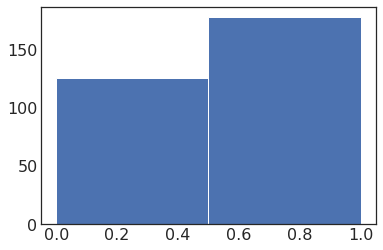

In [192]:
classes=[]
for index, value in targets.items():
    if value == 'N' or value > 0:
        classes.append(0)
    else:
        classes.append(1)
plt.hist(classes, bins = 2)

# Make Mordred Features

In [193]:
from rdkit.Chem import rdmolfiles
from rdkit.Chem import rdmolops
# from rdkit.Chem import rdDistGeom
from rdkit.Chem import AllChem

In [15]:
submolecule_list = []

for i in range(len(substratesmiles)):
    smiles = substratesmiles[i]
    name = data.index[i]
    mol = rdmolfiles.MolFromSmiles(smiles)
    mol_with_hs = rdmolops.AddHs(mol)

    v3_params = AllChem.ETKDGv3()
    v3_params.enforceChirality = True
    v3_params.useRandomCoordinates = True
    AllChem.EmbedMolecule(mol_with_hs, v3_params)

    params = AllChem.ETKDGv3()
    params.enforceChirality = True
    params.maxAttempts = 10000
    AllChem.EmbedMultipleConfs(mol_with_hs, 10, params)

    # if embedding failed, return name of molecule
    if mol_with_hs.GetNumConformers() == 0:
        print("Embedding failed for molecule {}".format(name, smiles))
        continue

    submolecule_list.append(mol_with_hs)

[09:58:11] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:11] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[09:58:11] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:11] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[09:58:12] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:12] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[09:58:12] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:12] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[09:58:19] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:19] UFFTYPER: Unrecognized atom type: S_6+6 (36)
[09:58:19] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[09:58:19] UFFTYPER: Unrecognized atom type: S_6+6 (36)


KeyboardInterrupt: 

In [ ]:
writer = Chem.SDWriter('rdkit_conformers/rdkit_confs_all.sdf')
for i in range(len(submolecule_list)):
    mol_id = data.index[i]
    mol = submolecule_list[i]
    if mol.GetNumConformers() < 1:
        print(mol_id)
    else:
        writer.write(mol, confId=0)

In [ ]:
suppl = Chem.SDMolSupplier('rdkit_conformers/rdkit_confs_all.sdf')
submolecule_conf0_list = []
for mol in suppl:
    submolecule_conf0_list.append(mol)

[18:16:24] ERROR: EOF hit while reading atoms
[18:16:24] ERROR: moving to the beginning of the next molecule


In [ ]:
len(submolecule_conf0_list)

304

In [16]:
submolecule2D_list = []

for i in range(len(substratesmiles)):
    smiles = substratesmiles[i]
    name = data.index[i]
    mol = rdmolfiles.MolFromSmiles(smiles)
    submolecule2D_list.append(mol)

In [17]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df = calc.pandas(submolecule2D_list)

100%|██████████| 304/304 [00:47<00:00,  6.39it/s]


In [194]:
subfeatures_df

,ABC,ABCGG,nAcid,nBase,SpAbs_A,...,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
1,14.666672,12.145219,0,0,23.725036,...,24,92.0,99.0,8.145833,4.583333
2,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
3,12.837312,10.747326,0,0,22.380237,...,20,78.0,83.0,6.333333,4.416667
4,16.149835,13.345719,0,0,26.171815,...,28,102.0,111.0,9.256944,5.027778
...,...,...,...,...,...,...,...,...,...,...,...
299,28.587662,23.540835,0,0,41.758959,...,58,200.0,234.0,17.361111,7.111111
300,15.613368,12.800227,0,0,26.608945,...,26,104.0,122.0,5.666667,4.444444
301,22.100515,17.213143,0,0,34.199068,...,42,152.0,178.0,11.513889,5.777778
302,28.587662,23.540835,0,0,41.758959,...,58,200.0,234.0,17.361111,7.111111


In [195]:
#calc = Calculator(descriptors, ignore_3D=False)
#subfeatures_df = calc.pandas(submolecule_conf0_list)

In [196]:
#subfeatures_df.PNSA1

In [197]:
#subfeatures_df

In [198]:
subfeatures_df.shape

(304, 1613)

In [199]:
subfeatures_df.dropna(inplace=True, thresh=int(0.9*len(subfeatures_df.index)))
threshold = 0.5
subfeatures_df.drop(subfeatures_df.std()[subfeatures_df.std() < threshold].index.values, axis=1)
subfeatures_df.columns = [ent.strip() for ent in subfeatures_df.columns]
subfeatures_df.head()

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


,ABC,ABCGG,nAcid,nBase,SpAbs_A,...,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
1,14.666672,12.145219,0,0,23.725036,...,24,92.0,99.0,8.145833,4.583333
2,12.239595,10.328049,0,0,21.058346,...,18,74.0,78.0,6.083333,4.083333
3,12.837312,10.747326,0,0,22.380237,...,20,78.0,83.0,6.333333,4.416667
4,16.149835,13.345719,0,0,26.171815,...,28,102.0,111.0,9.256944,5.027778


In [200]:
#feats_to_add = ['cl_conc_(mm)', 'time_between_transporter_added_and_lysis_(s)']

#for f in feats_to_add:
#    subfeatures_df[f] = data[f]

# change column name "time_between_transporter_added_and_lysis_(s)" to  "$\Delta t$"
# change column name "cl_conc_(mm)" to "[Cl$^{-}]$"
#subfeatures_df = subfeatures_df.rename(columns={"time_between_transporter_added_and_lysis_(s)": "$\Delta t$", "cl_conc_(mm)": "[Cl$^{-}]$"})

#subfeatures_df

In [201]:
log.info(subfeatures_df)
subfeature_types = "some_categorical" # other options 'some_categorical', 'no_categorical'

           ABC      ABCGG  nAcid  nBase    SpAbs_A  ...  WPol  Zagreb1  \
0    12.239595  10.328049      0      0  21.058346  ...    18     74.0   
1    14.666672  12.145219      0      0  23.725036  ...    24     92.0   
2    12.239595  10.328049      0      0  21.058346  ...    18     74.0   
3    12.837312  10.747326      0      0  22.380237  ...    20     78.0   
4    16.149835  13.345719      0      0  26.171815  ...    28    102.0   
..         ...        ...    ...    ...        ...  ...   ...      ...   
299  28.587662  23.540835      0      0  41.758959  ...    58    200.0   
300  15.613368  12.800227      0      0  26.608945  ...    26    104.0   
301  22.100515  17.213143      0      0  34.199068  ...    42    152.0   
302  28.587662  23.540835      0      0  41.758959  ...    58    200.0   
303  28.587662  23.540835      0      0  41.758959  ...    58    200.0   

     Zagreb2   mZagreb1  mZagreb2  
0       78.0   6.083333  4.083333  
1       99.0   8.145833  4.583333  
2  

In [202]:
class_targets_df = pd.DataFrame(np.array([classes]).T, columns=["classes"])
features_and_classes_df = subfeatures_df.copy()
features_and_classes_df["classes"] = classes

In [203]:
subfeatures_df.to_csv("features.csv")

# Pearson correlation coefficent and Spearman's rank correlation coefficient
In the next cells we can investigate how well each bit correlates against our property of interest and checks for signficance using a one tail permutation test: how many times out of the n_sample do I obtain a correlation coefficient that is greater than the observed value.

In the next block the feature with a reasonable correlation and statistically significant are chosen. The sig_metric is the significance testing metric correlation coefficent names are two tail p tests. to do one tail enter replacing option with gt for greater than and lt for less than and the correction coefficent name one of pearsron, spearman or kendalltau, onetail_$option_$correlation_coefficent.

In [29]:
subreasonable_predicted_properties, subsignificant_fearures = cwf.find_correlating_features(subfeatures_df, classes, thresh=0.2, 
                                                                                      plot=False, corr_method="spearman", 
                                                                                      sig_metric="spearman", process_non_numeric=True, 
                                                                                      sig_level=0.05, significance=True, n_sample=5000)

[1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0]
Significance will be calculated for the correlations


nBase: 0.3215 P: 0.0002 Significant at 0.0500 level? True
nF: 0.2079 P: 0.0012 Significant at 0.0500 level? True
nX: 0.2279 P: 0.0002 Significant at 0.0500 level? True
AATS1se: 0.2132 P: 0.0002 Significant at 0.0500 level? True
AATS2se: 0.2003 P: 0.0004 Significant at 0.0500 level? True
AATS1pe: 0.2067 P: 0.0004 Significant at 0.0500 level? True
AATS1are: 0.2171 P: 0.0002 Significant at 0.0500 level? True
AATS3are: 0.2000 P: 0.0004 Significant at 0.0500 level? True
AATS0i: 0.2465 P: 0.0002 Significant at 0.0500 level? True
AATS1i: 0.2564 P: 0.0002 Significant at 0.0500 level? True
AATS2i: 0.2172 P: 0.0004 Significant at 0.0500 level? True
AATS8i: 0.2263 P: 0.0002 Significant at 0.0500 level? True
ATSC0c: 0.2557 P: 0.0002 Significant at 0.0500 level? True
ATSC3c: 0.2700 P: 0.0002 Significant at 0.0500 level? True
ATSC4c: -0.3180 P: 0.0002 Significant at 0.0500 level? True
ATSC3s: 0.2093 P: 0.0006 Significant at 0.0500 level? True
ATSC0se: 0.2073 P: 0.0004 Significant at 0.0500 level? Tr

In [30]:
log.info("{} {}".format(len(subreasonable_predicted_properties), subreasonable_predicted_properties))
log.info("{} {}".format(len(subsignificant_fearures), subsignificant_fearures))
use_significant = True
use_reasonable = False

127 ['nBase', 'nF', 'nX', 'AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i', 'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c', 'ATSC3c', 'ATSC4c', 'ATSC3s', 'ATSC0se', 'ATSC0pe', 'ATSC0are', 'ATSC6are', 'ATSC0i', 'ATSC6i', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC3s', 'AATSC0v', 'AATSC6se', 'AATSC6pe', 'AATSC6are', 'AATSC1i', 'AATSC6i', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6s', 'MATS3se', 'MATS6se', 'MATS6pe', 'MATS3are', 'MATS6are', 'MATS6i', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS8c', 'GATS4d', 'GATS5s', 'GATS6s', 'GATS3v', 'GATS7v', 'GATS3se', 'GATS5se', 'GATS6se', 'GATS3pe', 'GATS5pe', 'GATS6pe', 'GATS3are', 'GATS5are', 'GATS6are', 'GATS6i', 'BCUTc-1h', 'BCUTc-1l', 'BCUTi-1h', 'BCUTi-1l', 'SM1_Dzv', 'SM1_Dzare', 'SM1_Dzp', 'SM1_Dzi', 'nBondsD', 'AXp-5d', 'AXp-4dv', 'AXp-5dv', 'AXp-6dv', 'AXp-7dv', 'Mi', 'NdsCH', 'NdssC', 'NaaaC', 'NsF', 'NaaS', 'SdsCH', 'SaaCH', 'SaaaC', 'SaaNH', 'SssO', 'SaaS', 'AETA_alpha', 'ETA_shape_p', 'ETA_psi_1', 'ETA_dPsi_A', 'PEOE_VSA4',

In [76]:
subfeats_df = pd.DataFrame()

if use_significant is True:
    for k in subsignificant_fearures:
        subfeats_df[k] = subfeatures_df[k]
        
elif use_reasonable is True:
    for k in subreasonable_predicted_properties:
        subfeats_df[k] = subfeatures_df[k]

/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_98388/650948883.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  subfeats_df[k] = subfeatures_df[k]
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_98388/650948883.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  subfeats_df[k] = subfeatures_df[k]
/var/folders/_g/b42gzqq15333k7_yvwzzfxzr0000gp/T/ipykernel_98388/650948883.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has p

# Feature exploration
In the section I explore the features and their relationships. 
Use these two next cells to classify the amines into 'good' and 'bad' in terms of capacity. To visualize all of these structure set show to True.

In [77]:
pd.set_option('display.max_columns', len(subfeats_df.columns))
subfeats_df.describe()

,nBase,nF,nX,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,AATS0i,AATS1i,AATS2i,AATS8i,ATSC0c,ATSC3c,ATSC4c,ATSC3s,ATSC0se,ATSC0pe,ATSC0are,ATSC6are,ATSC0i,ATSC6i,AATSC0c,AATSC2c,AATSC3c,AATSC4c,AATSC3s,AATSC0v,AATSC6se,AATSC6pe,AATSC6are,AATSC1i,AATSC6i,MATS1c,MATS2c,MATS3c,MATS4c,MATS6s,MATS3se,MATS6se,MATS6pe,MATS3are,MATS6are,MATS6i,GATS2c,GATS3c,GATS5c,GATS8c,GATS4d,GATS5s,GATS6s,GATS3v,GATS7v,GATS3se,GATS5se,GATS6se,GATS3pe,GATS5pe,GATS6pe,GATS3are,GATS5are,GATS6are,GATS6i,BCUTc-1h,BCUTc-1l,BCUTi-1h,BCUTi-1l,SM1_Dzv,SM1_Dzare,SM1_Dzp,SM1_Dzi,nBondsD,AXp-5d,AXp-4dv,AXp-5dv,AXp-6dv,AXp-7dv,Mi,NdsCH,NdssC,NaaaC,NsF,NaaS,SdsCH,SaaCH,SaaaC,SaaNH,SssO,SaaS,AETA_alpha,ETA_shape_p,ETA_psi_1,ETA_dPsi_A,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,SMR_VSA1,EState_VSA1,EState_VSA7,VSA_EState1,VSA_EState3,MID_X,AMID_X,nARing,n5ARing,nAHRing,n5AHRing,nFRing,n9FRing,nFHRing,n9FHRing,nFaRing,n9FaRing,nFaHRing,n9FaHRing,GGI8,GGI9,JGI1,JGI2,JGI4,JGI8,JGI9,JGT10
count,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000,304.000000
mean,0.200658,2.601974,2.648026,7.888347,7.994114,6.650268,6.508950,6.277447,167.217232,149.284133,156.878626,161.672910,1.073517,-0.014532,-0.252761,12.141505,5.787405,8.898301,10.025168,1.094044,130.287270,41.024756,0.021283,0.003455,-0.000129,-0.002163,0.097095,47.806789,0.003601,0.004859,0.007436,-0.101671,0.363829,-0.624065,0.176566,-0.023859,-0.086463,-0.001302,-0.005427,-0.029663,-0.018137,0.002377,-0.018352,0.099539,0.824169,1.054503,1.146079,0.829288,0.959563,1.105171,1.073119,1.059994,1.028658,0.884715,1.138321,1.143977,0.876781,1.083567,1.073707,0.881479,1.105641,1.093032,0.838097,0.465680,-0.387315,15.633354,10.664485,-3.131017,2.149560,-8.534159,1.980479,2.213816,0.080557,0.052578,0.028437,0.015665,0.008701,1.139263,0.378289,1.710526,1.032895,2.601974,0.217105,0.745456,12.749150,0.778999,1.377208,1.226895,0.313582,0.473980,0.149671,0.552489,0.161730,10.408973,2.754786,28.088920,3.834701,4.879368,1.188796,3.347817,17.907112,18.261409,21.856749,35.476703,10.328376,4.496120,0.121731,0.223684,0.154605,0.207237,0.154605,0.467105,0.338816,0.463816,0.338816,0.407895,0.332237,0.404605,0.332237,0.303501,0.243478,0.212392,0.069716,0.038221,0.009094,0.008099,0.444370
std,0.401153,4.233623,4.213501,0.311417,0.604534,0.366898,0.379233,0.539388,8.829752,3.427310,7.878094,6.191137,0.545774,0.345966,0.293735,40.143066,5.491272,7.720620,9.311242,4.973179,91.555196,84.169889,0.007770,0.004459,0.003140,0.002883,0.293687,6.097572,0.021246,0.030303,0.037664,0.173621,0.627064,0.170683,0.192914,0.141482,0.114529,0.135560,0.106364,0.155290,0.147795,0.099921,0.155117,0.129051,0.227571,0.15541

The next cell shows counts of for each sub-structure bit how many with and how many without that sub-structure are in each class

In [88]:
corr_matrix = subfeats_df.corr()

# Create a heatmap visualization of the correlation matrix
#plt.figure(figsize=(7, 6), dpi=300)
plt.figure(figsize=(32, 28), dpi=300)
sns.heatmap(corr_matrix, annot=False, cmap=sns.diverging_palette(230, 0, 90, 60, as_cmap=True), vmin=-1, vmax=1, center=0)
plt.title("Correlation Matrix")
plt.savefig('corr_matrix.png')
plt.show()


Performing Variance Inflation Factor (VIF) test. It has been commented out here as for our dataset there is high multicolliniarity and actually all features should be removed

In [79]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Calculate VIF for each predictor variable
# vif_df = pd.DataFrame()
# vif_df["feature"] = features_df.columns
# vif_df["VIF"] = [variance_inflation_factor(features_df.values, i) for i in range(features_df.shape[1])]

# # Print the VIF values
# print(vif_df)

# # Remove any predictor variables with high VIF values
# # Change threshold approprietly
# vif_threshold = 10
# high_vif_features = vif_df[vif_df["VIF"] > vif_threshold]["feature"].values
# if len(high_vif_features) > 0:
#     print("Removing high VIF features:", high_vif_features)
#     features_df.drop(high_vif_features, axis=1, inplace=True)

The code generates histograms of the features in the "features_df" dataframe, and separates the histograms based on the class labels in the "classes" column of the "features_and_classes_df" dataframe.

Over all classes


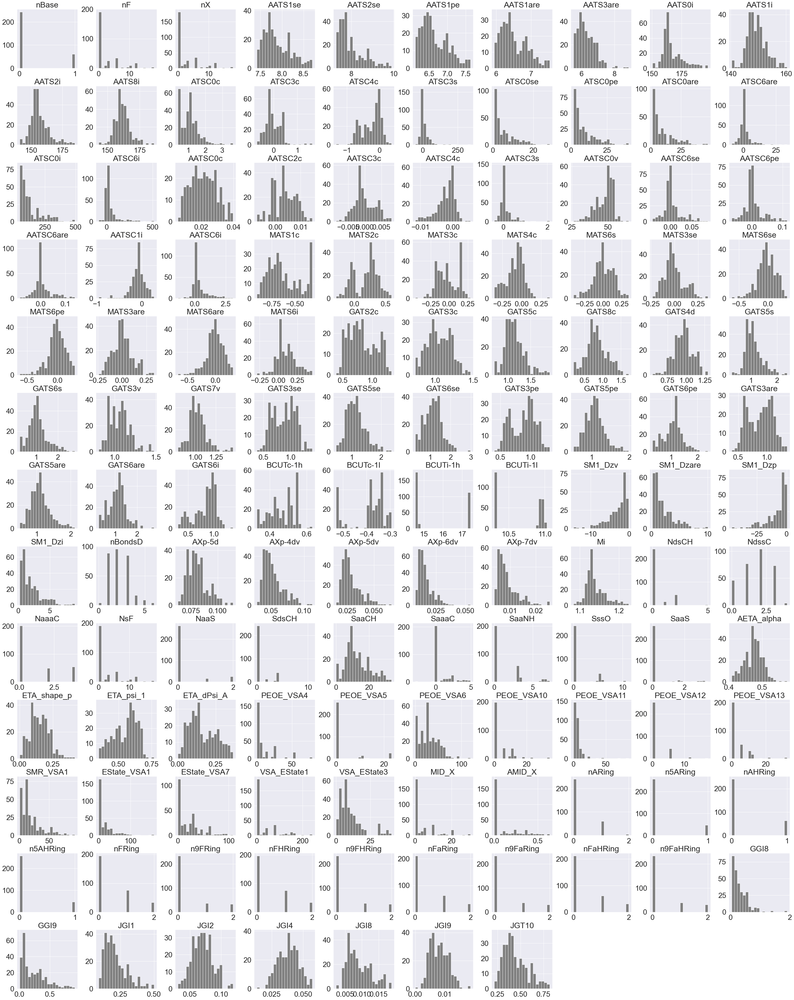

Class 0 only


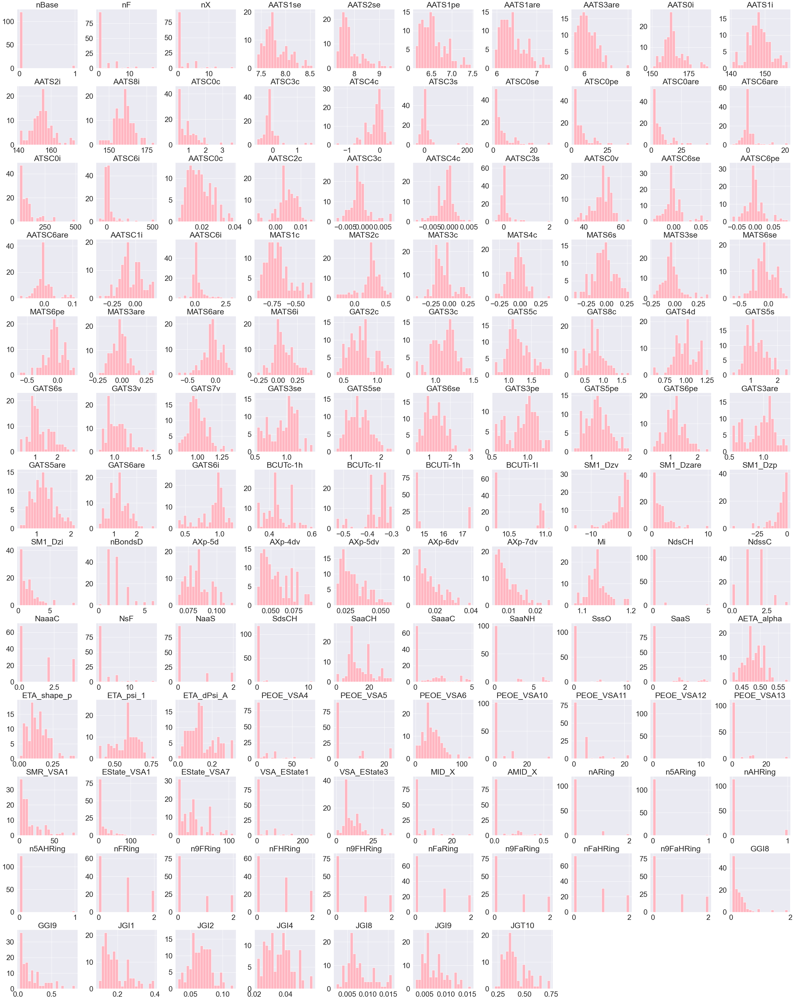

Class 1 only


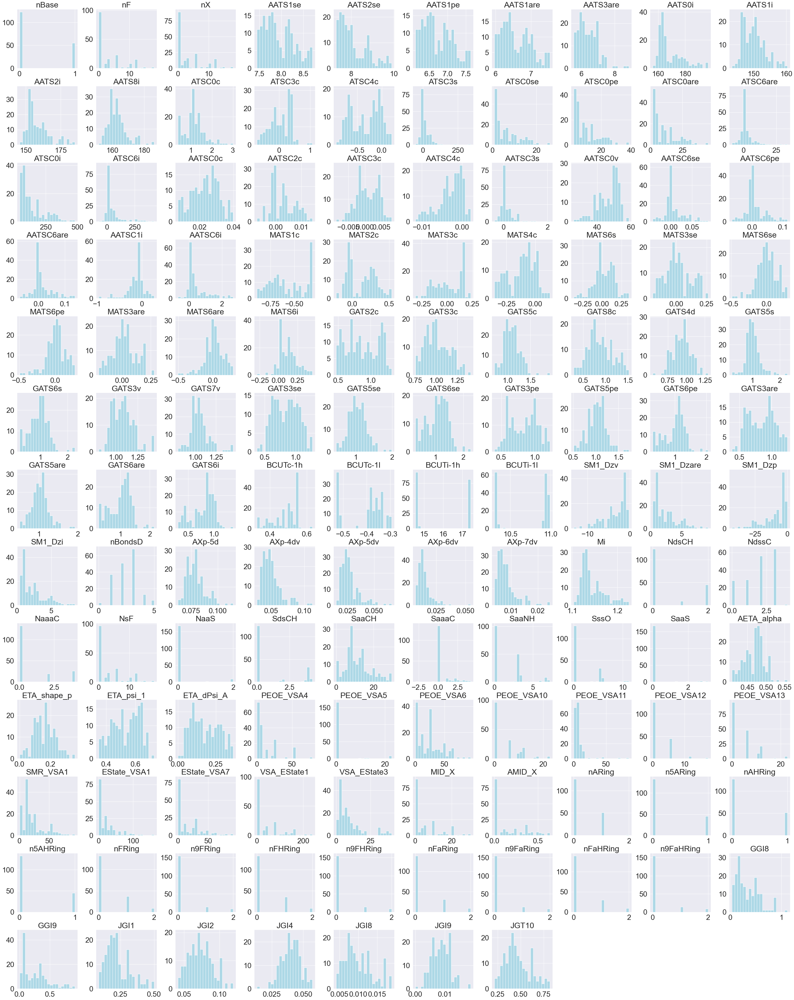

In [86]:
#figsize = (20,20)
layout = (13,10)
figsize = (layout[1]*5,layout[0]*5)


log.info("Over all classes")
subfeats_df.hist(bins=20, figsize=figsize, color="grey", layout=layout)
plt.savefig("features_all_classes.png")
plt.show()

log.info("Class 0 only")
subfeats_df[features_and_classes_df["classes"]==0].hist(bins=20, figsize=figsize, color="lightpink", layout=layout)
plt.savefig("features_class_0.png")
plt.show()

log.info("Class 1 only")
subfeats_df[features_and_classes_df["classes"]==1].hist(bins=20, figsize=figsize, color="lightblue", layout=layout)
plt.savefig("features_class_1.png")
plt.show()

In [204]:
subfeats_df["classes"] = features_and_classes_df["classes"]

In [205]:
#features_plot = sns.pairplot(subfeats_df, hue="classes", diag_kind="kde", kind="scatter", palette = ["red", "blue"], corner=True)
#features_plot.savefig("var_features_plot.png")
#features_plot

In [206]:
# Remove features with "drop" as you see fit according to your model.

In [207]:
subfeats_df

,nBase,nF,nX,AATS1se,AATS2se,...,JGI4,JGI8,JGI9,JGT10,classes
0,0,0,1,7.570703,7.440561,...,0.038815,0.006383,0.006518,0.369222,1
1,0,3,3,7.799960,7.929125,...,0.033439,0.007122,0.008563,0.498070,1
2,0,0,1,7.590230,7.462877,...,0.038815,0.006383,0.006518,0.369222,0
3,0,0,0,7.568032,7.420755,...,0.036601,0.005222,0.005703,0.351676,1
4,0,3,3,7.848118,7.982193,...,0.039289,0.012850,0.007042,0.512276,1
...,...,...,...,...,...,...,...,...,...,...,...
299,0,0,0,7.462749,7.325863,...,0.057143,0.015837,0.010563,0.737485,0
300,0,0,0,7.638383,7.579171,...,0.049293,0.004115,0.002812,0.381115,0
301,0,6,6,8.161369,8.714257,...,0.047407,0.016998,0.011875,0.635111,1
302,0,12,12,8.547925,9.490894,...,0.057143,0.015837,0.010563,0.737485,0


In [208]:
subfeats_df.to_csv("features_and_classes.csv")

In [209]:
features_df = subfeats_df.drop(["classes"], axis=1)

In [210]:
features_df.to_csv("features.csv")

The next cell is more geared for continuous data but shows the break down of the molecules in each class into bins of not haveing a sub-structure (0 x-axis) and having a sub-structure (1 x-axis).

# Classification
In this section we test out a range of classification models.

## Data scaling

In [211]:
features_df = pd.read_csv("features.csv", index_col=0)

In [212]:
features_df

,nBase,nF,nX,AATS1se,AATS2se,...,JGI2,JGI4,JGI8,JGI9,JGT10
0,0,0,1,7.570703,7.440561,...,0.055556,0.038815,0.006383,0.006518,0.369222
1,0,3,3,7.799960,7.929125,...,0.076923,0.033439,0.007122,0.008563,0.498070
2,0,0,1,7.590230,7.462877,...,0.055556,0.038815,0.006383,0.006518,0.369222
3,0,0,0,7.568032,7.420755,...,0.052910,0.036601,0.005222,0.005703,0.351676
4,0,3,3,7.848118,7.982193,...,0.084291,0.039289,0.012850,0.007042,0.512276
...,...,...,...,...,...,...,...,...,...,...,...
299,0,0,0,7.462749,7.325863,...,0.096296,0.057143,0.015837,0.010563,0.737485
300,0,0,0,7.638383,7.579171,...,0.063492,0.049293,0.004115,0.002812,0.381115
301,0,6,6,8.161369,8.714257,...,0.101010,0.047407,0.016998,0.011875,0.635111
302,0,12,12,8.547925,9.490894,...,0.096296,0.057143,0.015837,0.010563,0.737485


In [213]:
features_df_scaled = cwf.feature_categorization(features_df, feature_types = "some_categorical")

Numerical features:
['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i', 'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c', 'ATSC3c', 'ATSC4c', 'ATSC3s', 'ATSC0se', 'ATSC0pe', 'ATSC0are', 'ATSC6are', 'ATSC0i', 'ATSC6i', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC3s', 'AATSC0v', 'AATSC6se', 'AATSC6pe', 'AATSC6are', 'AATSC1i', 'AATSC6i', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6s', 'MATS3se', 'MATS6se', 'MATS6pe', 'MATS3are', 'MATS6are', 'MATS6i', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS8c', 'GATS4d', 'GATS5s', 'GATS6s', 'GATS3v', 'GATS7v', 'GATS3se', 'GATS5se', 'GATS6se', 'GATS3pe', 'GATS5pe', 'GATS6pe', 'GATS3are', 'GATS5are', 'GATS6are', 'GATS6i', 'BCUTc-1h', 'BCUTc-1l', 'BCUTi-1h', 'BCUTi-1l', 'SM1_Dzv', 'SM1_Dzare', 'SM1_Dzp', 'SM1_Dzi', 'AXp-5d', 'AXp-4dv', 'AXp-5dv', 'AXp-6dv', 'AXp-7dv', 'Mi', 'SdsCH', 'SaaCH', 'SaaaC', 'SaaNH', 'SssO', 'SaaS', 'AETA_alpha', 'ETA_shape_p', 'ETA_psi_1', 'ETA_dPsi_A', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PE

      AATS1se   AATS2se   AATS1pe  AATS1are  AATS3are  ...  nFaHRing_1  \
0    0.120128  0.063643  0.098016  0.094666  0.044727  ...         0.0   
1    0.298224  0.250473  0.277538  0.285835  0.128346  ...         0.0   
2    0.135297  0.072177  0.107358  0.098593  0.047718  ...         0.0   
3    0.118053  0.056069  0.105949  0.111313  0.050916  ...         0.0   
4    0.335636  0.270767  0.313039  0.319582  0.187022  ...         0.0   
..        ...       ...       ...       ...       ...  ...         ...   
299  0.036265  0.019781  0.035271  0.040611  0.120240  ...         0.0   
300  0.172704  0.116648  0.191036  0.172084  0.147702  ...         0.0   
301  0.578982  0.550713  0.591048  0.575661  0.363485  ...         0.0   
302  0.879275  0.847704  0.886709  0.873957  0.521726  ...         0.0   
303  0.000000  0.000000  0.000000  0.000000  0.093082  ...         0.0   

     nFaHRing_2  n9FaHRing_0  n9FaHRing_1  n9FaHRing_2  
0           0.0          1.0          0.0          0.0

In [214]:
feature_types = "categorical"

In [215]:
features_df = features_df_scaled.copy()

In [216]:
feats_to_add = ['cl_conc_(mm)', 'time_between_transporter_added_and_lysis_(s)']

substructure_name_list = ['thiourea',
                     'urea', 
                     'squaramide', 
                     'indole', 
                     'tambjamine', 
                     'carbazole', 
                     'acridinone', 
                     'perenosin',
                     'bisbzimpy', 
                     'isophthalamides_dipicolineamides']

for f in feats_to_add:
    features_df[f] = data[f]

for f in substructure_name_list:
    features_df[f] = data[f]

# change column name "time_between_transporter_added_and_lysis_(s)" to  "$\Delta t$"
# change column name "cl_conc_(mm)" to "[Cl$^{-}]$"
features_df = features_df.rename(columns={"time_between_transporter_added_and_lysis_(s)": "$\Delta t$", "cl_conc_(mm)": "[Cl$^{-}]$"})

features_df

,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,...,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.120128,0.063643,0.098016,0.094666,0.044727,...,0,0,0,0,0
1,0.298224,0.250473,0.277538,0.285835,0.128346,...,0,0,0,0,0
2,0.135297,0.072177,0.107358,0.098593,0.047718,...,0,0,0,0,0
3,0.118053,0.056069,0.105949,0.111313,0.050916,...,0,0,0,0,0
4,0.335636,0.270767,0.313039,0.319582,0.187022,...,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
299,0.036265,0.019781,0.035271,0.040611,0.120240,...,0,0,0,0,0
300,0.172704,0.116648,0.191036,0.172084,0.147702,...,0,0,0,0,0
301,0.578982,0.550713,0.591048,0.575661,0.363485,...,0,0,0,0,0
302,0.879275,0.847704,0.886709,0.873957,0.521726,...,0,0,0,0,0


## Using synthetic data sampling

In this section I investigate the use of synthetic sampling methods, i.e. generate additional sampling points for the minority class or undersample the majority class. Both of these techniques look to provide a better balence between the classes and hence improve the learning of a decision boundary. SMOTE https://arxiv.org/pdf/1106.1813.pdf.


In [217]:
nneighbours = min(5, len(class_targets_df[class_targets_df["classes"]==1].index)-1)
log.info("Number of neighbours used for SMOTE: {}".format(nneighbours))

# feature_types is set when the fingerprints are calculated
# No catagorical
if feature_types == "no_categorical":
    sm = SMOTE(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# Some catagorical - Need to provide the indexes
elif feature_types == "some_categorical":
    sm = SMOTENC(sampling_strategy="not majority", categorical_features=catagorical_indxs, random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# All catagorical
elif feature_types == "categorical":
    sm = SMOTEN(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)

Number of neighbours used for SMOTE: 5


Check that there are only features in the feature dataframe and classes in the classes dataframe.

In [218]:
log.info("Feature decriptions:\n{}".format(features_df.columns.values))
log.info("Classes/Targets descriptions:\n{}".format(class_targets_df.columns.values))

Feature decriptions:
['AATS1se' 'AATS2se' 'AATS1pe' 'AATS1are' 'AATS3are' 'AATS0i' 'AATS1i'
 'AATS2i' 'AATS8i' 'ATSC0c' 'ATSC3c' 'ATSC4c' 'ATSC3s' 'ATSC0se' 'ATSC0pe'
 'ATSC0are' 'ATSC6are' 'ATSC0i' 'ATSC6i' 'AATSC0c' 'AATSC2c' 'AATSC3c'
 'AATSC4c' 'AATSC3s' 'AATSC0v' 'AATSC6se' 'AATSC6pe' 'AATSC6are' 'AATSC1i'
 'AATSC6i' 'MATS1c' 'MATS2c' 'MATS3c' 'MATS4c' 'MATS6s' 'MATS3se'
 'MATS6se' 'MATS6pe' 'MATS3are' 'MATS6are' 'MATS6i' 'GATS2c' 'GATS3c'
 'GATS5c' 'GATS8c' 'GATS4d' 'GATS5s' 'GATS6s' 'GATS3v' 'GATS7v' 'GATS3se'
 'GATS5se' 'GATS6se' 'GATS3pe' 'GATS5pe' 'GATS6pe' 'GATS3are' 'GATS5are'
 'GATS6are' 'GATS6i' 'BCUTc-1h' 'BCUTc-1l' 'BCUTi-1h' 'BCUTi-1l' 'SM1_Dzv'
 'SM1_Dzare' 'SM1_Dzp' 'SM1_Dzi' 'AXp-5d' 'AXp-4dv' 'AXp-5dv' 'AXp-6dv'
 'AXp-7dv' 'Mi' 'SdsCH' 'SaaCH' 'SaaaC' 'SaaNH' 'SssO' 'SaaS' 'AETA_alpha'
 'ETA_shape_p' 'ETA_psi_1' 'ETA_dPsi_A' 'PEOE_VSA4' 'PEOE_VSA5'
 'PEOE_VSA6' 'PEOE_VSA10' 'PEOE_VSA11' 'PEOE_VSA12' 'PEOE_VSA13'
 'SMR_VSA1' 'EState_VSA1' 'EState_VSA7' 'VSA_EState1'

In [219]:
features_df.columns.values

array(['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i',
       'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c', 'ATSC3c', 'ATSC4c',
       'ATSC3s', 'ATSC0se', 'ATSC0pe', 'ATSC0are', 'ATSC6are', 'ATSC0i',
       'ATSC6i', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC3s',
       'AATSC0v', 'AATSC6se', 'AATSC6pe', 'AATSC6are', 'AATSC1i',
       'AATSC6i', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6s',
       'MATS3se', 'MATS6se', 'MATS6pe', 'MATS3are', 'MATS6are', 'MATS6i',
       'GATS2c', 'GATS3c', 'GATS5c', 'GATS8c', 'GATS4d', 'GATS5s',
       'GATS6s', 'GATS3v', 'GATS7v', 'GATS3se', 'GATS5se', 'GATS6se',
       'GATS3pe', 'GATS5pe', 'GATS6pe', 'GATS3are', 'GATS5are',
       'GATS6are', 'GATS6i', 'BCUTc-1h', 'BCUTc-1l', 'BCUTi-1h',
       'BCUTi-1l', 'SM1_Dzv', 'SM1_Dzare', 'SM1_Dzp', 'SM1_Dzi', 'AXp-5d',
       'AXp-4dv', 'AXp-5dv', 'AXp-6dv', 'AXp-7dv', 'Mi', 'SdsCH', 'SaaCH',
       'SaaaC', 'SaaNH', 'SssO', 'SaaS', 'AETA_alpha', 'ETA_shape_p',
       'ETA_psi_1', 

Sample using smote to balence the dataset using synthetic samples for the under represented class.

In [220]:
features_smote, classes_smote = sm.fit_resample(features_df.to_numpy(), class_targets_df.to_numpy())
n_sythetic_points = features_smote.shape[0] - len(features_df.index)
log.info("SMOTE has added {} sythetic features to balence the classes".format(n_sythetic_points))

The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
SMOTE has added 52 sythetic features to balence the classes


In [221]:
log.info("Resampled X\n{}\n{}\nResampled y:\n{}\n{}".format(features_smote, features_smote.shape, classes_smote, classes_smote.shape))

Resampled X
[[0.12012777 0.06364277 0.09801589 ... 0.         0.         0.        ]
 [0.29822446 0.25047299 0.27753763 ... 0.         0.         0.        ]
 [0.13529726 0.07217683 0.10735765 ... 0.         0.         0.        ]
 ...
 [0.12427568 0.06976706 0.10268677 ... 0.         0.         0.        ]
 [0.14402118 0.08546055 0.12064402 ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
(356, 214)
Resampled y:
[1 1 0 1 1 0 0 0 0 0 1 0 1 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 0 0 1 0
 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1
 1 1 0 0 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 1 0 0 1 1 1 0 0 1 1 1 0 1 1
 1 0 0 0 0 1 1 0 1 0 1 0 1 0 0 1 1 0 1 1 1 0 1 1 1 0 0 0 1 1 1 1 1 1 0 0 1
 0 1 1 1 0 0 1 0 1 0 1 0 0 1 1 1 1 1 1 0 0 0 0 1 1 0 1 0 0 0 0 0 1 0 1 1 1
 1 0 0 1 1 1 0 0 0 0 0 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1

In [222]:
features_smote_df = pd.DataFrame(data=features_smote, columns=features_df.columns.values)
classes_smote_df = pd.DataFrame(data=classes_smote, columns=["classes"])

comb_df_res = features_smote_df.copy()
comb_df_res["classes"] = classes_smote
comb_df_res.to_csv("resampled_synthetic_data_set.csv")
comb_df_res

,AATS1se,AATS2se,AATS1pe,AATS1are,AATS3are,...,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides,classes
0,0.120128,0.063643,0.098016,0.094666,0.044727,...,0.0,0.0,0.0,0.0,1
1,0.298224,0.250473,0.277538,0.285835,0.128346,...,0.0,0.0,0.0,0.0,1
2,0.135297,0.072177,0.107358,0.098593,0.047718,...,0.0,0.0,0.0,0.0,0
3,0.118053,0.056069,0.105949,0.111313,0.050916,...,0.0,0.0,0.0,0.0,1
4,0.335636,0.270767,0.313039,0.319582,0.187022,...,0.0,0.0,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...
351,0.243220,0.168390,0.239562,0.211080,0.143296,...,0.0,0.0,0.0,0.0,0
352,0.243220,0.139532,0.239562,0.211080,0.143296,...,0.0,0.0,0.0,0.0,0
353,0.124276,0.069767,0.102687,0.117355,0.062010,...,0.0,0.0,0.0,0.0,0
354,0.144021,0.085461,0.120644,0.113873,0.068445,...,0.0,0.0,0.0,0.0,0


## Using balenced classes Kfold
This section tests the relience of the model on the training set

In [223]:
kfold_clf_names = ["Nearest Neighbors", "Gaussian Process",
         "Decision Tree", "ExtraTreesClassifier", "AdaBoost",
         "Logistic Regression"]


kfold_classifiers = [
    KNeighborsClassifier(),
    GaussianProcessClassifier(random_state=random_seed, n_jobs=-1),
    DecisionTreeClassifier(random_state=random_seed),
    ExtraTreesClassifier(random_state=random_seed, n_jobs=-1),
    AdaBoostClassifier(random_state=random_seed),
    LogisticRegression(random_state=random_seed, n_jobs=-1, solver="lbfgs")]

kfold_classifier_parameters = {
    "Nearest Neighbors": {"n_neighbors": [ent for ent in range(2, 10, 1)]},
    "Gaussian Process": {"kernel":[1.0 * Matern(length_scale=1.0, nu=1.5), 1.0 * Matern(length_scale=1.0, nu=2.5), 1.0 * RBF(1.0),  1.0 * RBF(1.0) + WhiteKernel(noise_level=0.5)]},
    "Decision Tree": {"max_depth": [2, 3, 4, 5, 7, 10]},
    "ExtraTreesClassifier": {"max_depth": [2, 3, 4, 5, 7, 10], "n_estimators": [10, 20, 50, 100]},
    "AdaBoost": {"n_estimators": [10, 20, 50, 100]},
    "Logistic Regression": {"penalty":["l2"], "C": [0.05, 0.1, 0.25, 0.5, 1.0, 1.25]}
}

Features: Index(['AATS1se', 'AATS2se', 'AATS1pe', 'AATS1are', 'AATS3are', 'AATS0i',
       'AATS1i', 'AATS2i', 'AATS8i', 'ATSC0c',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=214)
Features:       AATS1se   AATS2se   AATS1pe  AATS1are  AATS3are    AATS0i    AATS1i  \
0    0.120128  0.063643  0.098016  0.094666  0.044727  0.245134  0.340220   
1    0.298224  0.250473  0.277538  0.285835  0.128346  0.471922  0.521061   
2    0.135297  0.072177  0.107358  0.098593  0.047718  0.262187  0.358288   
3    0.118053  0.056069  0.105949  0.111313  0.050916  0.266309  0.354123   
4    0.335636  0.270767  0.313039  0.319582  0.187022  0.454729  0.494945   
..        ...       ...       ...       ...       ...       ...       ...   
299  0.036265  0.019781  0.035271  0.040611  0.120240  0.252942  0.205180   
300  0.172704  0.116648  0.19

	Best parameters; {'n_neighbors': 8}
	0.6760 (+/-0.1767) for {'n_neighbors': 2}
	0.6798 (+/-0.1561) for {'n_neighbors': 3}
	0.6921 (+/-0.1440) for {'n_neighbors': 4}
	0.7034 (+/-0.1474) for {'n_neighbors': 5}
	0.6966 (+/-0.1559) for {'n_neighbors': 6}
	0.7009 (+/-0.1690) for {'n_neighbors': 7}
	0.7036 (+/-0.1649) for {'n_neighbors': 8}
	0.6922 (+/-0.1800) for {'n_neighbors': 9}

	----- Predicting using: Nearest_Neighbors -----
	ROC analysis area under the curve: 0.8904761904761904
	Confusion matrix (Nearest_Neighbors):
[[ 8  2]
 [ 7 14]]


	score (Nearest_Neighbors): 0.7096774193548387
	Imbalence reports:
	Imbalence classification report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.53      0.80      0.67      0.64      0.73      0.54        10
          1       0.88      0.67      0.80      0.76      0.73      0.53        21

avg / total       0.76      0.71      0.76      0.72      0.73      0.53        31

	 Index | Predicte

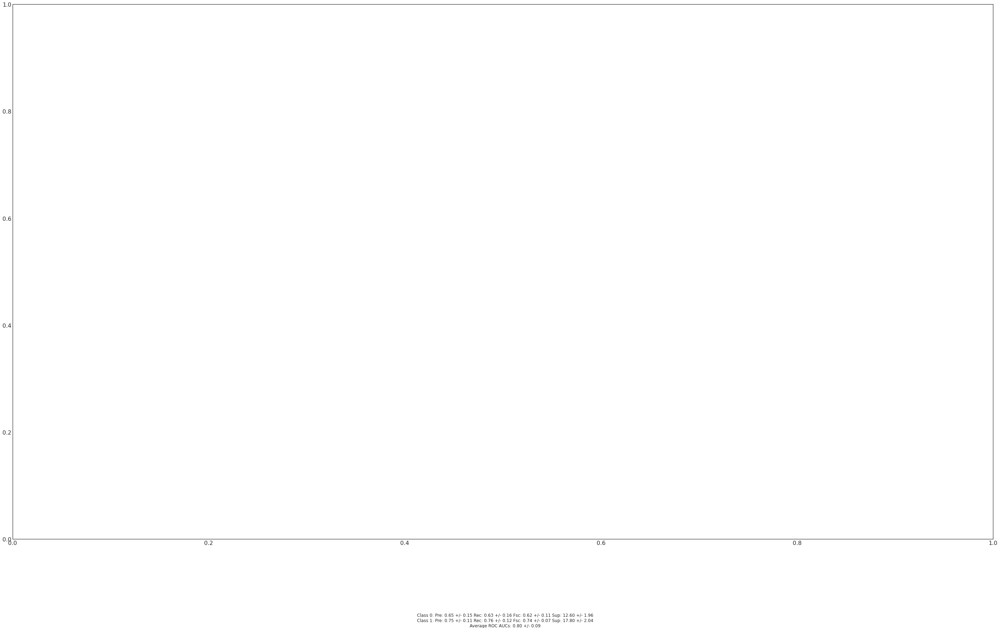


-----
Begin Gaussian Process
-----

Directory Gaussian_Process already exists will be overwritten
----- Gaussian_Process: Fold 0 -----
[18, 19, 26, 34, 48, 57, 72, 84, 93, 100, 106, 114, 116, 138, 142, 163, 171, 178, 179, 201, 211, 213, 220, 224, 244, 252, 264, 272, 286, 298, 303]
	Train indx [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  20  21  22  23  24  25  27  28  29  30  31  32  33  35  36  37  38  39
  40  41  42  43  44  45  46  47  49  50  51  52  53  54  55  56  58  59
  60  61  62  63  64  65  66  67  68  69  70  71  73  74  75  76  77  78
  79  80  81  82  83  85  86  87  88  89  90  91  92  94  95  96  97  98
  99 101 102 103 104 105 107 108 109 110 111 112 113 115 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 139
 140 141 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 172 173 174 175 176 177 180
 181 182 183 184 185 186 187 188 189 190 191 192

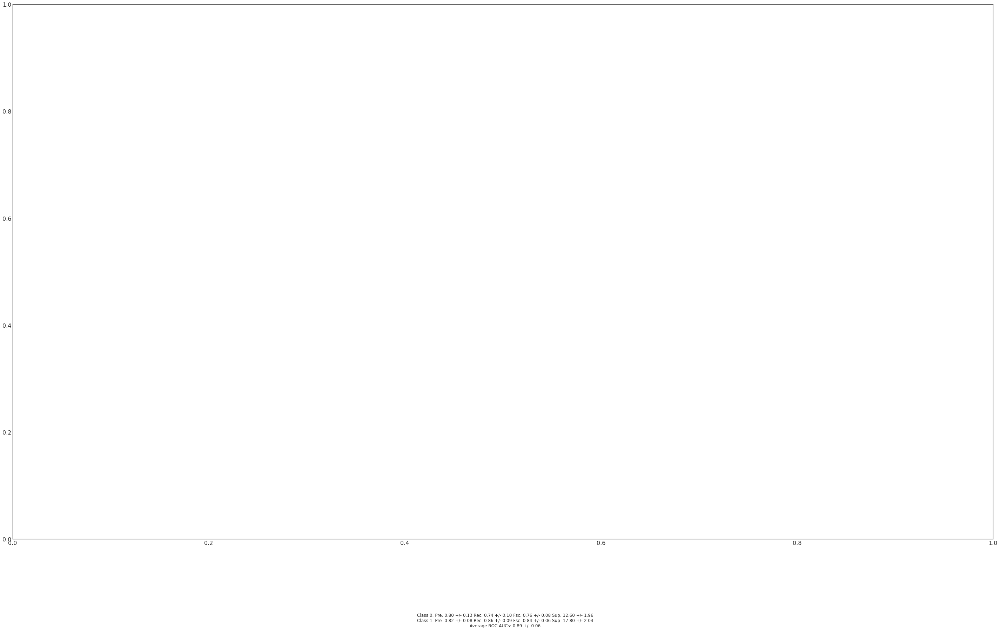


-----
Begin Decision Tree
-----

Directory Decision_Tree already exists will be overwritten
----- Decision_Tree: Fold 0 -----
[18, 19, 26, 34, 48, 57, 72, 84, 93, 100, 106, 114, 116, 138, 142, 163, 171, 178, 179, 201, 211, 213, 220, 224, 244, 252, 264, 272, 286, 298, 303]
	Train indx [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  20  21  22  23  24  25  27  28  29  30  31  32  33  35  36  37  38  39
  40  41  42  43  44  45  46  47  49  50  51  52  53  54  55  56  58  59
  60  61  62  63  64  65  66  67  68  69  70  71  73  74  75  76  77  78
  79  80  81  82  83  85  86  87  88  89  90  91  92  94  95  96  97  98
  99 101 102 103 104 105 107 108 109 110 111 112 113 115 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 139
 140 141 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 172 173 174 175 176 177 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 

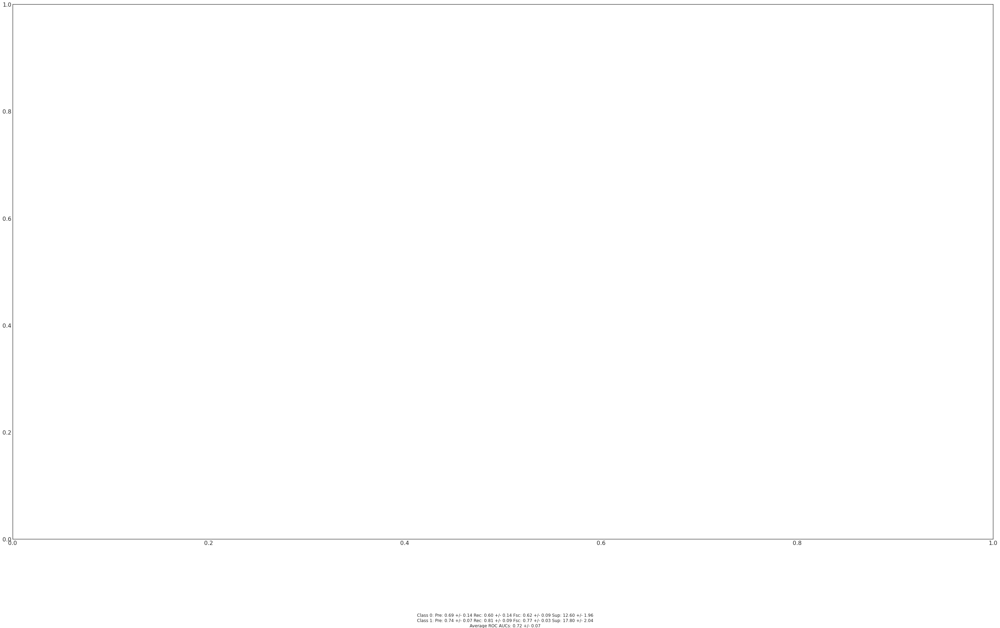


-----
Begin ExtraTreesClassifier
-----

Directory ExtraTreesClassifier already exists will be overwritten
----- ExtraTreesClassifier: Fold 0 -----
[18, 19, 26, 34, 48, 57, 72, 84, 93, 100, 106, 114, 116, 138, 142, 163, 171, 178, 179, 201, 211, 213, 220, 224, 244, 252, 264, 272, 286, 298, 303]
	Train indx [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  20  21  22  23  24  25  27  28  29  30  31  32  33  35  36  37  38  39
  40  41  42  43  44  45  46  47  49  50  51  52  53  54  55  56  58  59
  60  61  62  63  64  65  66  67  68  69  70  71  73  74  75  76  77  78
  79  80  81  82  83  85  86  87  88  89  90  91  92  94  95  96  97  98
  99 101 102 103 104 105 107 108 109 110 111 112 113 115 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 139
 140 141 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 172 173 174 175 176 177 180
 181 182 183 184 185 186 187 188 189

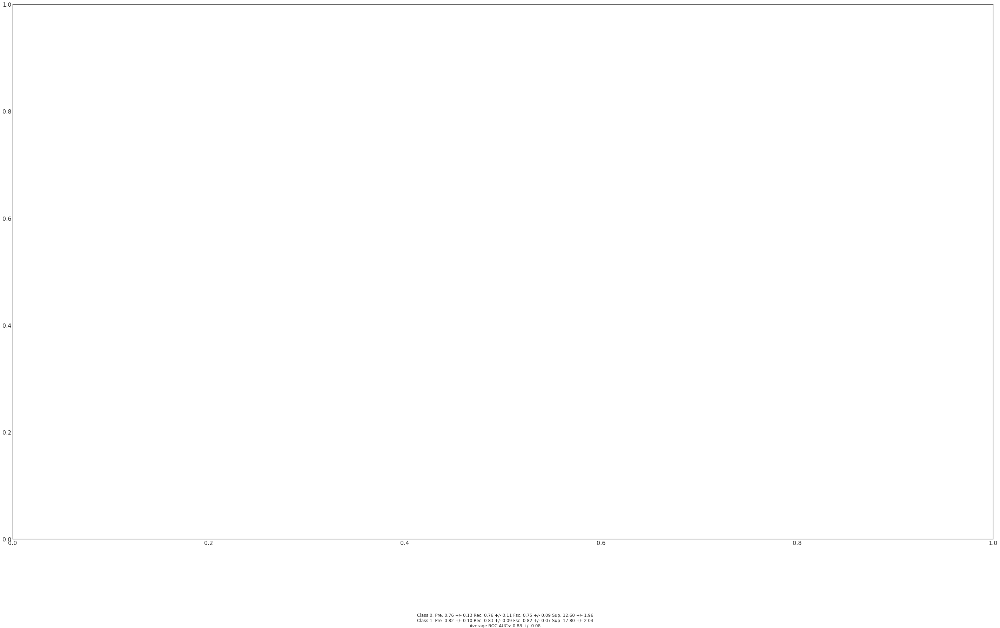


-----
Begin AdaBoost
-----

Directory AdaBoost already exists will be overwritten
----- AdaBoost: Fold 0 -----
[18, 19, 26, 34, 48, 57, 72, 84, 93, 100, 106, 114, 116, 138, 142, 163, 171, 178, 179, 201, 211, 213, 220, 224, 244, 252, 264, 272, 286, 298, 303]
	Train indx [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  20  21  22  23  24  25  27  28  29  30  31  32  33  35  36  37  38  39
  40  41  42  43  44  45  46  47  49  50  51  52  53  54  55  56  58  59
  60  61  62  63  64  65  66  67  68  69  70  71  73  74  75  76  77  78
  79  80  81  82  83  85  86  87  88  89  90  91  92  94  95  96  97  98
  99 101 102 103 104 105 107 108 109 110 111 112 113 115 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 139
 140 141 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 172 173 174 175 176 177 180
 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198

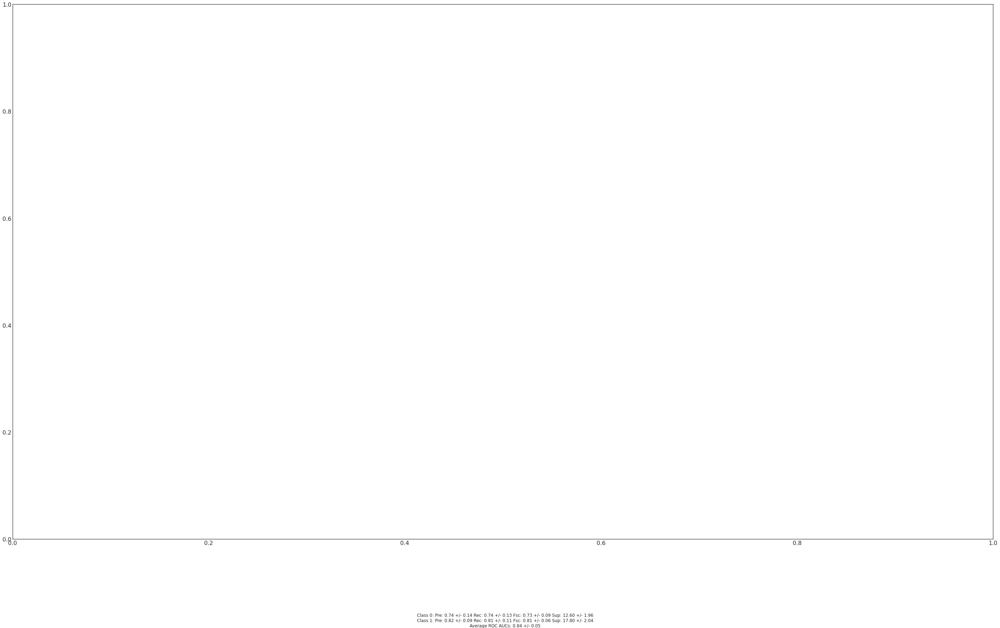


-----
Begin Logistic Regression
-----

Directory Logistic_Regression already exists will be overwritten
----- Logistic_Regression: Fold 0 -----
[18, 19, 26, 34, 48, 57, 72, 84, 93, 100, 106, 114, 116, 138, 142, 163, 171, 178, 179, 201, 211, 213, 220, 224, 244, 252, 264, 272, 286, 298, 303]
	Train indx [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  20  21  22  23  24  25  27  28  29  30  31  32  33  35  36  37  38  39
  40  41  42  43  44  45  46  47  49  50  51  52  53  54  55  56  58  59
  60  61  62  63  64  65  66  67  68  69  70  71  73  74  75  76  77  78
  79  80  81  82  83  85  86  87  88  89  90  91  92  94  95  96  97  98
  99 101 102 103 104 105 107 108 109 110 111 112 113 115 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 139
 140 141 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158
 159 160 161 162 164 165 166 167 168 169 170 172 173 174 175 176 177 180
 181 182 183 184 185 186 187 188 189 19

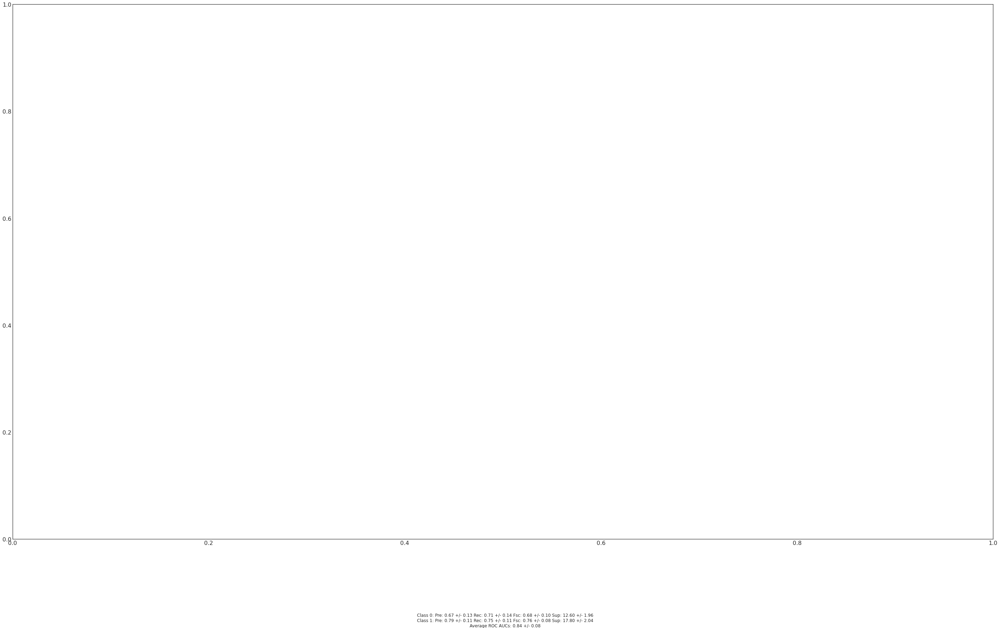

In [224]:
cwf.kfold_test_classifiers_with_optimization(features_df, class_targets_df, kfold_classifiers, kfold_classifier_parameters, 
                                                        overwrite=True, scale=True, cv=5, n_repeats=10, smiles=None, names=None,
                                                        random_seed=random_seed, clf_names=kfold_clf_names, class_labels=(0,1))

In [225]:
directory_names = cwf.directory_names(kfold_clf_names)

In [226]:
directory_names

['Nearest_Neighbors',
 'Gaussian_Process',
 'Decision_Tree',
 'ExtraTreesClassifier',
 'AdaBoost',
 'Logistic_Regression']

## Analyses the output over all folds and predictions therefore for all moleucles
The next cell reads in the predictions from each fold (n_repeats max_folds should = n_repeats).


Nearest_Neighbors
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_nearest_neighbors_morderd.png
['ddg_nearest_neighbors_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 77, 'fp': 49, 'fn': 45, 'tp': 133}
[[ 77  49]
 [ 45 133]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report

Gaussian_Process
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_gaussian_process_morderd.png
['ddg_nearest_neighbors_morderd.png', 'ddg_gaussian_process_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 92, 'fp': 34, 'fn': 25, 'tp': 153}
[[ 92  34]
 [ 25 153]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Decision_Tree
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_decision_tree_morderd.png
['ddg_nearest_neighbors_morderd.png', 'ddg_gaussian_process_morderd.png', 'ddg_decision_tree_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 75, 'fp': 51, 'fn': 35, 'tp': 143}
[[ 75  51]
 [ 35 143]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

ExtraTreesClassifier
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_extratreesclassifier_morderd.png
['ddg_nearest_neighbors_morderd.png', 'ddg_gaussian_process_morderd.png', 'ddg_decision_tree_morderd.png', 'ddg_extratreesclassifier_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 94, 'fp': 32, 'fn': 31, 'tp': 147}
[[ 94  32]
 [ 31 147]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

AdaBoost
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_adaboost_morderd.png
['ddg_nearest_neighbors_morderd.png', 'ddg_gaussian_process_morderd.png', 'ddg_decision_tree_morderd.png', 'ddg_extratreesclassifier_morderd.png', 'ddg_adaboost_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 92, 'fp': 34, 'fn': 35, 'tp': 143}
[[ 92  34]
 [ 35 143]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Logistic_Regression
-------------

Reading 0.csv
Reading 1.csv
Reading 2.csv
Reading 3.csv
Reading 4.csv
Reading 5.csv
Reading 6.csv
Reading 7.csv
Reading 8.csv
Reading 9.csv
Saving plot to ddg_logistic_regression_morderd.png
['ddg_nearest_neighbors_morderd.png', 'ddg_gaussian_process_morderd.png', 'ddg_decision_tree_morderd.png', 'ddg_extratreesclassifier_morderd.png', 'ddg_adaboost_morderd.png', 'ddg_logistic_regression_morderd.png']
Attempting to calculate confusion based metrics
{'tn': 89, 'fp': 37, 'fn': 45, 'tp': 133}
[[ 89  37]
 [ 45 133]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
\begin{tabular}{lrrrrrr}
\toprule
{} &  Accuracy &  Sensitivity &  Specificity &   MCC &  Precision &  G-mean \\
\midrule
nearest neighbors      &      0.69 &         0.75 &         0.61 &  0.36 &       0.73 &    0.68 \\
gaussian process       &   

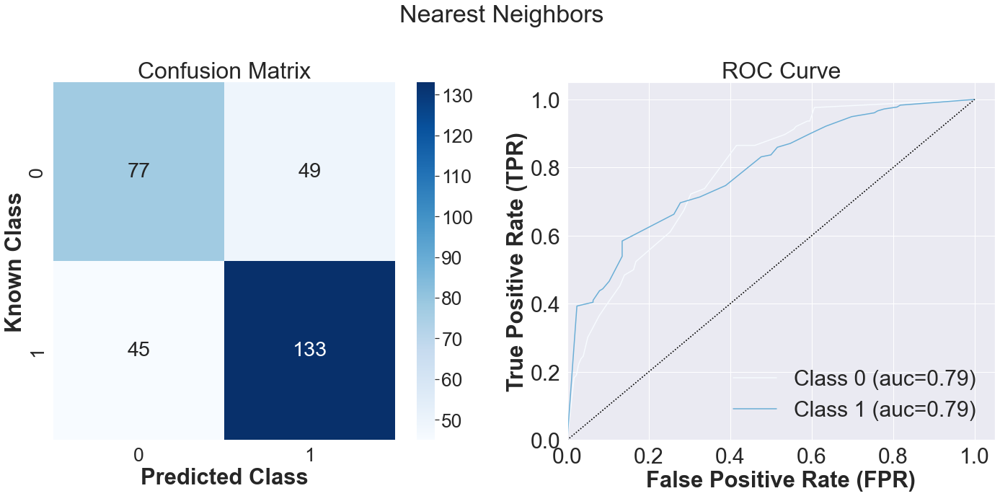

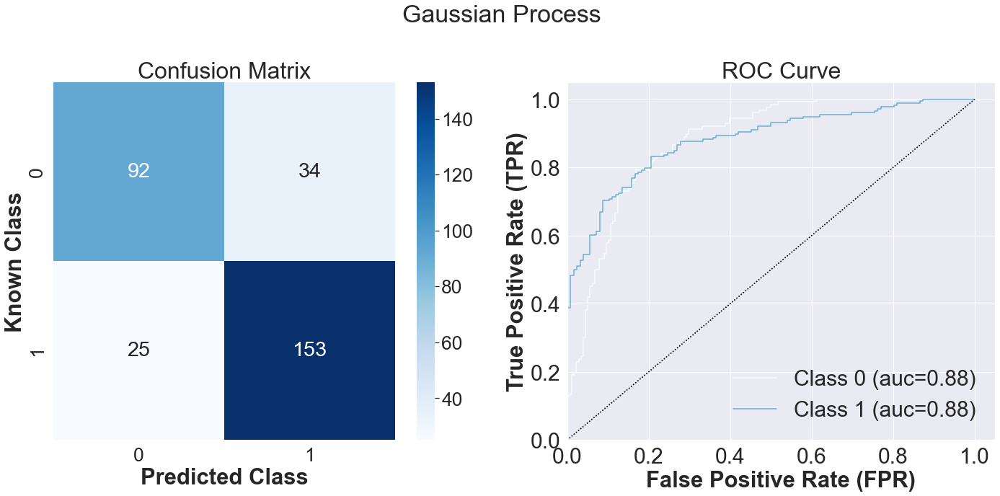

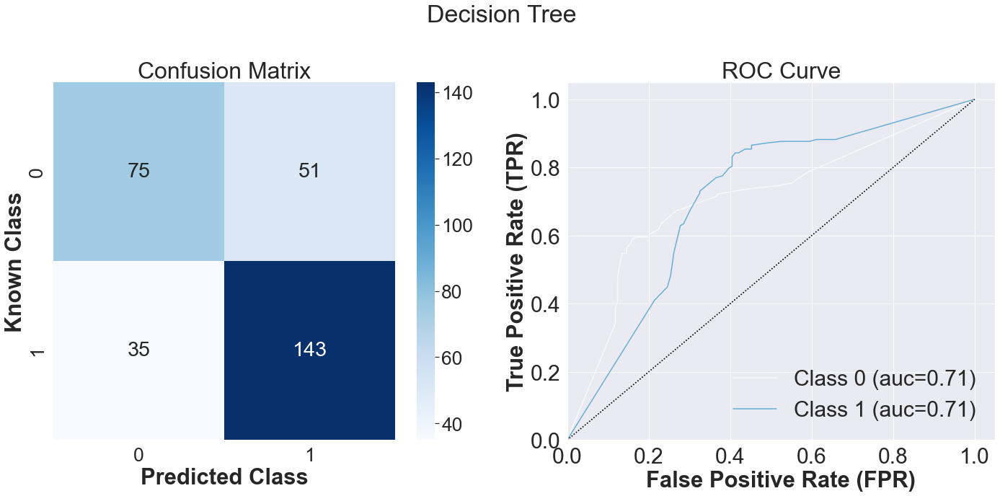

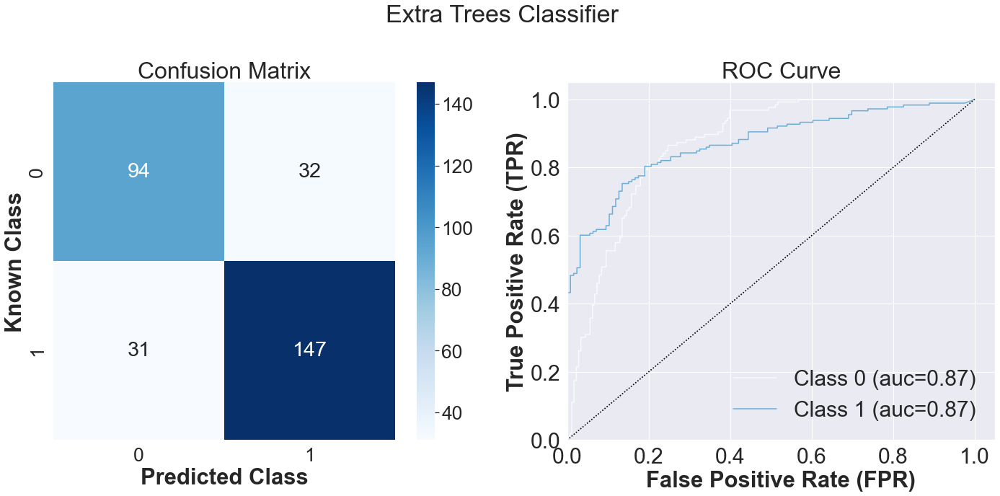

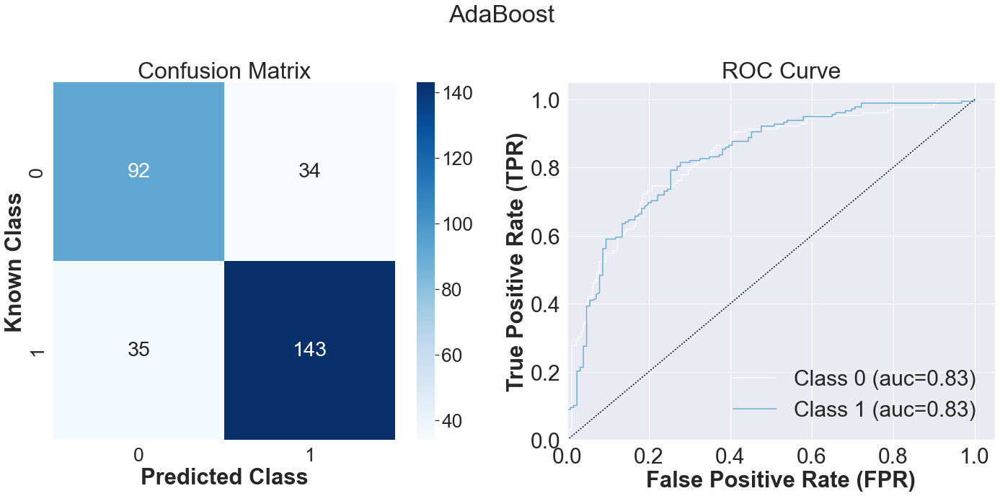

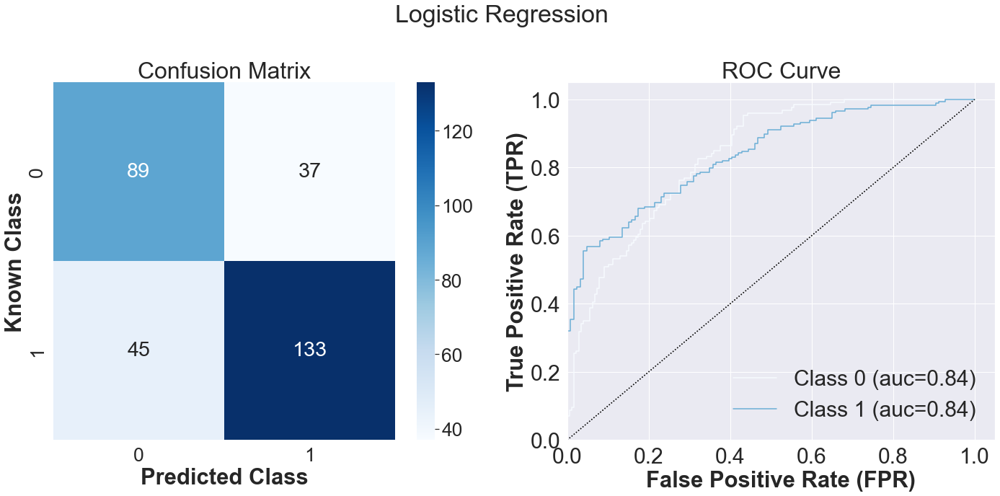

In [298]:
files_plt = []

kfold_clf_names = ["Nearest Neighbors", "Gaussian Process",
         "Decision Tree", "Extra Trees Classifier", "AdaBoost",
         "Logistic Regression"]

for ith, dirname in enumerate(directory_names):
    log.info("\n{}\n-------------\n".format(dirname))
    data = cwf.build_data_from_directory(dirname, max_folds=10)
    
#     log.debug("Last value in the data frame: {}".format(data[165:166]))
    
    probs = data[["prob0", "prob1"]].to_numpy()
    log.debug("Probablities for a few examples {}".format(probs[0:3,0:2]))
    
    cm = cmetrics.get_confusion_matrix(data, predicted_column_name="prediction", known_column_name="known", return_dict=False)
    log.debug("Confusion matrix for {}\n{}".format(dirname, cm))
    
    plt_name = "ddg_{}_morderd.png".format("_".join([ent.lower() for ent in dirname.split()]))
    files_plt.append(plt_name)
    log.info("Saving plot to {}\n{}".format(plt_name, files_plt))
    metrics = cmetrics.calculate_confusion_based_metrics(df=data, probabilities=probs, col_map="Blues", positive_label=1, 
                                                         plt_filename=plt_name, all_classes=False, get_roc_curve=True, 
                                                         get_pr_curve=False, annotate=True, vmin=0, vmax=85,
                                                         title="{}".format(kfold_clf_names[ith]))
    #log.info("{}".format("\n".join(["{}: {}".format(k, v) for k, v in metrics.items()])))
    
    metrics_for_paper = {
    "Accuracy": metrics["accuracy"].round(2),
    "Sensitivity": metrics["tpr"].round(2),
    "Specificity": metrics["tnr"].round(2),
    "MCC": metrics["matthews_correlation_coefficient"].round(2),
    "Precision": metrics["precision"].round(2),
    "G-mean": metrics["g-mean"].round(2),
    }
    
    if ith == 0:
        df_metrics_for_paper = pd.DataFrame(data=metrics_for_paper, index=[kfold_clf_names[ith].lower()])
    else:
        df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))
    log.debug(df_metrics_for_paper)

with open("metrics_mordred.tex", "w") as fout:
    cap = "Classifier metrics for balanced data for ddg with models built from mordred features. MCC is the Matthew’s correlation coefficent."
    df_metrics_for_paper.to_latex(fout, float_format="{:0.2f}".format, position="H", caption=cap, label="tbl:mordred_features")
log.info(df_metrics_for_paper.to_latex())

In [299]:
images = [Image.open(x) for x in files_plt]
log.info("Combining {} images".format(len(images)))
widths, heights = zip(*(i.size for i in images))
log.info("{}".format("\n".join("W: {} H: {}".format(wid, hgt) for wid, hgt in zip(widths, heights))))
total_height = sum(heights)
total_width = max(widths)

log.info("New image will be W:{} H:{}".format(total_width, total_height))

combined_image = Image.new("RGBA", (total_width, total_height))
y_offset = 0
for ith, img in enumerate(images):
    log.info("Image {} added at offset height {}".format(ith, y_offset))
    combined_image.paste(img, (0, y_offset))
    y_offset = y_offset + img.size[1]

combined_image.save("combined_mordred.png")

Combining 6 images
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
New image will be W:6000 H:18000
Image 0 added at offset height 0
Image 1 added at offset height 3000
Image 2 added at offset height 6000
Image 3 added at offset height 9000
Image 4 added at offset height 12000
Image 5 added at offset height 15000


# Machine Learning
## Now first we split dataset into training set and test set

In [501]:
data = pd.read_csv("../dataset_initial_look/df_all_substructure_onehot.csv")
data.columns = ["_".join(ent.lower().strip().split(" ")) for ent in data.columns]

In [502]:
data['logec50'] = data['target'].fillna('N')

In [503]:
len(data['year'].unique())

11

In [504]:
# sort by year
data = data.sort_values(by=['year'])

In [505]:
data['year'].unique()

array([2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021])

In [506]:
# number of compounds per year as list
data.groupby('year').size().tolist()

[16, 27, 33, 41, 18, 66, 22, 7, 8, 22, 44]

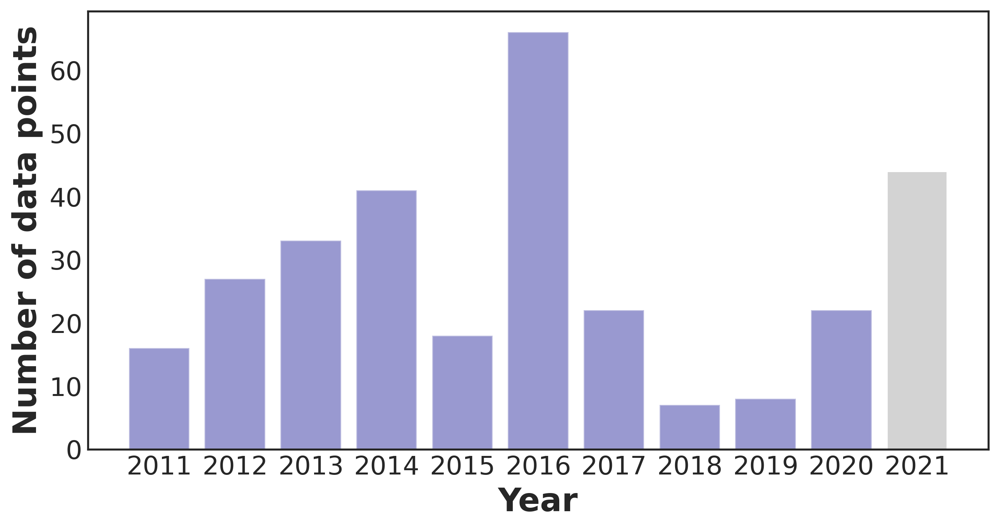

In [507]:
# plot the number of data points per year
plt.figure(figsize=(10, 5), dpi=300)
plt.bar(data['year'].unique(), data.groupby('year').size().tolist(), color='darkblue', alpha=0.4)

# color the last bar grey
plt.bar(data['year'].unique()[-1], data.groupby('year').size().tolist()[-1], color='lightgrey')

plt.xlabel('Year')
plt.xticks(data['year'].unique())
plt.ylabel('Number of data points')
plt.show()

In [569]:
substructure_name_list = ['urea',
                     'thiourea', 
                     'tambjamine',
                     'squaramide', 
                     'indole', 
                     'perenosin', 
                     'carbazole', 
                     'acridinone',
                     'isophthalamides_dipicolineamides',
                     'bisbzimpy']

In [508]:
substructure_name_list = ['thiourea',
                     'urea', 
                     'squaramide', 
                     'indole', 
                     'tambjamine', 
                     'carbazole', 
                     'acridinone', 
                     'perenosin',
                     'bisbzimpy', 
                     'isophthalamides_dipicolineamides']

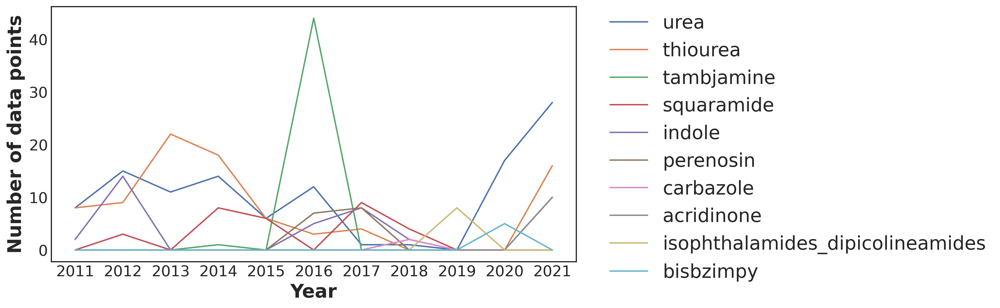

In [570]:
# make the color of the plots follow the BuRd colormap
from matplotlib.colors import ListedColormap


# plot the number of data points per substructure per year
plt.figure(figsize=(10, 5), dpi=300)
for substructure_name in substructure_name_list:
    plt.plot(data['year'].unique(), data.groupby('year').sum()[substructure_name], label=substructure_name)
plt.xlabel('Year')
plt.ylabel('Number of data points')
plt.xticks(data['year'].unique())

# put legend on the right side
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.show()

In [571]:
# for each year, count number of data poitns per substructure
data.groupby('year').sum()[substructure_name_list]

,urea,thiourea,tambjamine,squaramide,indole,perenosin,carbazole,acridinone,isophthalamides_dipicolineamides,bisbzimpy
year,,,,,,,,,,
2011,8,8,0,0,2,0,0,0,0,0
2012,15,9,0,3,14,0,0,0,0,0
2013,11,22,0,0,0,0,0,0,0,0
2014,14,18,1,8,0,0,0,0,0,0
2015,6,6,0,6,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2017,1,4,0,9,8,8,0,0,0,0
2018,1,0,0,4,2,0,2,0,0,0
2019,0,0,0,0,0,0,0,0,8,0


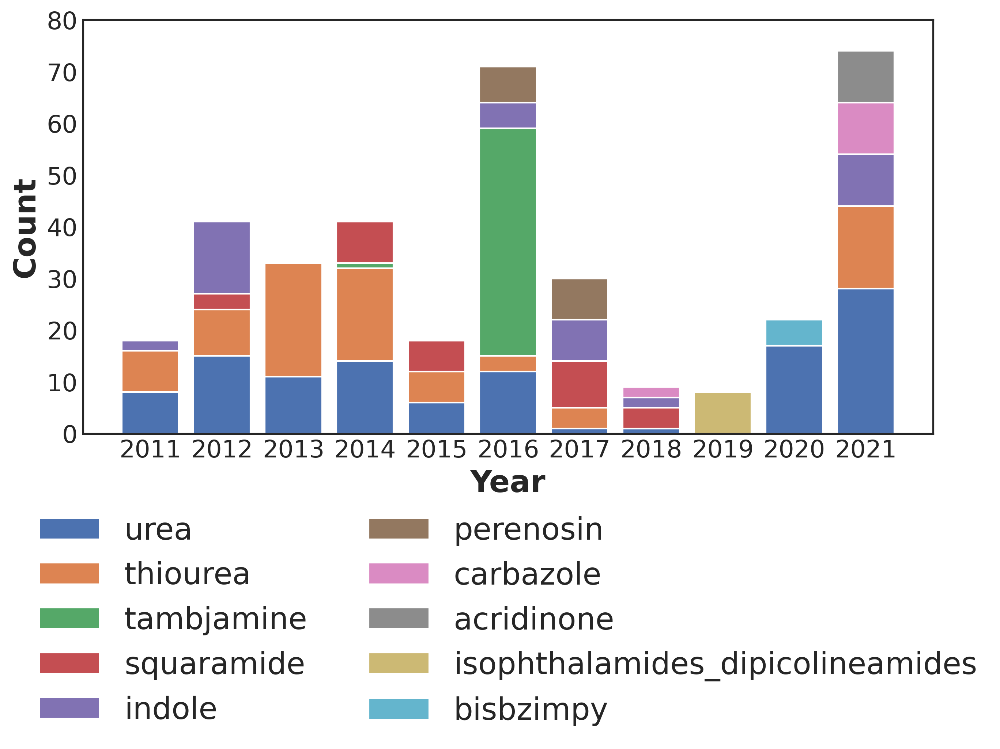

In [572]:
# plot the number of data points per substructure per year as bar chart
plt.figure(figsize=(10, 5), dpi=300)


bottom = np.zeros(len(data['year'].unique()))
for i in range(len(substructure_name_list)):
    substructure_name = substructure_name_list[i]
    plt.bar(data['year'].unique(), data.groupby('year').sum()[substructure_name], label=substructure_name, bottom=bottom)
    bottom = bottom + data.groupby('year').sum()[substructure_name]
plt.xlabel('Year')
plt.xticks(data['year'].unique())
plt.ylabel('Count')
plt.ylim(0, 80)
# put legend on the right side
plt.legend(loc='lower center', borderaxespad=-10,ncol=2, )

plt.show()

## Train-test split

In [243]:
test_dataid = []

# split by year
# keep 2021 as test set
for year in data['year'].unique():
    if year == 2021:
        test_dataid.append(data[data['year'] == year].index.tolist())

# flatten the list
test_dataid = [item for sublist in test_dataid for item in sublist]


In [244]:
data[data['year'] == 2021].index

Int64Index([ 93,  91,  92,  90,  89, 125, 126, 127,  94,  83,  96,  97,  98,
            128,  99, 100, 101, 102, 103,  95, 129, 140, 131,  84,  85,  86,
             87, 105,  88, 144, 143, 142, 141,  82, 139, 138, 137, 136, 135,
            134, 133, 132, 130, 104],
           dtype='int64')

In [245]:
len(test_dataid)

44

In [246]:
# Test = last of each paper
#test_dataid = []

#for pid in data['paperid'].unique():
    #test_dataid.append(data[data['paperid'] == pid].index.values[0])
    #test_dataid.append(data[data['paperid'] == pid].index.values[-1])

In [247]:
test_data = pd.DataFrame()
test_data = data.iloc[test_dataid]

In [248]:
train_data = data.drop(index=test_dataid, axis=0, inplace = False)

In [249]:
len(train_data)

260

In [250]:
substratesmiles_train = train_data["smiles"]
log.info("Transporter SMILES: {}".format(substratesmiles_train.head()))

target_train = train_data["logec50"]
log.info("logEC50: {}".format(target_train.head()))

Transporter SMILES: 241    S=C(NC1=C(NC=C2)C2=CC=C1)NCCC(C)C
236                   O=C(NCCCC)NCCC(C)C
237                   S=C(NCCCC)NCCC(C)C
238            O=C(NC1=CC=CC=C1)NCCC(C)C
239            S=C(NC1=CC=CC=C1)NCCC(C)C
Name: smiles, dtype: object
logEC50: 241   -1.537602
236           N
237   -0.962574
238           N
239    0.483872
Name: logec50, dtype: object


In [251]:
substratesmiles_test = test_data["smiles"]
log.info("Transporter SMILES: {}".format(substratesmiles_test.head()))

target_test = test_data["logec50"]
log.info("logEC50: {}".format(target_test.head()))

Transporter SMILES: 124      CC(C(CCCCC)=C/1)=NC1=C/C2=C(OC)C=C(N2)C3=CC=CN3
123    O=C(NC1=CC(C(F)(F)F)=CC(C(F)(F)F)=C1)NC2=C(NC(...
222                    S=C(NCCCCCC)NC(C1=CC=C(OC)C=C1)=O
121    O=C(NC1=CC=C([N+]([O-])=O)C=C1)NC2=C(NC(NC3=CC...
288    O=C(NC1=CC=C(C#N)C=C1)NCC2=CC=CC(/N=N\C3=CC=CC...
Name: smiles, dtype: object
logEC50: 124    -3.19382
123    -2.79588
222   -0.552842
121   -2.318759
288   -0.420216
Name: logec50, dtype: object


# Handling the training set

## Generate features for the training set

In [252]:
#help(AllChem.EmbedMolecule)

In [253]:
submolecule_list_train = []

for smiles in substratesmiles_train:
    mol = Chem.rdmolfiles.MolFromSmiles(smiles)
    mol_with_hs = Chem.rdmolops.AddHs(mol)

    # Setting the parameters to use ETKDGv3 to generate the initial coordinates.
    v3_params = AllChem.ETKDGv3()
    v3_params.enforceChirality = True
    v3_params.useRandomCoordinates = True

    # This adds one conformer to mol_with_hs
    AllChem.EmbedMolecule(mol_with_hs, v3_params)
    
    # add the molecule to the list
    submolecule_list_train.append(mol_with_hs)

[14:43:19] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[14:43:19] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[14:43:19] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[14:43:19] UFFTYPER: Unrecognized atom type: S_6+6 (25)
[14:43:29] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[14:43:29] UFFTYPER: Unrecognized atom type: S_6+6 (24)


In [254]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df_train = calc.pandas(submolecule_list_train)

100%|██████████| 260/260 [00:48<00:00,  5.39it/s]


In [255]:
# show rows where PNSA1 is not float
#checkmissing = subfeatures_df_train[subfeatures_df_train['PNSA1'].apply(lambda x: isinstance(x, float) == False)]
#ids_missing = checkmissing.index.tolist()
#
## get smiles of missing values
#if len(ids_missing) > 0:
#    smiles_missing = [substratesmiles_train[i] for i in ids_missing]
#    # show ids and smiles of missing values
#    for i, s in zip(ids_missing, smiles_missing):
#        print(i, s)
#else:
#    print("No missing values")

In [307]:
# Drop columns with NaN values
subfeatures_df_train.dropna(inplace=True, thresh=int(0.9*len(subfeatures_df_train.index)))

# Drop columns with std lower than threshold
threshold = 0.5
subfeatures_df_train.drop(subfeatures_df_train.std()[subfeatures_df_train.std() < threshold].index.values, axis=1)

# Drop columns with values containing the string
subfeatures_df_train.drop(subfeatures_df_train.columns[subfeatures_df_train.isin(['missing']).any()], axis=1)

subfeatures_df_train.columns = [ent.strip() for ent in subfeatures_df_train.columns]
subfeatures_df_train.head()

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,13.682318,11.938414,0,0,22.381359,2.395314,4.705270,22.381359,1.243409,3.801020,...,9.524348,64.026585,261.129969,7.057567,682,22,88.0,99.0,6.055556,4.055556
1,8.813451,8.413992,0,0,14.733860,2.060820,4.121640,14.733860,1.133374,3.386689,...,8.272571,41.358042,186.173213,5.319235,324,11,50.0,49.0,5.972222,3.250000
2,8.813451,8.413992,0,0,14.733860,2.060820,4.121640,14.733860,1.133374,3.386689,...,8.272571,41.358042,202.150370,5.775725,324,11,50.0,49.0,5.972222,3.250000
3,10.934771,9.613927,0,0,18.048677,2.195829,4.391657,18.048677,1.203245,3.579412,...,8.909370,45.412461,206.141913,6.246725,444,15,66.0,69.0,5.583333,3.500000
4,10.934771,9.613927,0,0,18.048677,2.195829,4.391657,18.048677,1.203245,3.579412,...,8.909370,45.412461,222.119070,6.730881,444,15,66.0,69.0,5.583333,3.500000


## Pearson correlation

In [257]:
# replace str N with max value in the dataset
target_train.replace('N', 10)

241    -1.537602
236    10.000000
237    -0.962574
238    10.000000
239     0.483872
         ...    
163    -0.763967
164    -2.050610
165    10.000000
166    -1.712198
160    -0.358625
Name: logec50, Length: 260, dtype: float64

In [258]:
subreasonable_predicted_properties, subsignificant_features = cwf.find_correlating_features(subfeatures_df_train, target_train.replace('N', 10), thresh=0.2, 
                                                                                      plot=False, corr_method="spearman", 
                                                                                      sig_metric="spearman", process_non_numeric=True, 
                                                                                      sig_level=0.05, significance=True, n_sample=5000)

241    -1.537602
236    10.000000
237    -0.962574
238    10.000000
239     0.483872
         ...    
163    -0.763967
164    -2.050610
165    10.000000
166    -1.712198
160    -0.358625
Name: logec50, Length: 260, dtype: float64
Significance will be calculated for the correlations


nBase: -0.4292 P: 0.0002 Significant at 0.0500 level? True
SpMax_A: -0.2246 P: 0.0006 Significant at 0.0500 level? True
nS: 0.2098 P: 0.0008 Significant at 0.0500 level? True
ATSC0c: -0.2079 P: 0.0014 Significant at 0.0500 level? True
ATSC2c: 0.2510 P: 0.0002 Significant at 0.0500 level? True
ATSC3c: -0.3130 P: 0.0002 Significant at 0.0500 level? True
ATSC4c: 0.3913 P: 0.0002 Significant at 0.0500 level? True
ATSC5c: -0.2204 P: 0.0006 Significant at 0.0500 level? True
ATSC6d: 0.2166 P: 0.0010 Significant at 0.0500 level? True
ATSC7d: 0.2380 P: 0.0002 Significant at 0.0500 level? True
ATSC7v: 0.2045 P: 0.0008 Significant at 0.0500 level? True
ATSC2se: 0.2157 P: 0.0006 Significant at 0.0500 level? True
ATSC2pe: 0.2032 P: 0.0006 Significant at 0.0500 level? True
ATSC2are: 0.2056 P: 0.0006 Significant at 0.0500 level? True
AATSC0c: -0.2643 P: 0.0002 Significant at 0.0500 level? True
AATSC2c: 0.2688 P: 0.0002 Significant at 0.0500 level? True
AATSC3c: -0.3226 P: 0.0002 Significant at 0.0500

In [499]:
#subreasonable_predicted_properties, subsignificant_features

log.info("{} {}".format(len(subreasonable_predicted_properties), subsignificant_features))
log.info("{} {}".format(len(subsignificant_features), subreasonable_predicted_properties))
use_significant = True
use_reasonable = False

86 ['nBase', 'SpMax_A', 'nS', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d', 'ATSC7d', 'ATSC7v', 'ATSC2se', 'ATSC2pe', 'ATSC2are', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC5c', 'AATSC6d', 'AATSC7v', 'AATSC2se', 'AATSC2p', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6d', 'MATS6s', 'MATS7v', 'MATS2se', 'MATS3se', 'MATS2pe', 'MATS2are', 'MATS3are', 'GATS1c', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS1s', 'GATS2s', 'GATS4v', 'GATS2se', 'GATS5se', 'GATS2pe', 'GATS2are', 'BCUTc-1h', 'BCUTc-1l', 'BCUTd-1l', 'BCUTv-1h', 'BCUTp-1h', 'BCUTi-1l', 'nBondsD', 'AXp-5d', 'NdsCH', 'NdssC', 'NssNH', 'NaaNH', 'NdO', 'NssO', 'SdsCH', 'SdssC', 'SssNH', 'SaaNH', 'SdO', 'SssO', 'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'EState_VSA3', 'VSA_EState1', 'VSA_EState3', 'VSA_EState5', 'VSA_EState9', 'n5Ring', 'n5HRing', 'nARing', 'n5ARing', 'nAHRing', 'n5AHRing', 'nFRing', 'nFHRing', 'TopoPSA', 'SRW05']
86 ['nBase', 'SpMax_A', 'nS', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c',

In [425]:
subfeats_df_train = pd.DataFrame()

if use_significant is True:
    for k in subsignificant_features:
        subfeats_df_train[k] = subfeatures_df_train[k]
        
elif use_reasonable is True:
    for k in subreasonable_predicted_properties:
        subfeats_df_train[k] = subfeatures_df_train[k]

In [426]:
subfeats_df_train

,nBase,SpMax_A,nS,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,...,n5Ring,n5HRing,nARing,n5ARing,nAHRing,n5AHRing,nFRing,nFHRing,TopoPSA,SRW05
0,0,2.395314,1,0.546070,0.147383,0.013630,-0.128836,0.054372,-4.188459,-1.536158,...,1,1,0,0,0,0,1,1,71.94,2.397895
1,0,2.060820,0,0.484174,0.351660,-0.174870,0.012717,-0.086871,-4.162449,-1.687347,...,0,0,0,0,0,0,0,0,41.13,0.000000
2,0,2.060820,1,0.385247,0.170274,-0.123084,0.034561,-0.073790,-4.162449,-1.687347,...,0,0,0,0,0,0,0,0,56.15,0.000000
3,0,2.195829,0,0.486793,0.383908,-0.258395,0.083684,-0.072173,-3.314050,-1.181818,...,0,0,0,0,0,0,0,0,41.13,0.000000
4,0,2.195829,1,0.385246,0.207086,-0.180625,0.077028,-0.068444,-3.314050,-1.181818,...,0,0,0,0,0,0,0,0,56.15,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0,2.414261,2,0.977588,0.723510,-0.267012,-0.388828,0.689621,6.560000,2.920000,...,2,2,0,0,0,0,2,2,138.74,3.044522
256,0,2.422276,2,1.096073,0.708515,-0.361308,-0.215174,0.539156,6.326400,6.052800,...,2,2,0,0,0,0,2,2,138.74,3.044522
257,0,2.406426,2,0.970158,0.770507,-0.367802,-0.223689,0.478881,8.720000,3.320000,...,2,2,0,0,0,0,2,2,138.74,3.044522
258,0,2.415636,2,1.088643,0.755512,-0.462107,-0.050185,0.326862,8.828800,6.372800,...,2,2,0,0,0,0,2,2,138.74,3.044522


## Classify the training data

In [427]:
classes_train=[]
for index, value in target_train.items():
    if value == 'N' or value > 0:
        classes_train.append(0)
    else:
        classes_train.append(1)

class_targets_df_train = pd.DataFrame(np.array([classes_train]).T, columns=["classes"])
features_and_classes_df_train = subfeatures_df_train_exp.copy()
features_and_classes_df_train["classes"] = classes_train
class_targets_df_train["classes"].values

array([1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1])

## Data scaling

In [428]:
features_df_train_scaled = cwf.feature_categorization(subfeats_df_train, feature_types = "some_categorical")

Numerical features:
['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d', 'ATSC7d', 'ATSC7v', 'ATSC2se', 'ATSC2pe', 'ATSC2are', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC5c', 'AATSC6d', 'AATSC7v', 'AATSC2se', 'AATSC2p', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6d', 'MATS6s', 'MATS7v', 'MATS2se', 'MATS3se', 'MATS2pe', 'MATS2are', 'MATS3are', 'GATS1c', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS1s', 'GATS2s', 'GATS4v', 'GATS2se', 'GATS5se', 'GATS2pe', 'GATS2are', 'BCUTc-1h', 'BCUTc-1l', 'BCUTd-1l', 'BCUTv-1h', 'BCUTp-1h', 'BCUTi-1l', 'AXp-5d', 'SdsCH', 'SdssC', 'SssNH', 'SaaNH', 'SdO', 'SssO', 'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'EState_VSA3', 'VSA_EState1', 'VSA_EState3', 'VSA_EState5', 'VSA_EState9', 'TopoPSA', 'SRW05'] 69
categorical features:
['nBase', 'nS', 'nBondsD', 'NdsCH', 'NdssC', 'NssNH', 'NaaNH', 'NdO', 'NssO', 'n5Ring', 'n5HRing', 'nARing', 'n5ARing', 'nAHRing', 'n5AHRing', 'nFRing', 'nFHRing'] 17



-----
Getting feature names from column transformer
-----

Transformer index: 0
Tranformer name: numerical
Transformer: MinMaxScaler()
Original feature names: ['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d', 'ATSC7d', 'ATSC7v', 'ATSC2se', 'ATSC2pe', 'ATSC2are', 'AATSC0c', 'AATSC2c', 'AATSC3c', 'AATSC4c', 'AATSC5c', 'AATSC6d', 'AATSC7v', 'AATSC2se', 'AATSC2p', 'MATS1c', 'MATS2c', 'MATS3c', 'MATS4c', 'MATS6d', 'MATS6s', 'MATS7v', 'MATS2se', 'MATS3se', 'MATS2pe', 'MATS2are', 'MATS3are', 'GATS1c', 'GATS2c', 'GATS3c', 'GATS5c', 'GATS1s', 'GATS2s', 'GATS4v', 'GATS2se', 'GATS5se', 'GATS2pe', 'GATS2are', 'BCUTc-1h', 'BCUTc-1l', 'BCUTd-1l', 'BCUTv-1h', 'BCUTp-1h', 'BCUTi-1l', 'AXp-5d', 'SdsCH', 'SdssC', 'SssNH', 'SaaNH', 'SdO', 'SssO', 'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'EState_VSA3', 'VSA_EState1', 'VSA_EState3', 'VSA_EState5', 'VSA_EState9', 'TopoPSA', 'SRW05']

Transformer index: 1
Tranformer name: categorical
Transformer: OneHotEncod

In [429]:
sum(features_df_train_scaled.isnull().any())

0

In [430]:
#for value in features_df_train_scaled['PNSA1'].values:
    # if value is null value: PRINT VALUE
#    if value == 'N':
#        print(value)

In [431]:
#subfeatures_df_train_exp[subfeatures_df_train_exp['PNSA1'].isnull()]['PNSA1']

In [432]:
# show rows where PNSA1 is null and only show PNSA1 column
#features_df_train_scaled[features_df_train_scaled['PNSA1'].isnull()]['PNSA1']

In [433]:
for colume in features_df_train_scaled.columns:
    if features_df_train_scaled[colume].isnull().values.any():
        log.info("Column {} has null values".format(colume))
        log.info("Number of null values: {}".format(features_df_train_scaled[colume].isnull().sum()))

        # show the index of the null values
        log.info("Index of null values: {}".format(features_df_train_scaled[colume][features_df_train_scaled[colume].isnull()].index.values))

In [434]:
sum(features_df_train_scaled.isnull().any())

0

In [435]:
features_df_train = features_df_train_scaled.copy()

In [436]:
feats_to_add = ['cl_conc_(mm)', 'time_between_transporter_added_and_lysis_(s)']

train_data = train_data.reset_index(drop=True)

for f in feats_to_add:
    features_df_train[f] = train_data[f]

substructure_name_list = ['thiourea',
                     'urea', 
                     'squaramide', 
                     'indole', 
                     'tambjamine', 
                     'carbazole', 
                     'acridinone', 
                     'perenosin',
                     'bisbzimpy', 
                     'isophthalamides_dipicolineamides']

for f in substructure_name_list:
    features_df_train[f] = train_data[f]

In [437]:
features_df_train 

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,thiourea,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.644192,0.050622,0.520497,0.310559,0.786210,0.394187,0.226951,0.767767,0.396714,0.147862,...,1,0,0,1,0,0,0,0,0,0
1,0.000000,0.031570,0.600396,0.230051,0.878741,0.347225,0.227247,0.765820,0.634671,0.172124,...,0,1,0,0,0,0,0,0,0,0
2,0.000000,0.001117,0.529450,0.252169,0.893021,0.351575,0.227247,0.765820,0.481112,0.146911,...,1,0,0,0,0,0,0,0,0,0
3,0.260009,0.032376,0.613009,0.194378,0.925132,0.352112,0.236907,0.772329,0.629254,0.173527,...,0,1,0,0,0,0,0,0,0,0
4,0.260009,0.001117,0.543849,0.227593,0.920781,0.353352,0.236907,0.772329,0.483551,0.149075,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0.680681,0.183453,0.745838,0.190698,0.616256,0.605401,0.349338,0.825144,0.897640,0.203461,...,0,1,0,0,0,0,0,0,0,0
256,0.696118,0.219926,0.739973,0.150424,0.729772,0.555373,0.346678,0.865482,0.879706,0.190480,...,0,1,0,0,0,0,0,0,0,0
257,0.665592,0.181166,0.764220,0.147651,0.724205,0.535332,0.373933,0.830295,0.845039,0.203461,...,0,1,0,0,0,0,0,0,0,0
258,0.683329,0.217639,0.758355,0.107373,0.837623,0.484787,0.375172,0.869602,0.827926,0.190480,...,0,1,0,0,0,0,0,0,0,0


In [438]:
features_df_train.to_csv("features_train.csv")

In [439]:
feature_types = 'some_categorical'

## Synthetic sampling for the training

In [440]:
nneighbours = min(5, len(class_targets_df_train[class_targets_df_train["classes"]==1].index)-1)
log.info("Number of neighbours used for SMOTE: {}".format(nneighbours))

# feature_types is set when the fingerprints are calculated
# No catagorical
if feature_types == "no_catagorical":
    sm = SMOTE(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# Some catagorical - Need to provide the indexes
elif feature_types == "some_catagorical":
    sm = SMOTENC(sampling_strategy="not majority", categorical_features=catagorical_indxs, random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)
# All catagorical
elif feature_types == "catagorical":
    sm = SMOTEN(sampling_strategy="not majority", random_state=random_seed, k_neighbors=nneighbours, n_jobs=-1)

Number of neighbours used for SMOTE: 5


In [441]:
log.info("Number of features: {}".format(len(features_df_train.columns.values)))
log.info("Feature decriptions:\n{}".format(features_df_train.columns.values))
log.info("Classes/Targets descriptions:\n{}".format(class_targets_df_train.columns.values))

Number of features: 144
Feature decriptions:
['SpMax_A' 'ATSC0c' 'ATSC2c' 'ATSC3c' 'ATSC4c' 'ATSC5c' 'ATSC6d' 'ATSC7d'
 'ATSC7v' 'ATSC2se' 'ATSC2pe' 'ATSC2are' 'AATSC0c' 'AATSC2c' 'AATSC3c'
 'AATSC4c' 'AATSC5c' 'AATSC6d' 'AATSC7v' 'AATSC2se' 'AATSC2p' 'MATS1c'
 'MATS2c' 'MATS3c' 'MATS4c' 'MATS6d' 'MATS6s' 'MATS7v' 'MATS2se' 'MATS3se'
 'MATS2pe' 'MATS2are' 'MATS3are' 'GATS1c' 'GATS2c' 'GATS3c' 'GATS5c'
 'GATS1s' 'GATS2s' 'GATS4v' 'GATS2se' 'GATS5se' 'GATS2pe' 'GATS2are'
 'BCUTc-1h' 'BCUTc-1l' 'BCUTd-1l' 'BCUTv-1h' 'BCUTp-1h' 'BCUTi-1l'
 'AXp-5d' 'SdsCH' 'SdssC' 'SssNH' 'SaaNH' 'SdO' 'SssO' 'PEOE_VSA6'
 'PEOE_VSA10' 'PEOE_VSA11' 'PEOE_VSA12' 'PEOE_VSA13' 'EState_VSA3'
 'VSA_EState1' 'VSA_EState3' 'VSA_EState5' 'VSA_EState9' 'TopoPSA' 'SRW05'
 'nBase_0' 'nBase_1' 'nS_0' 'nS_1' 'nS_2' 'nS_3' 'nBondsD_0' 'nBondsD_1'
 'nBondsD_2' 'nBondsD_3' 'nBondsD_4' 'nBondsD_5' 'nBondsD_6' 'NdsCH_0'
 'NdsCH_1' 'NdsCH_2' 'NdssC_0' 'NdssC_1' 'NdssC_2' 'NdssC_3' 'NdssC_4'
 'NssNH_0' 'NssNH_1' 'NssNH_2' 'Nss

In [442]:
sum(features_df_train.isnull().any())

0

In [443]:
for colume in features_df_train.columns:
    if features_df_train[colume].isnull().values.any():
        log.info("Column {} has null values".format(colume))
        log.info("Number of null values: {}".format(features_df_train[colume].isnull().sum()))


In [444]:
# drop columns with missing values in features_df_train
features_df_train = features_df_train.dropna(axis=1)

In [445]:
features_smote_train, classes_smote_train = sm.fit_resample(features_df_train.to_numpy(), class_targets_df_train.to_numpy())
n_sythetic_points = features_smote_train.shape[0] - len(features_df_train.index)
log.info("SMOTE has added {} sythetic features to balence the classes".format(n_sythetic_points))

The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
SMOTE has added 64 sythetic features to balence the classes


In [446]:
log.info("Resampled X\n{}\n{}\nResampled y:\n{}\n{}".format(features_smote_train, features_smote_train.shape, classes_smote_train, classes_smote_train.shape))

Resampled X
[[0.64419202 0.05062246 0.52049746 ... 0.         0.         0.        ]
 [0.         0.03156954 0.6003963  ... 0.         0.         0.        ]
 [0.         0.00111739 0.52945045 ... 0.         0.         0.        ]
 ...
 [0.50437908 0.04443161 0.56792698 ... 0.         0.         0.        ]
 [0.52498257 0.18522648 0.73799282 ... 0.         0.         0.        ]
 [0.26000916 0.00111729 0.54384899 ... 0.         0.         0.        ]]
(324, 144)
Resampled y:
[1 0 1 0 0 0 1 1 1 1 1 1 1 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1 1 0 1 0 0
 0 1 0 1 0 1 0 0 0 0 1 1 1 1 1 0 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 1 0 1 1 1
 1 1 0 1 1 1 1 0 1 1 1 0 0 0 0 1 1 1 1 1 0 0 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0
 1 0 1 1 0 0 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 0 0 1 1 1 1 0 0 0 1 1
 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 0 1 0 1 1 0 1 0 1 1 1
 0 1 1 1 1 1 1 0 1 0 1 1 1 1 0 1 0 0 0 1 1 1 0 0 1 1 0 1 0 0 1 0 0 1 1

In [447]:
features_smote_df_train = pd.DataFrame(data=features_smote_train, columns=features_df_train.columns.values)
classes_smote_df_train = pd.DataFrame(data=classes_smote_train, columns=["classes"])

comb_df_res = features_smote_df_train.copy()
comb_df_res["classes"] = classes_smote_train
comb_df_res.to_csv("resampled_synthetic_data_set_train.csv")
comb_df_res

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides,classes
0,0.644192,0.050622,0.520497,0.310559,0.786210,0.394187,0.226951,0.767767,0.396714,0.147862,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1
1,0.000000,0.031570,0.600396,0.230051,0.878741,0.347225,0.227247,0.765820,0.634671,0.172124,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.000000,0.001117,0.529450,0.252169,0.893021,0.351575,0.227247,0.765820,0.481112,0.146911,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
3,0.260009,0.032376,0.613009,0.194378,0.925132,0.352112,0.236907,0.772329,0.629254,0.173527,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0.260009,0.001117,0.543849,0.227593,0.920781,0.353352,0.236907,0.772329,0.483551,0.149075,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319,0.524983,0.185226,0.737993,0.069668,0.474978,0.334513,0.254034,0.720276,0.797494,0.495426,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
320,0.355883,0.005731,0.545688,0.200635,0.411955,0.307568,0.266900,0.731147,0.724865,0.147651,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
321,0.504379,0.044432,0.567927,0.040226,0.585539,0.372502,0.234743,0.737083,0.600910,0.167466,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
322,0.524983,0.185226,0.737993,0.181633,0.411955,0.307568,0.254034,0.720276,0.817288,0.193561,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


# Handling the Test set

## Classify the test set

In [448]:
submolecule_list_test= []

for smiles in substratesmiles_test:
    mol = Chem.rdmolfiles.MolFromSmiles(smiles)
    mol_with_hs = Chem.rdmolops.AddHs(mol)

    # Setting the parameters to use ETKDGv3 to generate the initial coordinates.
    v3_params = AllChem.ETKDGv3()
    v3_params.enforceChirality = True
    v3_params.useRandomCoordinates = True

    # This adds one conformer to mol_with_hs
    AllChem.EmbedMolecule(mol_with_hs, v3_params)
    
    # add the molecule to the list
    submolecule_list_test.append(mol_with_hs)

[15:14:10] UFFTYPER: Unrecognized atom type: S_6+6 (7)
[15:14:10] UFFTYPER: Unrecognized atom type: S_6+6 (25)


In [412]:
calc = Calculator(descriptors, ignore_3D=True)
subfeatures_df_test = calc.pandas(submolecule_list_test)

100%|██████████| 44/44 [00:10<00:00,  4.22it/s]


In [449]:
subfeatures_df_test_categorized = cwf.feature_categorization(subfeatures_df_test)

Numerical features:
['ABC', 'ABCGG', 'SpAbs_A', 'SpMax_A', 'SpDiam_A', 'SpAD_A', 'SpMAD_A', 'LogEE_A', 'VE1_A', 'VE2_A', 'VE3_A', 'VR1_A', 'VR2_A', 'VR3_A', 'ATS0dv', 'ATS1dv', 'ATS2dv', 'ATS3dv', 'ATS4dv', 'ATS5dv', 'ATS6dv', 'ATS7dv', 'ATS8dv', 'ATS0d', 'ATS1d', 'ATS2d', 'ATS3d', 'ATS4d', 'ATS5d', 'ATS6d', 'ATS7d', 'ATS8d', 'ATS0s', 'ATS1s', 'ATS2s', 'ATS3s', 'ATS4s', 'ATS5s', 'ATS6s', 'ATS7s', 'ATS8s', 'ATS0Z', 'ATS1Z', 'ATS2Z', 'ATS3Z', 'ATS4Z', 'ATS5Z', 'ATS6Z', 'ATS7Z', 'ATS8Z', 'ATS0m', 'ATS1m', 'ATS2m', 'ATS3m', 'ATS4m', 'ATS5m', 'ATS6m', 'ATS7m', 'ATS8m', 'ATS0v', 'ATS1v', 'ATS2v', 'ATS3v', 'ATS4v', 'ATS5v', 'ATS6v', 'ATS7v', 'ATS8v', 'ATS0se', 'ATS1se', 'ATS2se', 'ATS3se', 'ATS4se', 'ATS5se', 'ATS6se', 'ATS7se', 'ATS8se', 'ATS0pe', 'ATS1pe', 'ATS2pe', 'ATS3pe', 'ATS4pe', 'ATS5pe', 'ATS6pe', 'ATS7pe', 'ATS8pe', 'ATS0are', 'ATS1are', 'ATS2are', 'ATS3are', 'ATS4are', 'ATS5are', 'ATS6are', 'ATS7are', 'ATS8are', 'ATS0p', 'ATS1p', 'ATS2p', 'ATS3p', 'ATS4p', 'ATS5p', 'ATS6p', 'ATS7p

In [450]:
test_data = test_data.reset_index(drop=True)
for f in feats_to_add:
    subfeatures_df_test_categorized[f] = test_data[f]
    
for f in substructure_name_list:
    subfeatures_df_test_categorized[f] = test_data[f]

In [451]:
subfeatures_df_test_categorized

,ABC,ABCGG,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,...,thiourea,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.263146,0.333253,0.248539,0.609939,0.280217,0.248539,0.802390,0.400276,0.276038,0.607457,...,0,0,0,0,1,0,0,0,0,0
1,0.875459,1.000000,0.691748,0.610838,0.610838,0.691748,0.124988,0.907113,0.873607,0.233101,...,0,1,0,0,0,0,0,0,0,0
2,0.109707,0.129022,0.110097,0.228579,0.228579,0.110097,0.562258,0.192264,0.076928,0.646410,...,1,0,0,0,0,0,0,0,0,0
3,0.498047,0.483454,0.454980,0.354418,0.354418,0.454980,0.626762,0.629184,0.546991,0.433088,...,0,1,0,0,0,0,0,0,0,0
4,0.727039,0.596752,0.728888,0.256963,0.256963,0.728888,0.885938,0.819573,0.717817,0.249366,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39,0.616881,0.370999,0.614931,0.544462,0.432485,0.614931,0.908819,0.734269,0.341691,0.075835,...,1,0,0,0,0,0,0,0,0,0
40,0.670429,0.392562,0.672219,0.544459,0.432485,0.672219,0.898534,0.776735,0.341693,0.010777,...,1,0,0,0,0,0,0,0,0,0
41,0.624607,0.565463,0.544516,0.360694,0.360694,0.544516,0.486056,0.730693,0.662048,0.357041,...,0,1,0,0,0,0,0,0,0,0
42,0.563333,0.348639,0.557668,0.544473,0.432488,0.557668,0.920471,0.689583,0.341689,0.148547,...,1,0,0,0,0,0,0,0,0,0


In [461]:
features_df_train

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,thiourea,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.644192,0.050622,0.520497,0.310559,0.786210,0.394187,0.226951,0.767767,0.396714,0.147862,...,1,0,0,1,0,0,0,0,0,0
1,0.000000,0.031570,0.600396,0.230051,0.878741,0.347225,0.227247,0.765820,0.634671,0.172124,...,0,1,0,0,0,0,0,0,0,0
2,0.000000,0.001117,0.529450,0.252169,0.893021,0.351575,0.227247,0.765820,0.481112,0.146911,...,1,0,0,0,0,0,0,0,0,0
3,0.260009,0.032376,0.613009,0.194378,0.925132,0.352112,0.236907,0.772329,0.629254,0.173527,...,0,1,0,0,0,0,0,0,0,0
4,0.260009,0.001117,0.543849,0.227593,0.920781,0.353352,0.236907,0.772329,0.483551,0.149075,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0.680681,0.183453,0.745838,0.190698,0.616256,0.605401,0.349338,0.825144,0.897640,0.203461,...,0,1,0,0,0,0,0,0,0,0
256,0.696118,0.219926,0.739973,0.150424,0.729772,0.555373,0.346678,0.865482,0.879706,0.190480,...,0,1,0,0,0,0,0,0,0,0
257,0.665592,0.181166,0.764220,0.147651,0.724205,0.535332,0.373933,0.830295,0.845039,0.203461,...,0,1,0,0,0,0,0,0,0,0
258,0.683329,0.217639,0.758355,0.107373,0.837623,0.484787,0.375172,0.869602,0.827926,0.190480,...,0,1,0,0,0,0,0,0,0,0


In [462]:
testfeats_df_sub = pd.DataFrame()
testcontinous_features = []
testcatagorical_features = []

# Make sure feature cover all of the molecule if not don't use them as we will loose data points doing this
n_features = len(target_train)
print("Number of features: ", n_features)
print(features_df_train.columns)

# Add descriptors
for ent in features_df_train.columns:
    if ent in subfeatures_df_test_categorized.columns:
        testfeats_df_sub[ent] = subfeatures_df_test_categorized[ent].values 
        testcontinous_features.append(ent)
    else:
        testfeats_df_sub[ent] = 0.0

Number of features:  260
Index(['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d',
       'ATSC7d', 'ATSC7v', 'ATSC2se',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=144)


DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [463]:
features_df_test = testfeats_df_sub.copy()

In [464]:
features_df_test

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,thiourea,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.609939,0.208058,0.105236,0.693699,0.519533,0.289703,0.254147,0.340871,0.497107,0.010179,...,0,0,0,0,1,0,0,0,0,0
1,0.610838,1.000000,0.895477,0.407675,0.377043,0.575483,0.567858,0.952146,0.709118,0.634706,...,0,1,0,0,0,0,0,0,0,0
2,0.228579,0.232932,0.361647,0.390653,0.845965,0.066073,0.338167,0.519941,0.697754,0.040989,...,1,0,0,0,0,0,0,0,0,0
3,0.354418,0.563186,0.724457,0.206831,0.441255,0.459995,0.373675,0.475655,0.806243,0.163081,...,0,1,0,0,0,0,0,0,0,0
4,0.256963,0.444900,0.731154,0.245559,0.657055,0.298226,0.374997,0.488819,0.887935,0.097947,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39,0.544462,0.379633,0.452755,0.376064,0.726266,0.122603,0.457868,0.628935,0.817587,0.071714,...,1,0,0,0,0,0,0,0,0,0
40,0.544459,0.384768,0.449694,0.376064,0.726265,0.122601,0.475218,0.655338,0.839308,0.076874,...,1,0,0,0,0,0,0,0,0,0
41,0.360694,0.686688,0.764581,0.435205,0.488284,0.213384,0.430336,0.507937,0.921171,0.454144,...,0,1,0,0,0,0,0,0,0,0
42,0.544473,0.374499,0.455817,0.376069,0.726335,0.122846,0.436597,0.596607,0.790966,0.065329,...,1,0,0,0,0,0,0,0,0,0


In [465]:
log.info(features_df_test.columns[-100:])

Index(['BCUTc-1h', 'BCUTc-1l', 'BCUTd-1l', 'BCUTv-1h', 'BCUTp-1h', 'BCUTi-1l',
       'AXp-5d', 'SdsCH', 'SdssC', 'SssNH', 'SaaNH', 'SdO', 'SssO',
       'PEOE_VSA6', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13',
       'EState_VSA3', 'VSA_EState1', 'VSA_EState3', 'VSA_EState5',
       'VSA_EState9', 'TopoPSA', 'SRW05', 'nBase_0', 'nBase_1', 'nS_0', 'nS_1',
       'nS_2', 'nS_3', 'nBondsD_0', 'nBondsD_1', 'nBondsD_2', 'nBondsD_3',
       'nBondsD_4', 'nBondsD_5', 'nBondsD_6', 'NdsCH_0', 'NdsCH_1', 'NdsCH_2',
       'NdssC_0', 'NdssC_1', 'NdssC_2', 'NdssC_3', 'NdssC_4', 'NssNH_0',
       'NssNH_1', 'NssNH_2', 'NssNH_3', 'NssNH_4', 'NssNH_6', 'NaaNH_0',
       'NaaNH_1', 'NaaNH_2', 'NdO_0', 'NdO_1', 'NdO_2', 'NdO_3', 'NdO_4',
       'NdO_5', 'NdO_6', 'NssO_0', 'NssO_1', 'NssO_2', 'n5Ring_0', 'n5Ring_1',
       'n5Ring_2', 'n5Ring_3', 'n5HRing_0', 'n5HRing_1', 'n5HRing_2',
       'n5HRing_3', 'nARing_0', 'nARing_1', 'nARing_2', 'n5ARing_0',
       'n5ARing_1', 'nAHRing_0', 'nAHR

## Classify the test set

In [466]:
classes_test=[]
for index, value in target_test.items():
    if value == 'N' or value > 0:
        classes_test.append(0)
    else:
        classes_test.append(1)

# Define Xtrain, Xtest, Ytrain, Ytest

In [467]:
features_df_train

,SpMax_A,ATSC0c,ATSC2c,ATSC3c,ATSC4c,ATSC5c,ATSC6d,ATSC7d,ATSC7v,ATSC2se,...,thiourea,urea,squaramide,indole,tambjamine,carbazole,acridinone,perenosin,bisbzimpy,isophthalamides_dipicolineamides
0,0.644192,0.050622,0.520497,0.310559,0.786210,0.394187,0.226951,0.767767,0.396714,0.147862,...,1,0,0,1,0,0,0,0,0,0
1,0.000000,0.031570,0.600396,0.230051,0.878741,0.347225,0.227247,0.765820,0.634671,0.172124,...,0,1,0,0,0,0,0,0,0,0
2,0.000000,0.001117,0.529450,0.252169,0.893021,0.351575,0.227247,0.765820,0.481112,0.146911,...,1,0,0,0,0,0,0,0,0,0
3,0.260009,0.032376,0.613009,0.194378,0.925132,0.352112,0.236907,0.772329,0.629254,0.173527,...,0,1,0,0,0,0,0,0,0,0
4,0.260009,0.001117,0.543849,0.227593,0.920781,0.353352,0.236907,0.772329,0.483551,0.149075,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255,0.680681,0.183453,0.745838,0.190698,0.616256,0.605401,0.349338,0.825144,0.897640,0.203461,...,0,1,0,0,0,0,0,0,0,0
256,0.696118,0.219926,0.739973,0.150424,0.729772,0.555373,0.346678,0.865482,0.879706,0.190480,...,0,1,0,0,0,0,0,0,0,0
257,0.665592,0.181166,0.764220,0.147651,0.724205,0.535332,0.373933,0.830295,0.845039,0.203461,...,0,1,0,0,0,0,0,0,0,0
258,0.683329,0.217639,0.758355,0.107373,0.837623,0.484787,0.375172,0.869602,0.827926,0.190480,...,0,1,0,0,0,0,0,0,0,0


In [468]:
Xtrain = features_df_train
Xtest = features_df_test
Ytrain = class_targets_df_train
Ytest = classes_test

In [469]:
# save all the dataframes to csv files
Xtrain.to_csv('Xtrain.csv', index=False)
Xtest.to_csv('Xtest.csv', index=False)
Ytrain.to_csv('ytrain.csv', index=False)
pd.DataFrame(Ytest).to_csv('ytest.csv', index=False)

# Time for ML

In [470]:
kfold_clf_names = [
    "Nearest Neighbors", 
    "Gaussian Process",
    "Decision Tree", 
    "ExtraTreesClassifier", 
    "AdaBoost",
    "Logistic Regression"]

kfold_classifiers = [
     KNeighborsClassifier(),
     GaussianProcessClassifier(random_state=random_seed, n_jobs=-1),
     DecisionTreeClassifier(random_state=random_seed),
     ExtraTreesClassifier(random_state=random_seed, n_jobs=-1),
     AdaBoostClassifier(random_state=random_seed),
    LogisticRegression(random_state=random_seed, n_jobs=-1, solver="lbfgs")]

kfold_classifier_parameters = {
     "Nearest Neighbors": {"n_neighbors": [ent for ent in range(2, 10, 1)]},
     "Gaussian Process": {"kernel":[1.0 * Matern(length_scale=1.0, nu=1.5), 1.0 * Matern(length_scale=1.0, nu=2.5), 1.0 * RBF(1.0),  1.0 * RBF(1.0) + WhiteKernel(noise_level=0.5)]},
     "Decision Tree": {"max_depth": [2, 3, 4, 5, 7, 10]},
     "ExtraTreesClassifier": {"max_depth": [2, 3, 4, 5, 7, 10], "n_estimators": [10, 20, 50, 100]},
     "AdaBoost": {"n_estimators": [10, 20, 50, 100]},
    "Logistic Regression": {"penalty":["l2"], "C": [0.05, 0.1, 0.25, 0.5, 1.0, 1.25]}
}

In [471]:
def minmaxscale(df):
    """
    scale a pandas dataframe using min max scaling
    :param df: pandas dataframe - data frame to be returned scaled
    """
    
    df_tmp = df.copy()
    normalized_df = (df_tmp-df_tmp.min())/(df_tmp.max()-df_tmp.min())
    return normalized_df

In [472]:
def grid_search_classifier_parameters(clf, Xtrain, ytrain, clf_options, clf_names, iteration, no_train_output, cv=5, name=None, scoring=("roc_auc", "precision", "recall")):
    """
    Grid search calssifer hyperparams and find the best report metrics if requested
    """
    log = logging.getLogger(__name__)
    
    # Grid search model optimizer
    parameters = clf_options[clf_names[iteration]]
    log.debug("\tname: {} parameters: {}".format(name, parameters))
    
    optparam_search = GridSearchCV(clf, parameters, cv=cv, error_score=np.nan, scoring=scoring, refit=scoring[0], return_train_score=True)
    log.debug("\tCV xtrain: {}".format(Xtrain))
    
    optparam_search.fit(Xtrain, ytrain.values.ravel())
    opt_parameters = optparam_search.best_params_
    
    if no_train_output is False:
        reported_metrics = pd.DataFrame(data=optparam_search.cv_results_)
        reported_metrics.to_csv("{}/{}_grid_search_metrics.csv".format(name,name))
        log.info("\tBest parameters; {}".format(opt_parameters))
        for mean, std, params in zip(optparam_search.cv_results_["mean_test_{}".format(scoring[0])], 
                                     optparam_search.cv_results_["std_test_{}".format(scoring[0])], 
                                     optparam_search.cv_results_['params']):
            log.info("\t{:.4f} (+/-{:.4f}) for {}".format(mean, std, params))
    else:
        pass
    
    return opt_parameters

In [473]:
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from imblearn.metrics import classification_report_imbalanced, sensitivity_specificity_support
import pickle
def kfold_test_imbalenced_classifiers_with_optimization(df, test_df, classes, testclasses, classifiers, clf_options, scale=True, cv=5, n_repeats=20, clf_names=None, 
                                                        class_labels=(0,1), no_train_output=False, smiles=None, names=None,
                                                        random_seed=107901, overwrite=False):
    """
    function to run classification test over classifiers using imbalenced resampling
    inspired from https://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html
    :param df: dataframe - data frame of features and identifers (smiles and/or names)
    :param classes: iterable - list of classes/labels
    :param classifiers: list - list of classifier methods
    :param plot: true/false - plot the results or not
    """
    
    log = logging.getLogger(__name__)
    
    log.info("Features: {}".format(df.columns))
    
    log_df = pd.DataFrame()
    labelpredictions = pd.DataFrame()
    
    predicted,list_opt_param=[],[]
    list_report, list_roc_auc, list_opt_param, list_score, list_c_matrix=[],[],[],[],[]
    iteration = 0
    pd.set_option('display.max_columns', 20)
    data = df.copy()
    data.reset_index(inplace=True)
       
    if clf_names is None:
        clf_names = [i for i in range(0, len(classifiers))]
    
    if scale is True:
        data = minmaxscale(data)
        log.info("Scaled data:\n{}".format(data))
    else:
        log.info("Using unscaled features")
    
    for name, classf in zip(clf_names, classifiers):
        log.info("\n-----\nBegin {}\n-----\n".format(name))
        
        kf_iteration = 0
        if not n_repeats % 2:
            figure = plt.figure(figsize=(2 * 20.0, 5.0 * int(n_repeats/2.0)))
            plt_rows = int(n_repeats/2.0)
        else:
            figure = plt.figure(figsize=(2 * 20.0, 5.0 * int(n_repeats/2.0)+1))
            plt_rows = nt(n_repeats/2.0)+1
        scores = []
        confusion_matrices = []
        roc_aucs = []
        score_list = []
        tmp = []
        name = "{}".format("_".join(name.split()))
        
        # Make directory for each classifier
        if not os.path.isdir(name):
            os.makedirs(name, exist_ok = True)
        elif overwrite is False and os.path.isdir(name) is True:
            log.warning("Directory already exists and overwrite is False will stop before overwriting.".format(name))
            return None
        else:
            log.info("Directory {} already exists will be overwritten".format(name))
        
            # Train
        Xtrain = df
        log.debug("Train X\n{}".format(Xtrain))
        df.to_csv('Xtrain.csv')
        ytrain = classes
        log.debug("Train Y\n{}".format(ytrain))
            
            # Test
        Xtest = test_df
        log.debug("Test X\n{}".format(Xtest))
        test_df.to_csv('Xtest.csv')
        ytest = testclasses
        log.debug("Test Y\n{}".format(ytest))
        
            # Grid search model optimizer
        opt_param = grid_search_classifier_parameters(classf, Xtrain, ytrain, clf_options, clf_names, iteration, no_train_output, cv=cv, name=name)
                 
        list_opt_param.append(opt_param)
            
            # Fit final model using optimized parameters
        clf = classf
        clf.set_params(**opt_param)
        log.info("\n\t----- Predicting using: {} -----".format(name))
        log.debug("\tXtrain: {}\n\tXtest: {}\n\tytrain: {}\n\tytest: {}".format(Xtrain, Xtest, ytrain, ytest))
        clf.fit(Xtrain, ytrain)

        # save the model to disk
        model_savefile = 'finalized_MLmodel_{}.sav'.format(name)
        pickle.dump(clf, open(model_savefile, 'wb'))
            
            # Evaluate the model
            ## evaluate the model on multiple metric score as list for averaging
        predicted_clf = clf.predict(Xtest)
        sc = precision_recall_fscore_support(ytest, predicted_clf, average=None)
        sc_df = pd.DataFrame(data=np.array(sc).T, columns=["precision", "recall", "f1score", "support"])
        sc_df.to_csv(os.path.join(name, "fold_{}_score.csv".format(kf_iteration)))
        score_list.append(sc)
            
            ## evaluate the principle score metric only (incase different to those above although this is unlikely)
        clf_score = clf.score(Xtest, ytest)
        scores.append(clf_score)
            
            ## Get the confusion matrices 
        c_matrix = confusion_matrix(ytest, predicted_clf, labels=class_labels)
        confusion_matrices.append(c_matrix)
            
            ## Calculate the roc area under the curve
        probs = clf.predict_proba(Xtest)
        fpr, tpr, thresholds = roc_curve(ytest, probs[:,1], pos_label=1)
        roc_auc = auc(fpr, tpr)
            
        list_roc_auc.append(roc_auc)
            
        roc_aucs.append(roc_auc)
        log.info("\tROC analysis area under the curve: {}".format(roc_auc))
            
            # output metrics for consideration
        log.info("\tConfusion matrix ({}):\n{}\n".format(name, c_matrix))
            
        list_c_matrix.append(c_matrix)
        log.info("\n\tscore ({}): {}".format(name, clf_score))   

        list_score.append(clf_score)
        
        log.info("\tImbalence reports:")
        log.info("\tImbalence classification report:\n{}".format(classification_report_imbalanced(ytest, predicted_clf)))
        output_dict = classification_report_imbalanced(ytest, predicted_clf, output_dict=True)
            
            ## Plot the roc curves
        #ax = plt.subplot(2, plt_rows, kf_iteration+1)
        #ax.plot(fpr, tpr, color="red",
        #             lw=1.5, label="ROC curve (auc = {:.2f})".format(roc_auc))
        #    
        #        # ugliest legend i ve made in my life - maybe one under the other?
        #    
        #ax.plot(fpr, tpr, alpha=0.0,color="white", lw=1.5,label= "pre_class0 = {:.2f}\n".format(output_dict[0]['pre'])+"pre_class1 = {:.2f}".format(output_dict[1]['pre']))
        #ax.plot(fpr, tpr, alpha=0.0,color="white", lw=1.5,label= "f1_class0 = {:.2f}\n".format(output_dict[0]['f1'])+ "f1_class1 = {:.2f}".format(output_dict[1]['f1']))
        #ax.plot(fpr, tpr, alpha=0.0,color="white", lw=1.5,label= "rec_class0 = {:.2f}\n".format(output_dict[0]['rec'])+ "rec_class1 = {:.2f}".format(output_dict[1]['rec']))
#
        #ax.plot([0, 1], [0, 1], "k:")
        #ax.set_xlim(xmin=0.0, xmax=1.01)
        #ax.set_ylim(ymin=0.0, ymax=1.01)
        #ax.set_xlabel('False Positive Rate')
        #ax.set_ylabel('True Positive Rate')
        #ax.legend(loc="lower right")
            
                   
        list_report.append(classification_report_imbalanced(ytest, predicted_clf))
            
        sensitvity, specificity, support = sensitivity_specificity_support(ytest, predicted_clf)
        log.debug("\t{} {} {}".format(sensitvity, specificity, support))
        log.info("\t -----Index | Predicted | Label\n\t------------------")

        log.info("\t{}\n-----\n".format("\n\t".join(["  {}   |   {}   |   {}".format(i, p, k) for i,(p, k) in enumerate(zip(predicted_clf, ytest))])))
    
        

        pred = [list(range(len(testclasses))),list(ytest),list(predicted_clf), list(probs[:,0]), list(probs[:,1])]
            
        pred = pd.DataFrame(pred)
        pred.T.to_csv("{}/{}.csv".format(name, kf_iteration))
        kf_iteration = kf_iteration + 1
        
        
#         if any(x not in tmp for x in [y for y in range(len(classes.index))]):
#              log.info("WARNING there appears to be left over indexes which have not been used for testing: {}".format())
#         else:
#             log.info("All points have been used in a test case over all fold as they should have been")
        
        # Plot and assess classifier over all folds
        
        # NOTE - rows are scores columns are classes
        average_scores = np.mean(score_list, axis=0)
        std_scores = np.std(score_list, axis=0)
        average_roc_auc = np.mean(roc_aucs, axis=0)
        std_roc_auc = np.std(roc_aucs, axis=0)
        
        log.info("{} {} {} {}".format(average_scores, std_scores, average_roc_auc, std_roc_auc))

        # precision_recall_fscore_support
        score_str1 = "Class 0: Pre: {:.2f} +/- {:.2f} Rec: {:.2f} +/- {:.2f} Fsc: {:.2f} +/- {:.2f} Sup: {:.2f} +/- {:.2f}".format(average_scores[0][0], 
                                                                                                                                   std_scores[0][0], 
                                                                                                                                   average_scores[1][0], 
                                                                                                                                   std_scores[1][0], 
                                                                                                                                   average_scores[2][0], 
                                                                                                                                   std_scores[2][0], 
                                                                                                                                   average_scores[3][0], 
                                                                                                                                   std_scores[3][0])
        score_str2 = "Class 1: Pre: {:.2f} +/- {:.2f} Rec: {:.2f} +/- {:.2f} Fsc: {:.2f} +/- {:.2f} Sup: {:.2f} +/- {:.2f}".format(average_scores[0][1], 
                                                                                                                                   std_scores[0][1], 
                                                                                                                                   average_scores[1][1], 
                                                                                                                                   std_scores[1][1], 
                                                                                                                                   average_scores[2][1], 
                                                                                                                                   std_scores[2][1], 
                                                                                                                                   average_scores[3][1], 
                                                                                                                                   std_scores[3][1])
        score_str3 ="Average ROC AUCs: {:.2f} +/- {:.2f}".format(average_roc_auc, std_roc_auc)
        score_text = "{}\n{}\n{}".format(score_str1, score_str2, score_str3)
        plt.annotate(score_text, xy=(0.5, 0), xytext=(0, 0), xycoords="figure fraction", textcoords='offset points', size=12, ha='center', va='bottom')
        figure.tight_layout()
        plt.savefig("{0}/{0}_roc_curves.png".format(name))
        plt.show()

        iteration = iteration + 1
    log_df["opt_param"] = pd.Series(list_opt_param)
    log_df["roc_auc"] = pd.Series(list_roc_auc)

    log_df["report"] = pd.Series(list_report)
    log_df["score"] = pd.Series(list_score)

    log_df["c_matrix"] = pd.Series(list_c_matrix)
    
    log_df.to_csv("logs2.csv")
        

Features: Index(['SpMax_A', 'ATSC0c', 'ATSC2c', 'ATSC3c', 'ATSC4c', 'ATSC5c', 'ATSC6d',
       'ATSC7d', 'ATSC7v', 'ATSC2se',
       ...
       'thiourea', 'urea', 'squaramide', 'indole', 'tambjamine', 'carbazole',
       'acridinone', 'perenosin', 'bisbzimpy',
       'isophthalamides_dipicolineamides'],
      dtype='object', length=144)


Scaled data:
        index   SpMax_A    ATSC0c    ATSC2c    ATSC3c    ATSC4c    ATSC5c  \
0    0.000000  0.644192  0.050622  0.520497  0.310559  0.786210  0.394187   
1    0.003861  0.000000  0.031570  0.600396  0.230051  0.878741  0.347225   
2    0.007722  0.000000  0.001117  0.529450  0.252169  0.893021  0.351575   
3    0.011583  0.260009  0.032376  0.613009  0.194378  0.925132  0.352112   
4    0.015444  0.260009  0.001117  0.543849  0.227593  0.920781  0.353352   
..        ...       ...       ...       ...       ...       ...       ...   
255  0.984556  0.680681  0.183453  0.745838  0.190698  0.616256  0.605401   
256  0.988417  0.696118  0.219926  0.739973  0.150424  0.729772  0.555373   
257  0.992278  0.665592  0.181166  0.764220  0.147651  0.724205  0.535332   
258  0.996139  0.683329  0.217639  0.758355  0.107373  0.837623  0.484787   
259  1.000000  0.743753  0.369773  0.840443  0.070006  0.991402  0.428456   

       ATSC6d    ATSC7d    ATSC7v  ...  thiourea  urea  squara

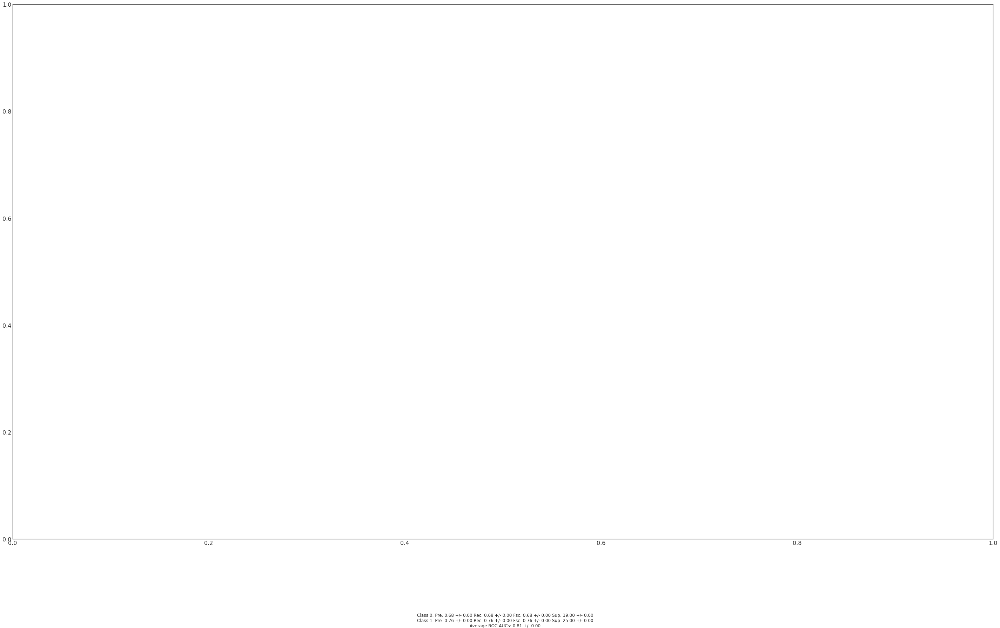


-----
Begin Gaussian Process
-----

Directory Gaussian_Process already exists will be overwritten
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a bette

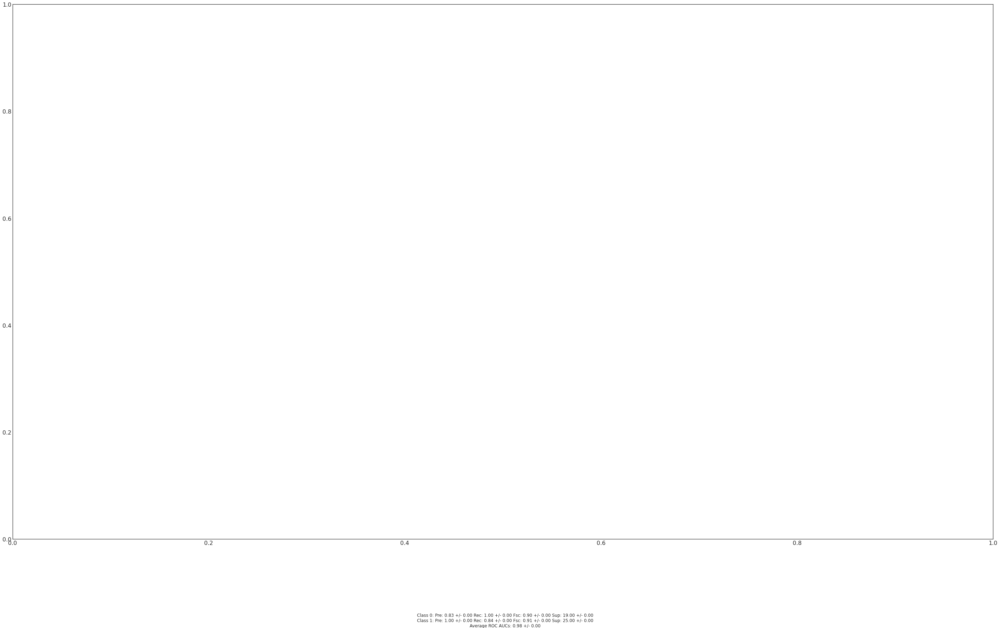


-----
Begin Decision Tree
-----

Directory Decision_Tree already exists will be overwritten
	Best parameters; {'max_depth': 3}
	0.6434 (+/-0.1035) for {'max_depth': 2}
	0.6722 (+/-0.0915) for {'max_depth': 3}
	0.6336 (+/-0.0759) for {'max_depth': 4}
	0.6102 (+/-0.0763) for {'max_depth': 5}
	0.6393 (+/-0.0637) for {'max_depth': 7}
	0.6091 (+/-0.0975) for {'max_depth': 10}

	----- Predicting using: Decision_Tree -----
	ROC analysis area under the curve: 0.6389473684210526
	Confusion matrix (Decision_Tree):
[[15  4]
 [13 12]]


	score (Decision_Tree): 0.6136363636363636
	Imbalence reports:
	Imbalence classification report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.54      0.79      0.48      0.64      0.62      0.39        19
          1       0.75      0.48      0.79      0.59      0.62      0.37        25

avg / total       0.66      0.61      0.66      0.61      0.62      0.38        44

	 -----Index | Predicted | Label
	--

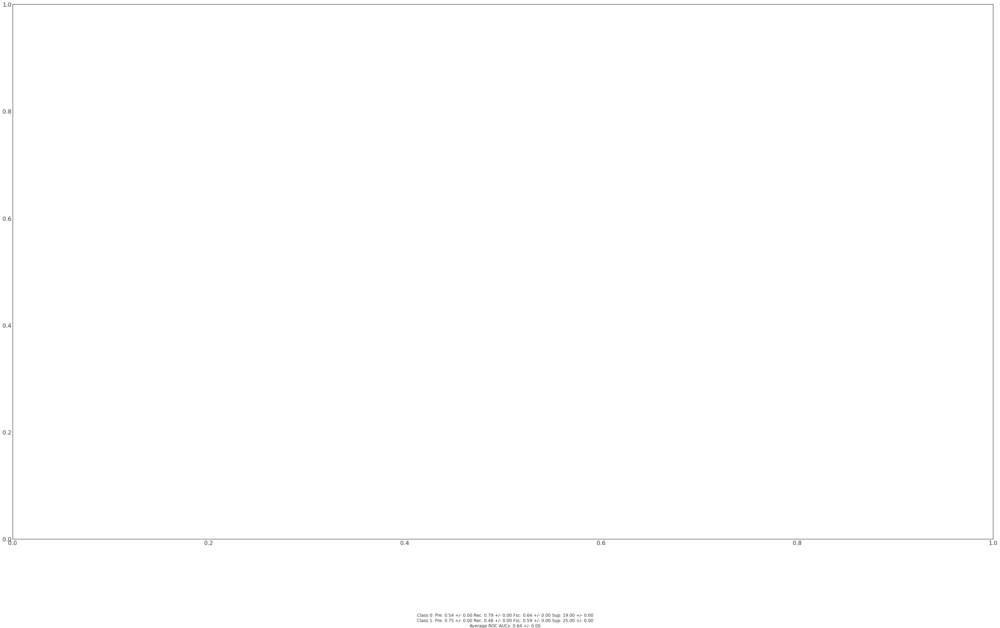


-----
Begin ExtraTreesClassifier
-----

Directory ExtraTreesClassifier already exists will be overwritten
	Best parameters; {'max_depth': 10, 'n_estimators': 50}
	0.7379 (+/-0.1337) for {'max_depth': 2, 'n_estimators': 10}
	0.7158 (+/-0.1177) for {'max_depth': 2, 'n_estimators': 20}
	0.7331 (+/-0.1046) for {'max_depth': 2, 'n_estimators': 50}
	0.7136 (+/-0.1183) for {'max_depth': 2, 'n_estimators': 100}
	0.7343 (+/-0.1199) for {'max_depth': 3, 'n_estimators': 10}
	0.7812 (+/-0.0995) for {'max_depth': 3, 'n_estimators': 20}
	0.7754 (+/-0.0946) for {'max_depth': 3, 'n_estimators': 50}
	0.7550 (+/-0.1059) for {'max_depth': 3, 'n_estimators': 100}
	0.7610 (+/-0.0975) for {'max_depth': 4, 'n_estimators': 10}
	0.7648 (+/-0.0946) for {'max_depth': 4, 'n_estimators': 20}
	0.7790 (+/-0.0948) for {'max_depth': 4, 'n_estimators': 50}
	0.7701 (+/-0.1063) for {'max_depth': 4, 'n_estimators': 100}
	0.7955 (+/-0.1309) for {'max_depth': 5, 'n_estimators': 10}
	0.7964 (+/-0.1125) for {'max_depth': 5, 

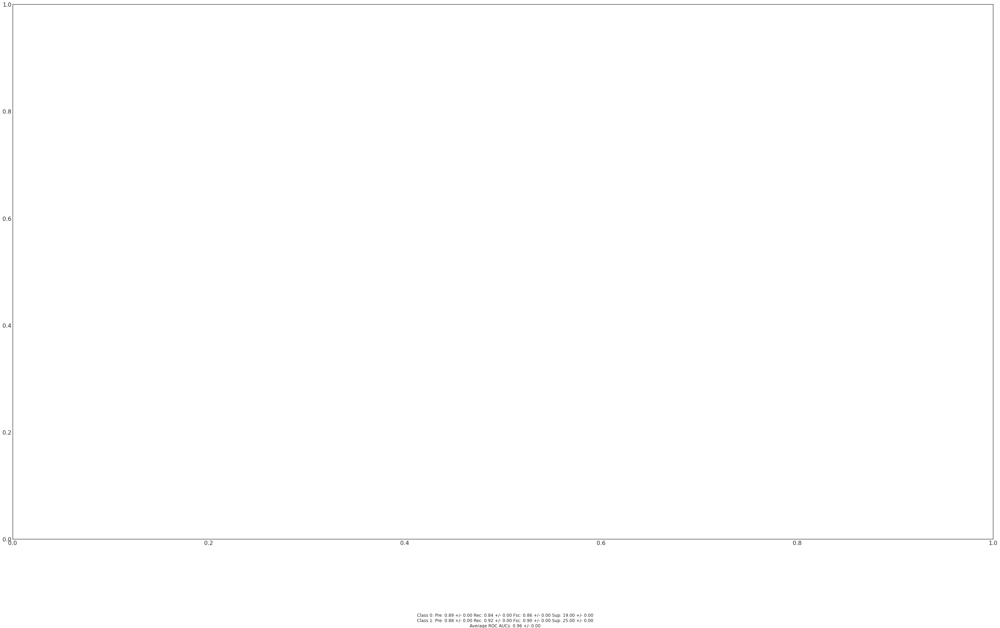


-----
Begin AdaBoost
-----

Directory AdaBoost already exists will be overwritten
	Best parameters; {'n_estimators': 50}
	0.6971 (+/-0.1574) for {'n_estimators': 10}
	0.7069 (+/-0.1488) for {'n_estimators': 20}
	0.7254 (+/-0.1577) for {'n_estimators': 50}
	0.6811 (+/-0.0983) for {'n_estimators': 100}

	----- Predicting using: AdaBoost -----
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
	ROC analysis area under the curve: 0.4410526315789474
	Confusion matrix (AdaBoost):
[[ 1 18]
 [ 1 24]]


	score (AdaBoost): 0.5681818181818182
	Imbalence reports:
	Imbalence classification report:
                   pre       rec       spe        f1       geo       iba       sup

          0       0.50      0.05      0.96      0.10      0.22      0.05        19
          1       0.57      0.96      0.05      0.72      0.22      0.06        25

avg / total       0.54      0.57      0.44      0.45      0.22      0.05  

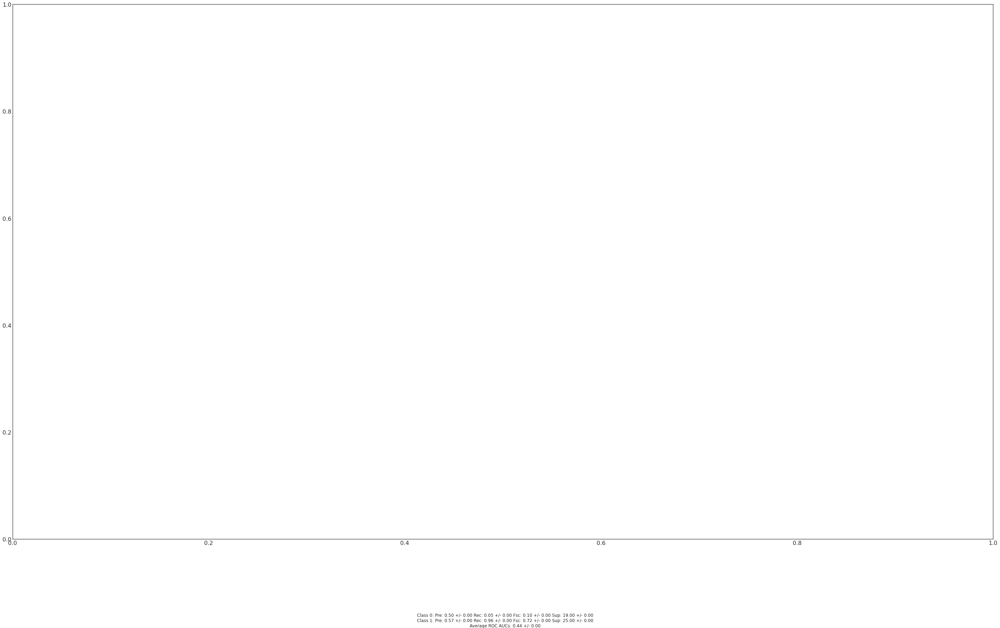


-----
Begin Logistic Regression
-----

Directory Logistic_Regression already exists will be overwritten
/Users/allybo/opt/anaconda3/envs/Pythia/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/allybo/opt/anaconda3/envs/Pythia/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please 

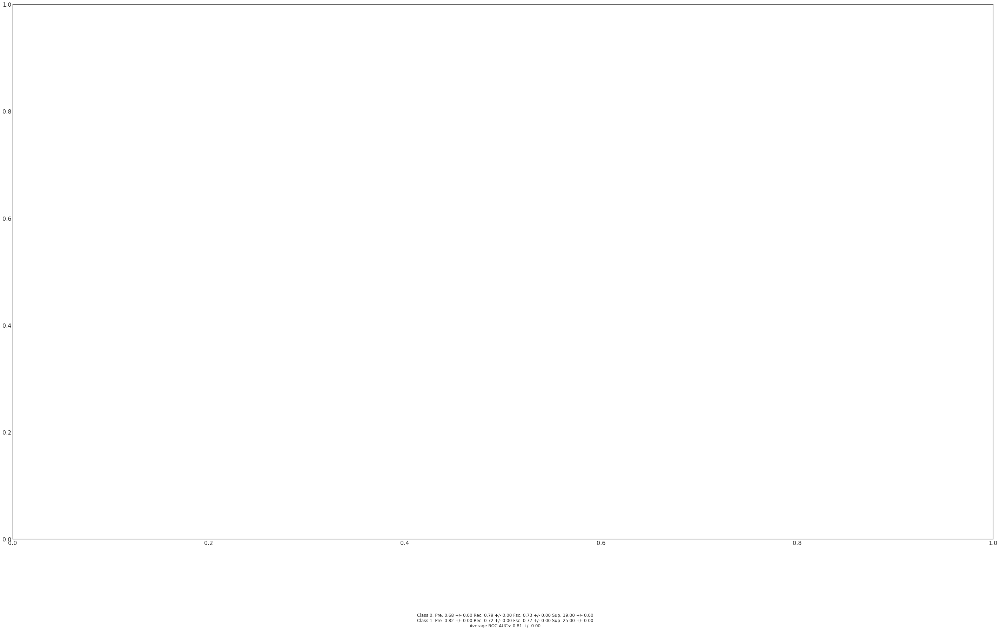

In [474]:
kfold_test_imbalenced_classifiers_with_optimization(Xtrain,Xtest, Ytrain , Ytest, kfold_classifiers, kfold_classifier_parameters, 
                                                        overwrite=True, cv=5, n_repeats=10,
                                                        random_seed=random_seed, clf_names=kfold_clf_names, class_labels=(0,1))

In [475]:
directory_names = cwf.directory_names(kfold_clf_names)


Nearest_Neighbors
-------------

Reading 0.csv


Saving plot to fig_nearest_neighbors_morgan.png
['fig_nearest_neighbors_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 13, 'fp': 6, 'fn': 6, 'tp': 19}
[[13  6]
 [ 6 19]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report

Gaussian_Process
-------------

Reading 0.csv
Saving plot to fig_gaussian_process_morgan.png
['fig_nearest_neighbors_morgan.png', 'fig_gaussian_process_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 19, 'fp': 0, 'fn': 4, 'tp': 21}
[[19  0]
 [ 4 21]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Decision_Tree
-------------

Reading 0.csv
Saving plot to fig_decision_tree_morgan.png
['fig_nearest_neighbors_morgan.png', 'fig_gaussian_process_morgan.png', 'fig_decision_tree_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 15, 'fp': 4, 'fn': 13, 'tp': 12}
[[15  4]
 [13 12]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

ExtraTreesClassifier
-------------

Reading 0.csv
Saving plot to fig_extratreesclassifier_morgan.png
['fig_nearest_neighbors_morgan.png', 'fig_gaussian_process_morgan.png', 'fig_decision_tree_morgan.png', 'fig_extratreesclassifier_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 16, 'fp': 3, 'fn': 2, 'tp': 23}
[[16  3]
 [ 2 23]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

AdaBoost
-------------

Reading 0.csv
Saving plot to fig_adaboost_morgan.png
['fig_nearest_neighbors_morgan.png', 'fig_gaussian_process_morgan.png', 'fig_decision_tree_morgan.png', 'fig_extratreesclassifier_morgan.png', 'fig_adaboost_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 1, 'fp': 18, 'fn': 1, 'tp': 24}
[[ 1 18]
 [ 1 24]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

Logistic_Regression
-------------

Reading 0.csv
Saving plot to fig_logistic_regression_morgan.png
['fig_nearest_neighbors_morgan.png', 'fig_gaussian_process_morgan.png', 'fig_decision_tree_morgan.png', 'fig_extratreesclassifier_morgan.png', 'fig_adaboost_morgan.png', 'fig_logistic_regression_morgan.png']
Attempting to calculate confusion based metrics
{'tn': 15, 'fp': 4, 'fn': 7, 'tp': 18}
[[15  4]
 [ 7 18]]
(0, 1)


<AxesSubplot:title={'center':'Confusion Matrix'}, xlabel='Predicted Class', ylabel='Known Class'>

2
Support cannot be gotten from classification report
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
\begin{tabular}{lrrrrrr}
\toprule
{} &  Accuracy &  Sensitivity &  Specificity &   MCC &  Precision &  G-mean \\
\midrule
nearest neighbors    &      0.73 &         0.76 &         0.68 &  0.44 &       0.76 &    0.72 \\
gaussian process     &      0

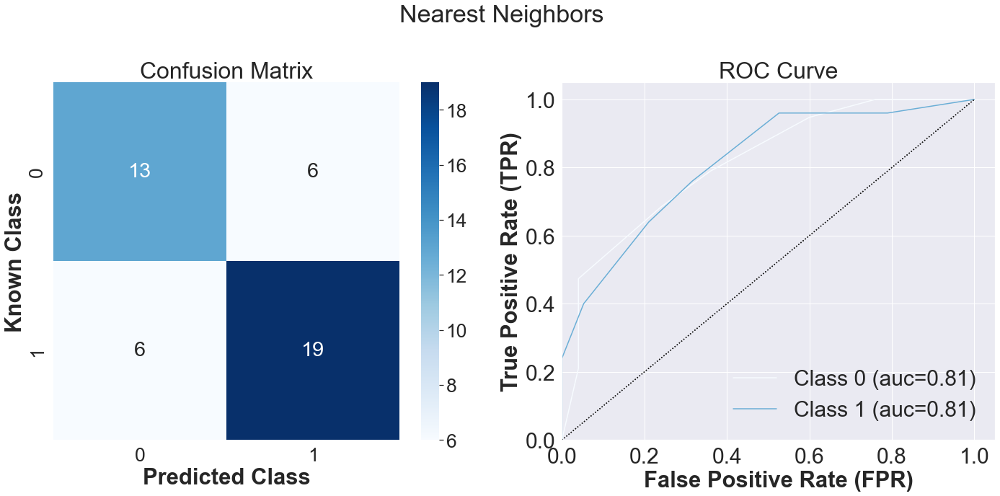

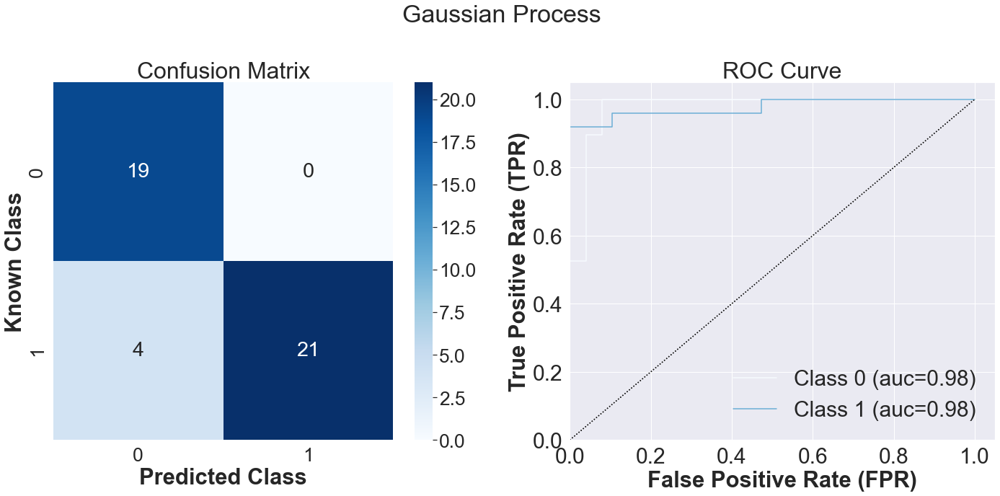

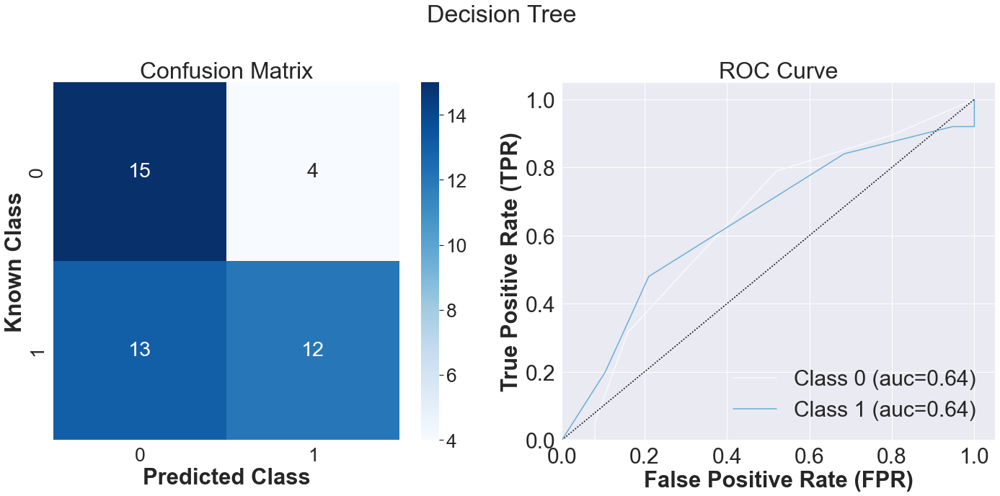

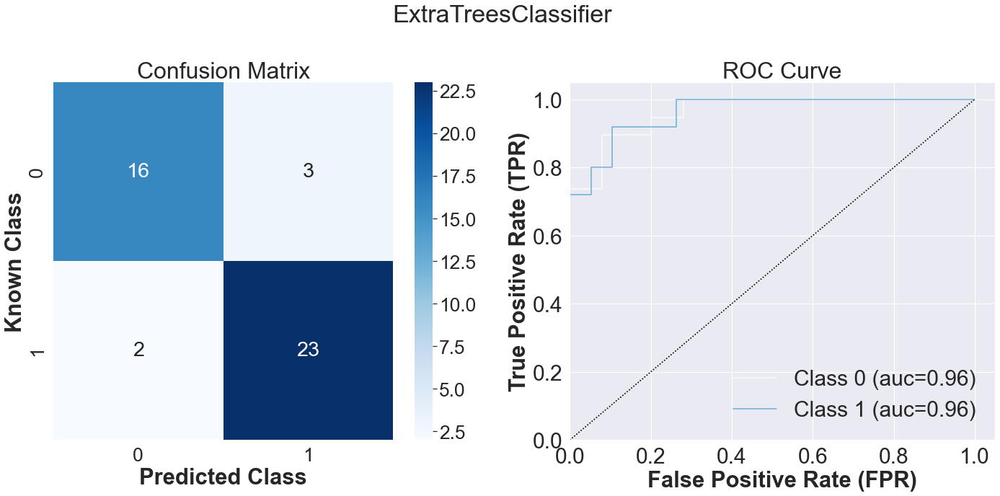

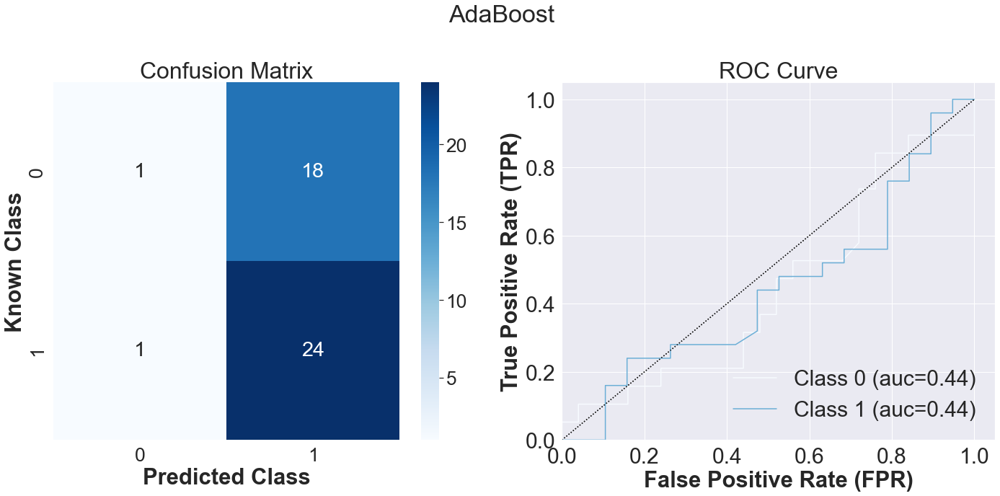

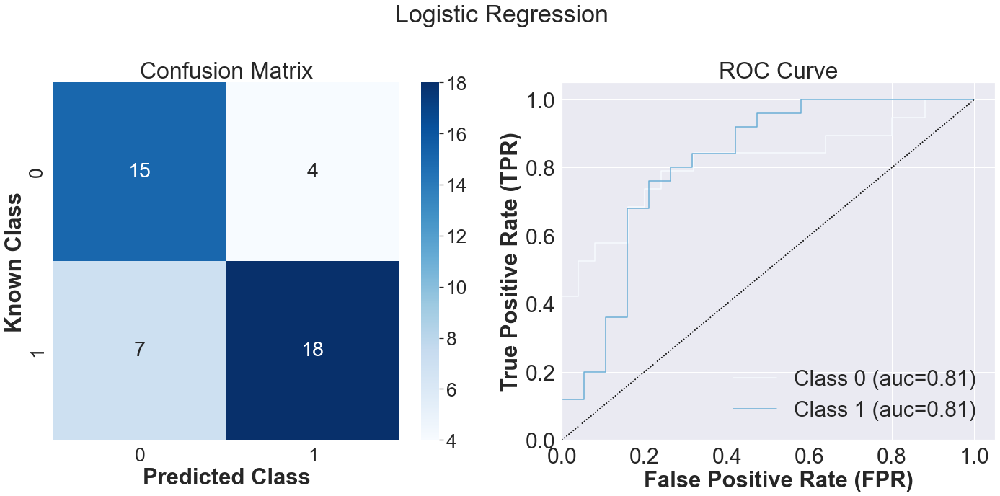

In [481]:
files_plt = []

for ith, dirname in enumerate(directory_names):
    log.info("\n{}\n-------------\n".format(dirname))
    data = cwf.build_data_from_directory(dirname, max_folds=1)
    
#     log.debug("Last value in the data frame: {}".format(data[165:166]))
    
    probs = data[["prob0", "prob1"]].to_numpy()
    log.debug("Probablities for a few examples {}".format(probs[0:3,0:2]))
    
    cm = cmetrics.get_confusion_matrix(data, predicted_column_name="prediction", known_column_name="known", return_dict=False)
    log.debug("Confusion matrix for {}\n{}".format(dirname, cm))
    
    plt_name = "fig_{}_morgan.png".format("_".join([ent.lower() for ent in dirname.split()]))
    files_plt.append(plt_name)
    log.info("Saving plot to {}\n{}".format(plt_name, files_plt))
    metrics = cmetrics.calculate_confusion_based_metrics(df=data, probabilities=probs, col_map="Blues", positive_label=1, 
                                                         plt_filename=plt_name, all_classes=False, get_roc_curve=True, 
                                                         get_pr_curve=False, annotate=True, vmin=0, vmax=85,
                                                         title="{}".format(kfold_clf_names[ith]))
    #log.info("{}".format("\n".join(["{}: {}".format(k, v) for k, v in metrics.items()])))
    
    metrics_for_paper = {
    "Accuracy": metrics["accuracy"].round(2),
    "Sensitivity": metrics["tpr"].round(2),
    "Specificity": metrics["tnr"].round(2),
    "MCC": metrics["matthews_correlation_coefficient"].round(2),
    "Precision": metrics["precision"].round(2),
    "G-mean": metrics["g-mean"].round(2),
    }
    
    if ith == 0:
        df_metrics_for_paper = pd.DataFrame(data=metrics_for_paper, index=[kfold_clf_names[ith].lower()])
    else:
        df_metrics_for_paper = df_metrics_for_paper.append(pd.Series(metrics_for_paper, name=kfold_clf_names[ith].lower()))
    log.debug(df_metrics_for_paper)

with open("metrics_mordred.tex", "w") as fout:
    cap = "Classifier metrics for balanced data for ddg with models built from mordred features. MCC is the Matthew’s correlation coefficent."
    df_metrics_for_paper.to_latex(fout, float_format="{:0.2f}".format, position="H", caption=cap, label="tbl:mordred_features")
log.info(df_metrics_for_paper.to_latex())

In [482]:
images = [Image.open(x) for x in files_plt]
log.info("Combining {} images".format(len(images)))
widths, heights = zip(*(i.size for i in images))
log.info("{}".format("\n".join("W: {} H: {}".format(wid, hgt) for wid, hgt in zip(widths, heights))))
total_height = sum(heights)
total_width = max(widths)

log.info("New image will be W:{} H:{}".format(total_width, total_height))

combined_image = Image.new("RGBA", (total_width, total_height))
y_offset = 0
for ith, img in enumerate(images):
    log.info("Image {} added at offset height {}".format(ith, y_offset))
    combined_image.paste(img, (0, y_offset))
    y_offset = y_offset + img.size[1]

combined_image.save("combined_morgan.png")

Combining 6 images
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
W: 6000 H: 3000
New image will be W:6000 H:18000
Image 0 added at offset height 0
Image 1 added at offset height 3000
Image 2 added at offset height 6000
Image 3 added at offset height 9000
Image 4 added at offset height 12000
Image 5 added at offset height 15000


# Analysis

In [483]:
import shap
from pythia import scaling
import joblib
import pandas as pd
import numpy as np

from pythia import scaling
from glob import glob
import joblib
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,plot_confusion_matrix
from sklearn.metrics import roc_curve, auc
from imblearn.metrics import classification_report_imbalanced, sensitivity_specificity_support



In [484]:
model_files = glob("*.sav")
model_files

['finalized_MLmodel_ExtraTreesClassifier.sav',
 'finalized_MLmodel_Decision_Tree.sav',
 'finalized_MLmodel_AdaBoost.sav',
 'finalized_MLmodel_Nearest_Neighbors.sav',
 'finalized_MLmodel_Logistic_Regression.sav',
 'finalized_MLmodel_Gaussian_Process.sav']

## Feature importances

In [582]:
plt.rcParams.update()
#ref: http://www.futurile.net/2016/02/27/matplotlib-beautiful-plots-with-style/
# Set the style globally
# Alternatives include bmh, fivethirtyeight, ggplot,
# dark_background, seaborn-deep, etc
plt.style.use('seaborn-white')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['figure.titlesize'] = 24

#fig, ax = plt.subplots(figsize=(9, 9), dpi=300)
#ax.scatter(x, y,s=60, alpha=0.6, edgecolors="k")

### sklearn feature importance

finalized_MLmodel_ExtraTreesClassifier.sav
ExtraTreesClassifier


,feature,importance
0,PEOE_VSA6,0.022772
1,n5ARing_0,0.018946
2,AATSC2se,0.018315
3,ATSC7d,0.018281
4,SdssC,0.017504
...,...,...
139,NdO_5,0.000000
140,n5Ring_3,0.000000
141,n5HRing_3,0.000000
142,carbazole,0.000000


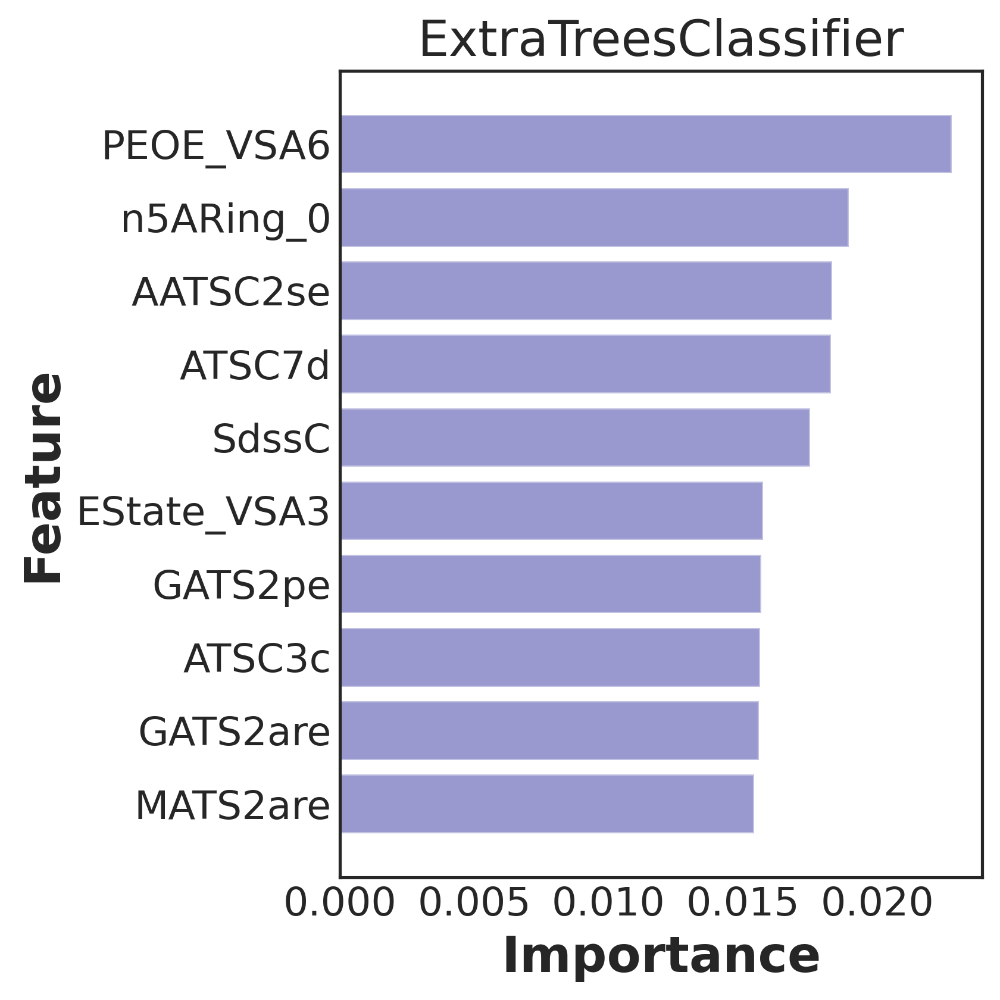

finalized_MLmodel_Decision_Tree.sav
Decision_Tree


,feature,importance
0,VSA_EState1,0.319602
1,BCUTc-1l,0.149655
2,ATSC7d,0.146602
3,GATS1c,0.137507
4,BCUTc-1h,0.115925
...,...,...
45,ATSC2pe,0.000000
44,ATSC2are,0.000000
43,AATSC0c,0.000000
42,AATSC2c,0.000000


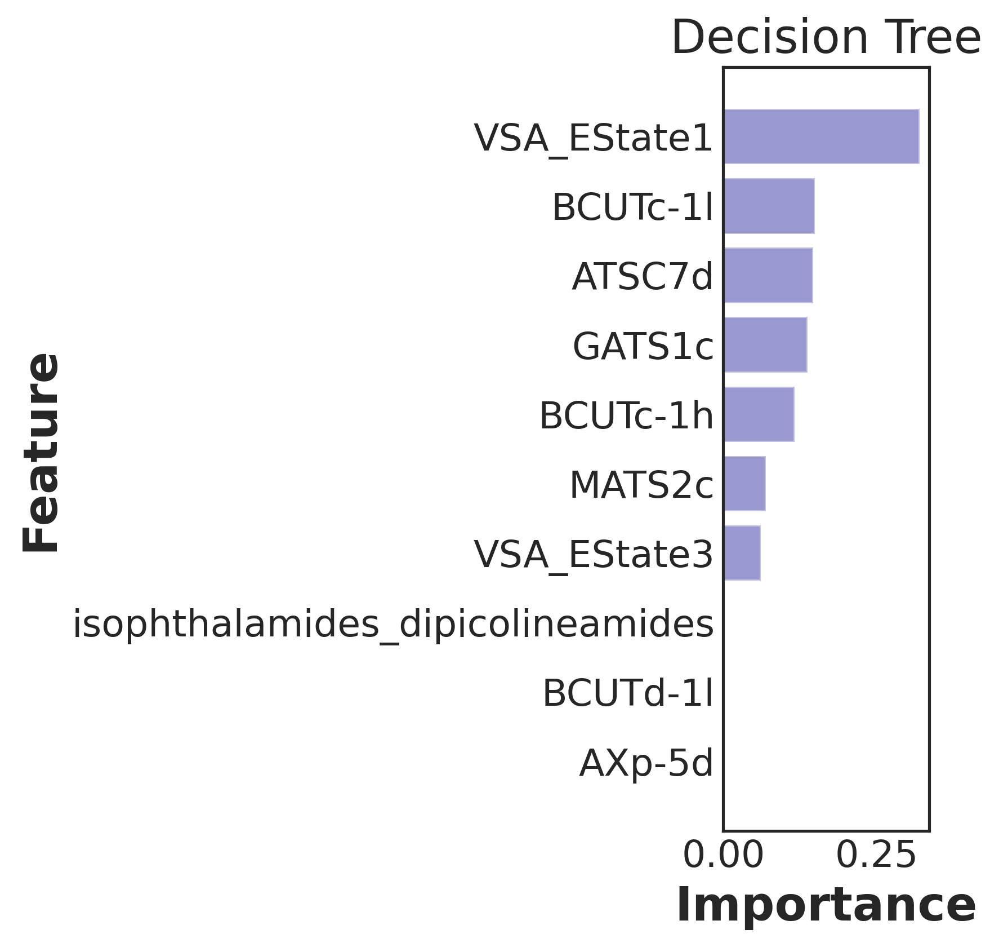

finalized_MLmodel_AdaBoost.sav
AdaBoost


X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


,feature,importance
0,GATS5se,0.06
2,ATSC7d,0.06
1,GATS2se,0.06
8,VSA_EState5,0.04
12,AATSC2c,0.04
...,...,...
65,MATS2se,0.00
64,MATS7v,0.00
63,MATS6s,0.00
62,MATS6d,0.00


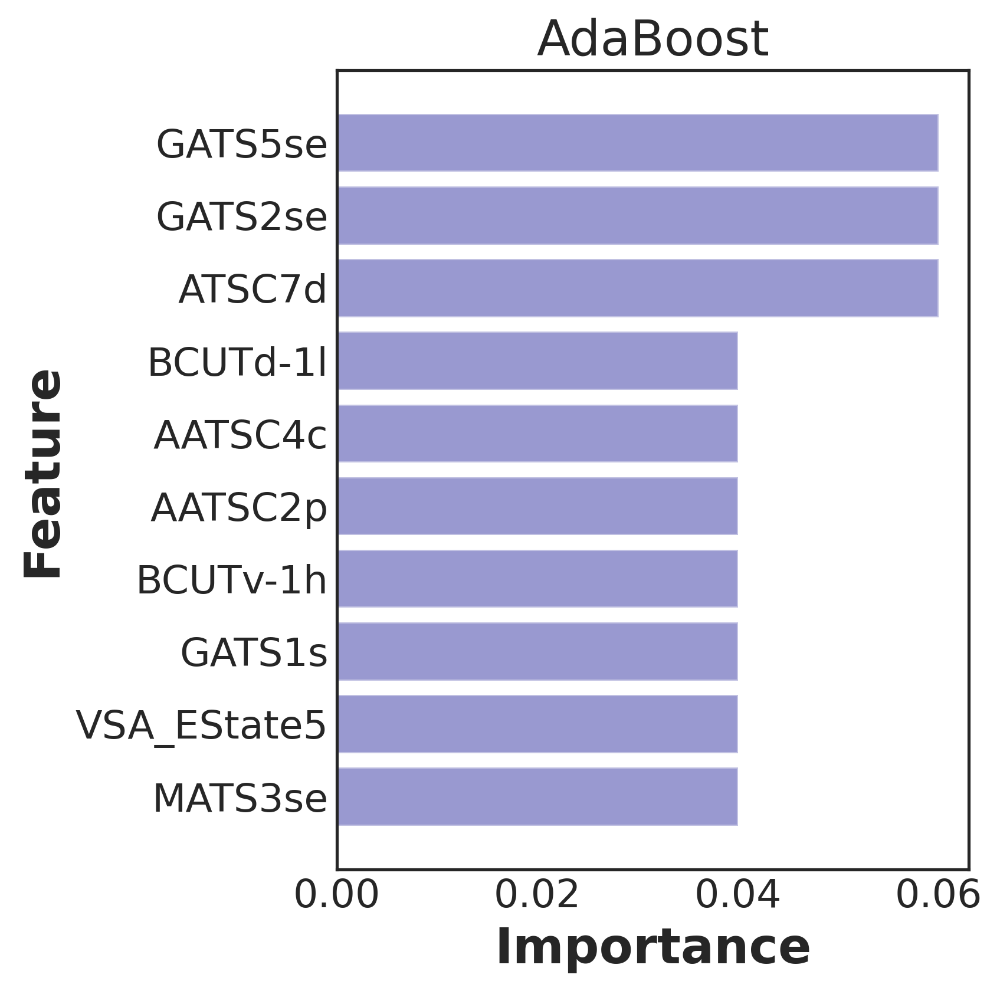

finalized_MLmodel_Logistic_Regression.sav
Logistic_Regression


X does not have valid feature names, but LogisticRegression was fitted with feature names


,feature,importance
0,nBondsD_4,0.471202
1,AATSC0c,0.461900
2,NdssC_3,0.414171
3,AATSC2se,0.361441
4,NdO_0,0.338932
...,...,...
139,urea,-0.377562
140,AXp-5d,-0.400249
141,NdO_6,-0.418317
142,nBondsD_6,-0.418317


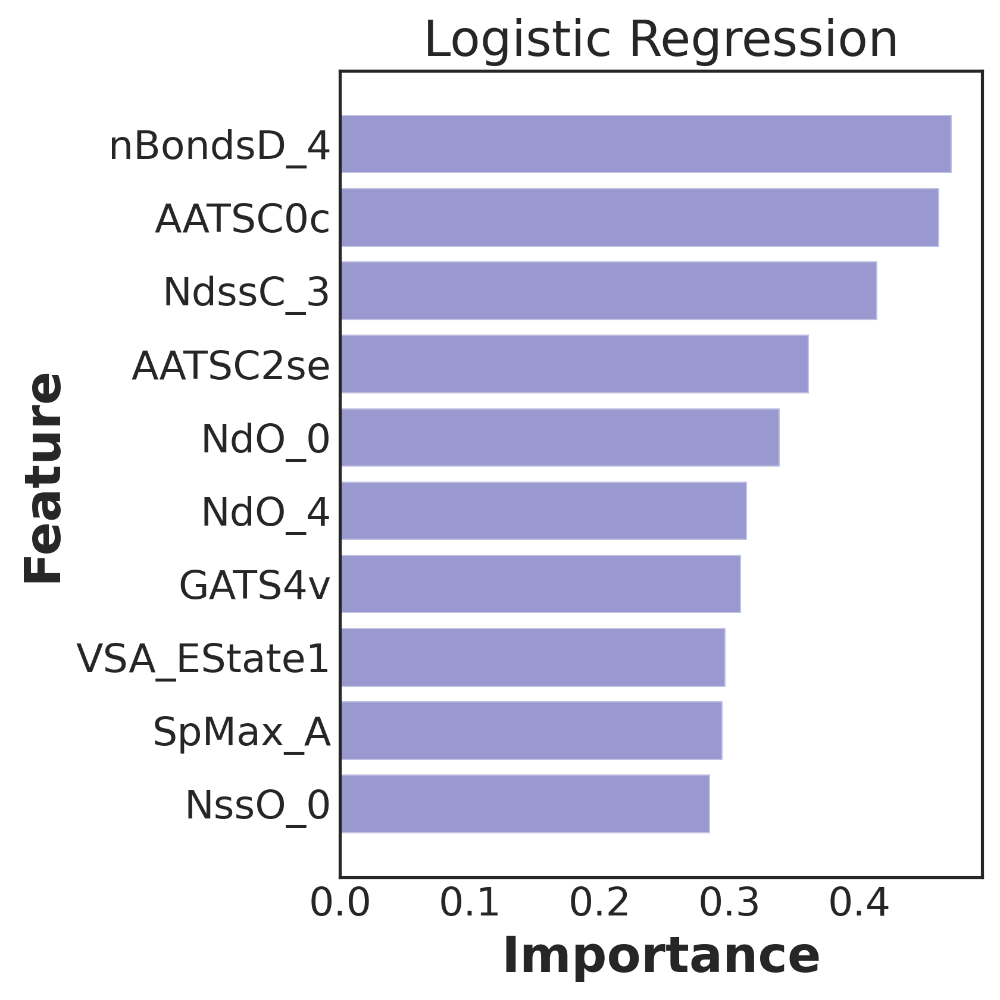

finalized_MLmodel_Gaussian_Process.sav
Gaussian_Process


In [767]:
# all except finalized_MLmodel_Nearest_Neighbors
for model_file in model_files :
    if model_file != "finalized_MLmodel_Nearest_Neighbors.sav":
        print(model_file)
        model_name = model_file.split(".")[0].replace("finalized_MLmodel_", "")
        print(model_name)
        clf_shap = joblib.load(model_file)
        
        if 'Tree' in model_name:
            #For tree like models you can use
            explainer = shap.TreeExplainer(clf_shap)
            importances = clf_shap.feature_importances_

        elif 'AdaBoost' in model_name:
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.feature_importances_

        elif 'Logistic' in model_name:
            #explaining model
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.coef_[0]
        else:
            break


        indices = np.argsort(importances)[::-1]
        features_names = Xtrain.columns
        features = []
        for a in features_names:
            if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
                a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
            if str(a).startswith("cl_conc_(mm)"):
                a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
            features.append(str(a))

        # create a list of feature names and their importance
        feature_importance = []
        for f in range(Xtrain.shape[1]):
            feature_importance.append((features[indices[f]], importances[indices[f]]))
        df_feature_importance = pd.DataFrame(feature_importance, columns=["feature", "importance"])
        display(df_feature_importance.sort_values(by="importance", ascending=False))
        # plot the N most important features
        N = 10
        plt.figure(figsize=(6,6), dpi=300)
        plt.title("{}".format(model_name.replace("_", " ")))
        # make bar chart horizontal
        plt.barh(range(N), [val[1] for val in feature_importance[:N]], align="center", color="darkblue", alpha=0.4)
        plt.yticks(range(N), [val[0] for val in feature_importance[:N]])
        plt.ylim([N, -1])
        plt.xlabel("Importance")
        plt.ylabel("Feature")


        plt.tight_layout()
        plt.savefig("feature_importance_{}.png".format(model_name))
        plt.show()

finalized_MLmodel_ExtraTreesClassifier.sav
ExtraTreesClassifier


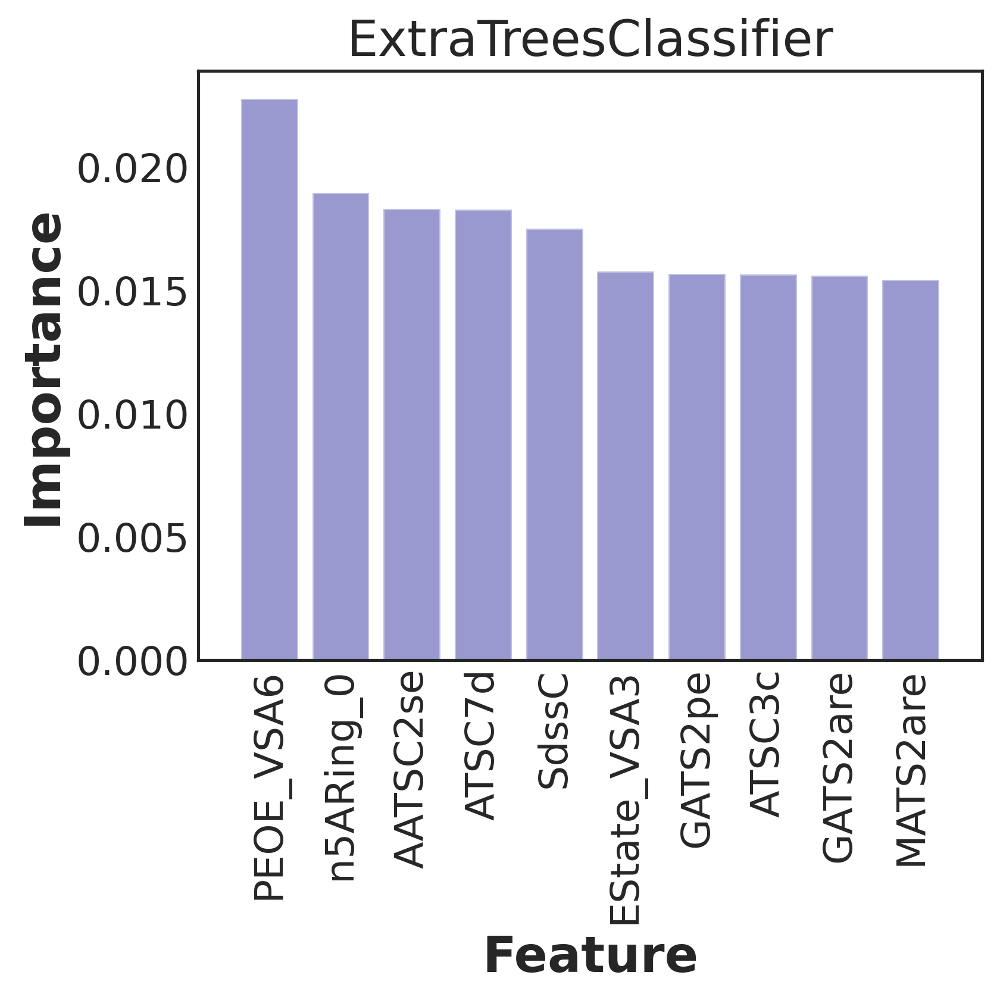

finalized_MLmodel_Decision_Tree.sav
Decision_Tree


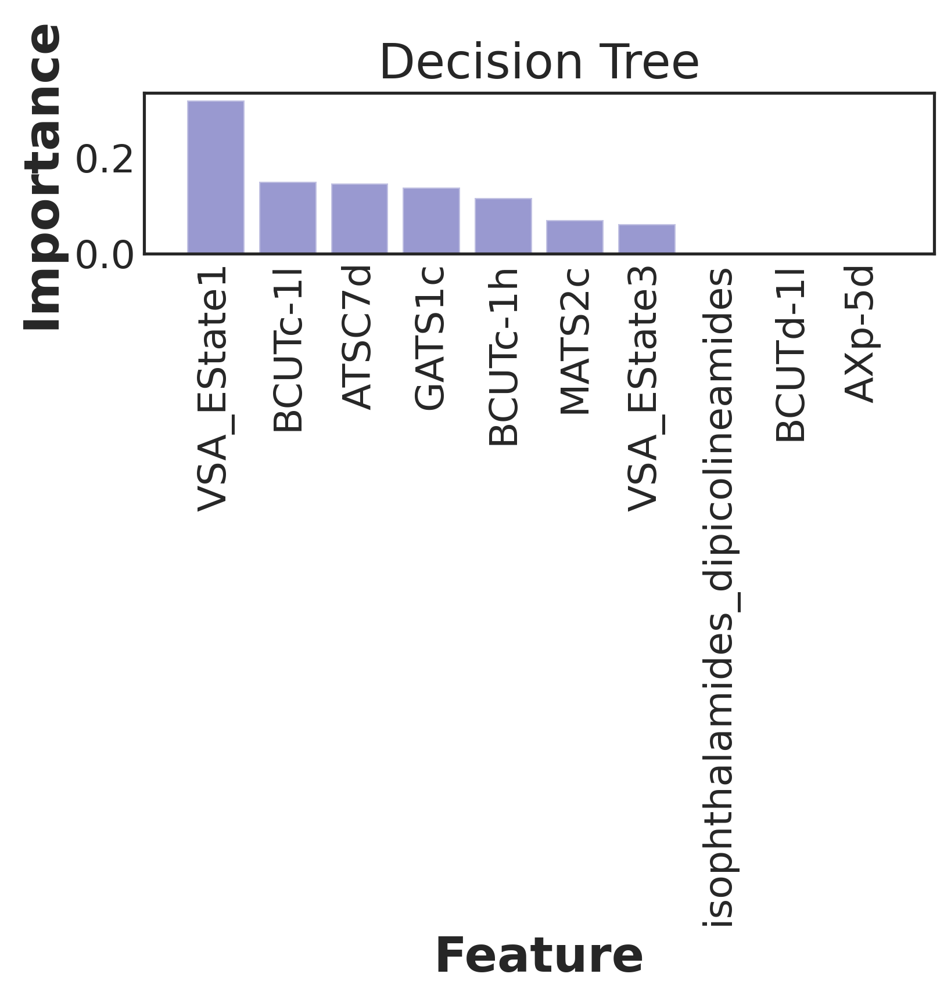

finalized_MLmodel_AdaBoost.sav
AdaBoost


X does not have valid feature names, but AdaBoostClassifier was fitted with feature names


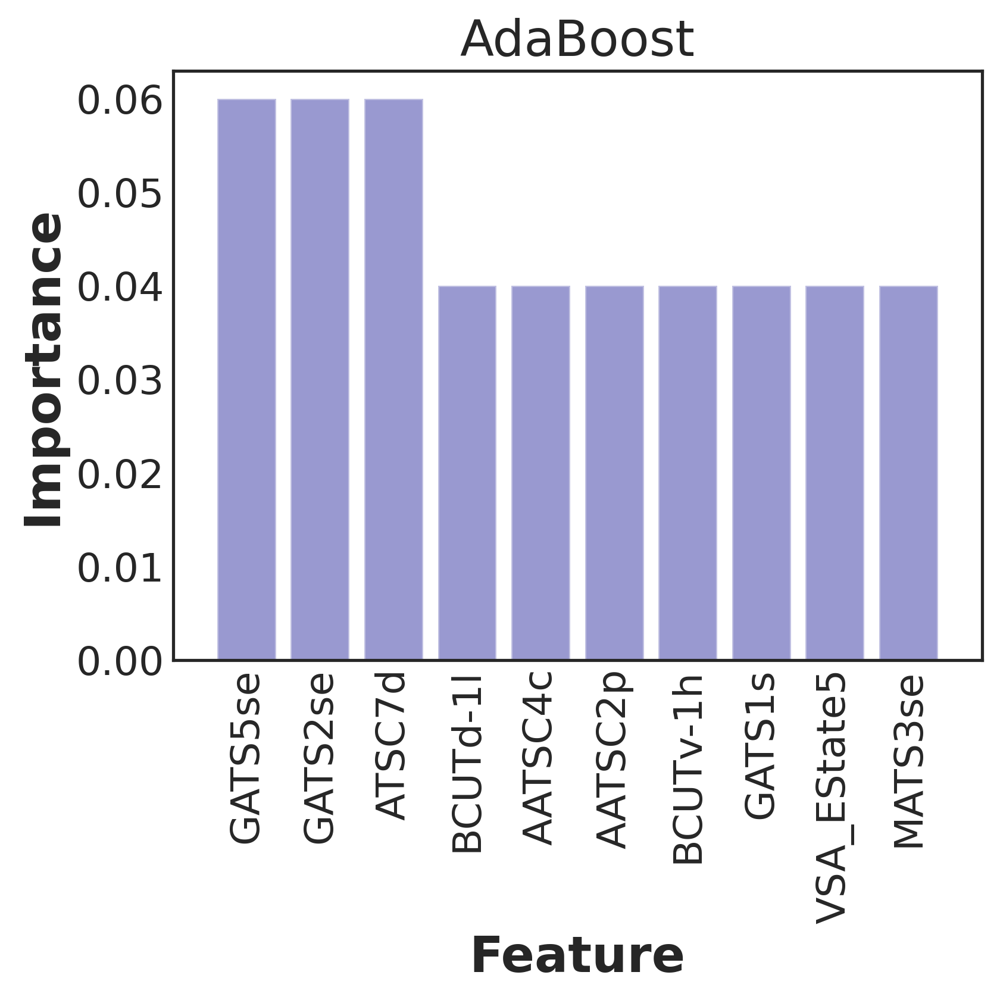

finalized_MLmodel_Logistic_Regression.sav
Logistic_Regression


X does not have valid feature names, but LogisticRegression was fitted with feature names


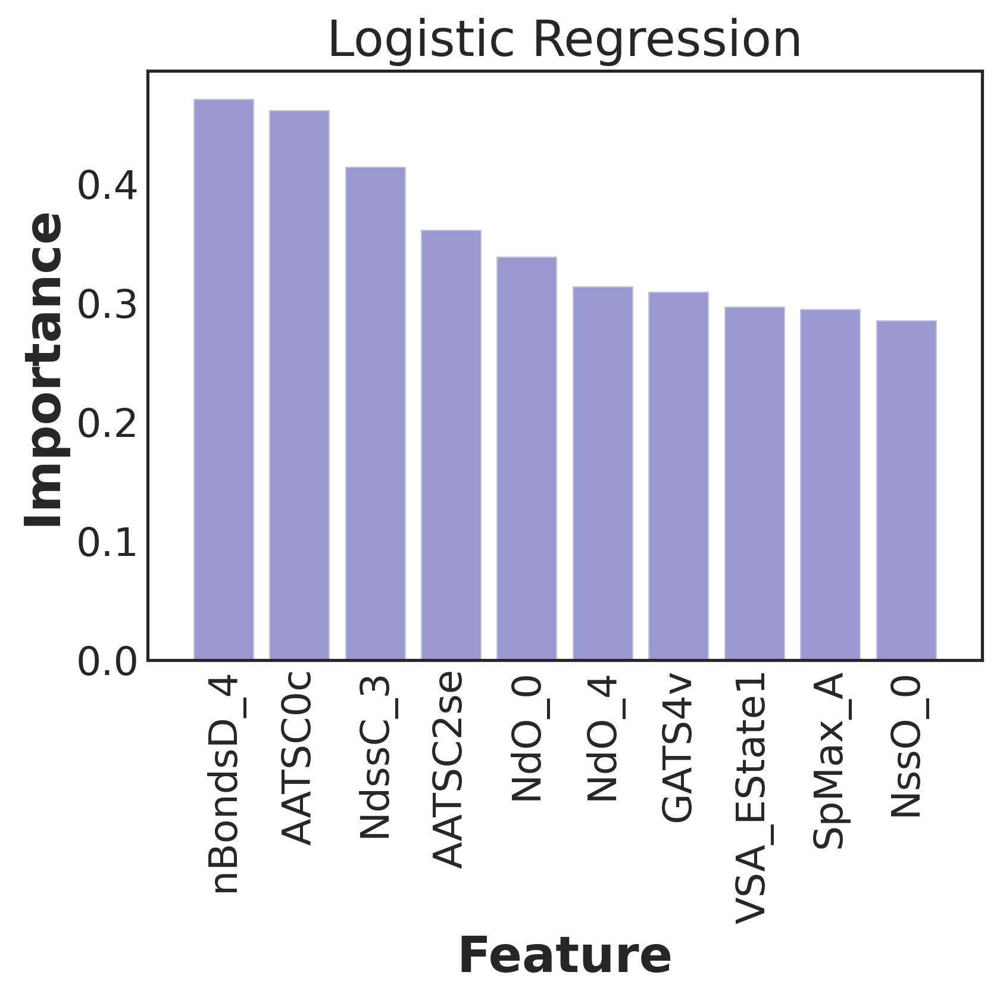

finalized_MLmodel_Gaussian_Process.sav
Gaussian_Process


In [486]:
# all except finalized_MLmodel_Nearest_Neighbors
for model_file in model_files :
    if model_file != "finalized_MLmodel_Nearest_Neighbors.sav":
        print(model_file)
        model_name = model_file.split(".")[0].replace("finalized_MLmodel_", "")
        print(model_name)
        clf_shap = joblib.load(model_file)
        
        if 'Tree' in model_name:
            #For tree like models you can use
            explainer = shap.TreeExplainer(clf_shap)
            importances = clf_shap.feature_importances_

        elif 'AdaBoost' in model_name:
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.feature_importances_

        elif 'Logistic' in model_name:
            #explaining model
            explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtest)
            importances = clf_shap.coef_[0]
        else:
            break


        indices = np.argsort(importances)[::-1]
        features_names = Xtrain.columns
        features = []
        for a in features_names:
            if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
                a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
            if str(a).startswith("cl_conc_(mm)"):
                a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
            features.append(str(a))

        # create a list of feature names and their importance
        feature_importance = []
        for f in range(Xtrain.shape[1]):
            feature_importance.append((features[indices[f]], importances[indices[f]]))
        df_feature_importance = pd.DataFrame(feature_importance, columns=["feature", "importance"])

        # plot the N most important features
        N = 10
        plt.figure(figsize=(6,6), dpi=300)
        plt.title("{}".format(model_name.replace("_", " ")))
        # set background color to white
        plt.bar(range(N), [val[1] for val in feature_importance[:N]], align="center", color="darkblue", alpha=0.4)
        plt.xticks(range(N), [val[0] for val in feature_importance[:N]], rotation=90)
        plt.xlim([-1, N])
        plt.ylabel("Importance")
        plt.xlabel("Feature")


        plt.tight_layout()
        plt.savefig("feature_importance_{}.png".format(model_name))
        plt.show()

### Permutation feature importance

In [487]:
# combine Xtrain and Xtest dataframes
X = pd.concat([Xtrain, Xtest])

In [488]:
# combine Ytrain and Ytest lists
Y = np.concatenate((Ytrain.classes.tolist(), Ytest), axis=0)

In [489]:
from sklearn.inspection import permutation_importance

def plot_permutation_importance(model_file, x, y, n_repeats=10, n_toplot =10, filename = "test"):
    model_name = model_file.split(".")[0].replace("finalized_MLmodel_", "").replace("_", " ")
    print(model_name)
    clf = joblib.load(model_file)
    importance = permutation_importance(clf, x, y, n_repeats=n_repeats, n_jobs=-1)
    
    features_names = x.columns
    features = []
    for a in features_names:
        if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
            a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
        if str(a).startswith("cl_conc_(mm)"):
            a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
        features.append(str(a))

    # make a dataframe with two columns from two lists features and feature_importance
    df = pd.DataFrame({'feature': features, 'importance': importance.importances_mean, 'importance_std': importance.importances_std})
    # add a column with absolute values of feature importance
    df['abs_importance'] = df['importance'].abs()
    # sort the dataframe by absolute value of feature importance in descending order
    df = df.sort_values('abs_importance', ascending = False).reset_index(drop=True)
    df.to_csv("feature_importance_permutation_{}_{}.csv".format(filename, model_name))

    # plot the N most important features
    N = n_toplot
    plt.figure(figsize=(6,6), dpi=300)
    plt.title("{}".format(model_name))
    plt.bar(df['feature'][:N], df['importance'][:N], align='center', color = 'lightgrey')
    # add error bars
    plt.errorbar(df['feature'][:N], df['importance'][:N], yerr=df['importance_std'][:N], fmt='none', capsize=3, color = 'darkgrey')
    plt.xticks(rotation=90)
    plt.ylabel('Importance')
    plt.xlabel('Feature')
    plt.tight_layout()
    
    plt.savefig("feature_importance_permutation_{}_{}.png".format(filename, model_name))
    plt.show() 

finalized_MLmodel_ExtraTreesClassifier.sav
on test set
ExtraTreesClassifier


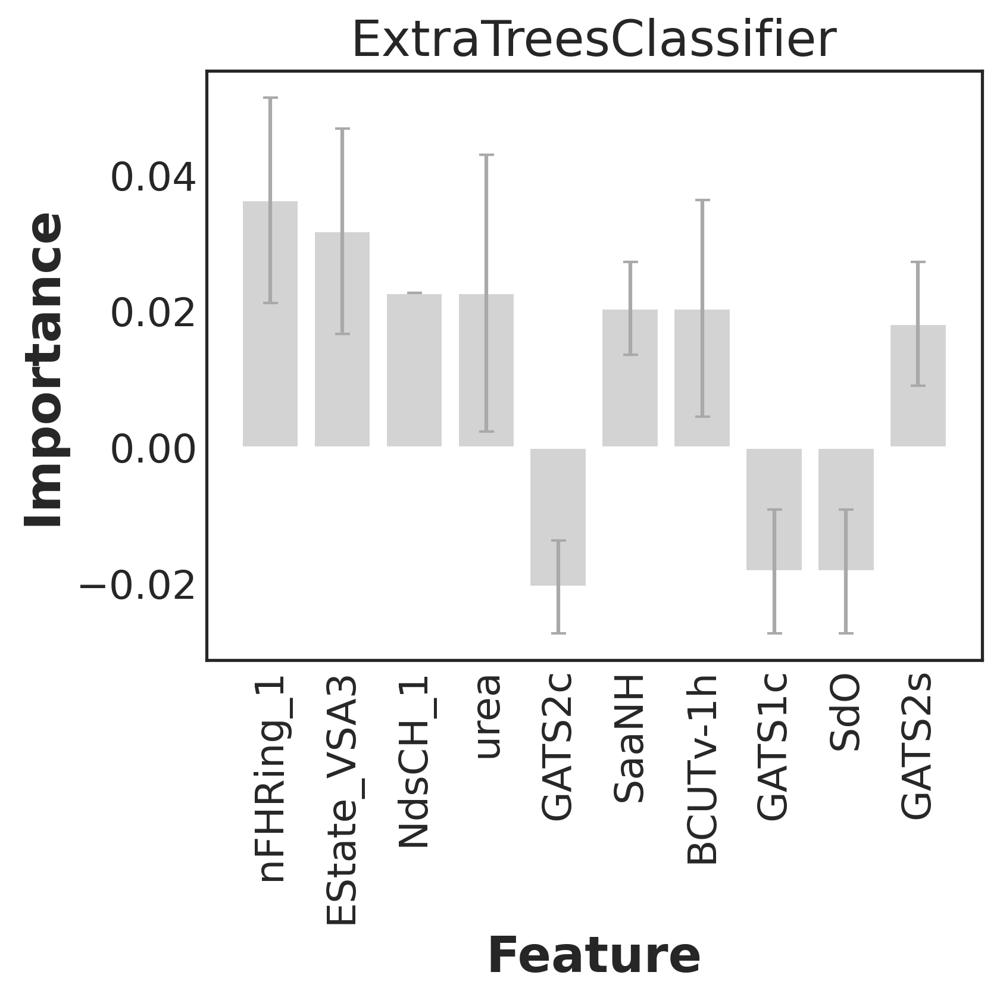

on train set
ExtraTreesClassifier


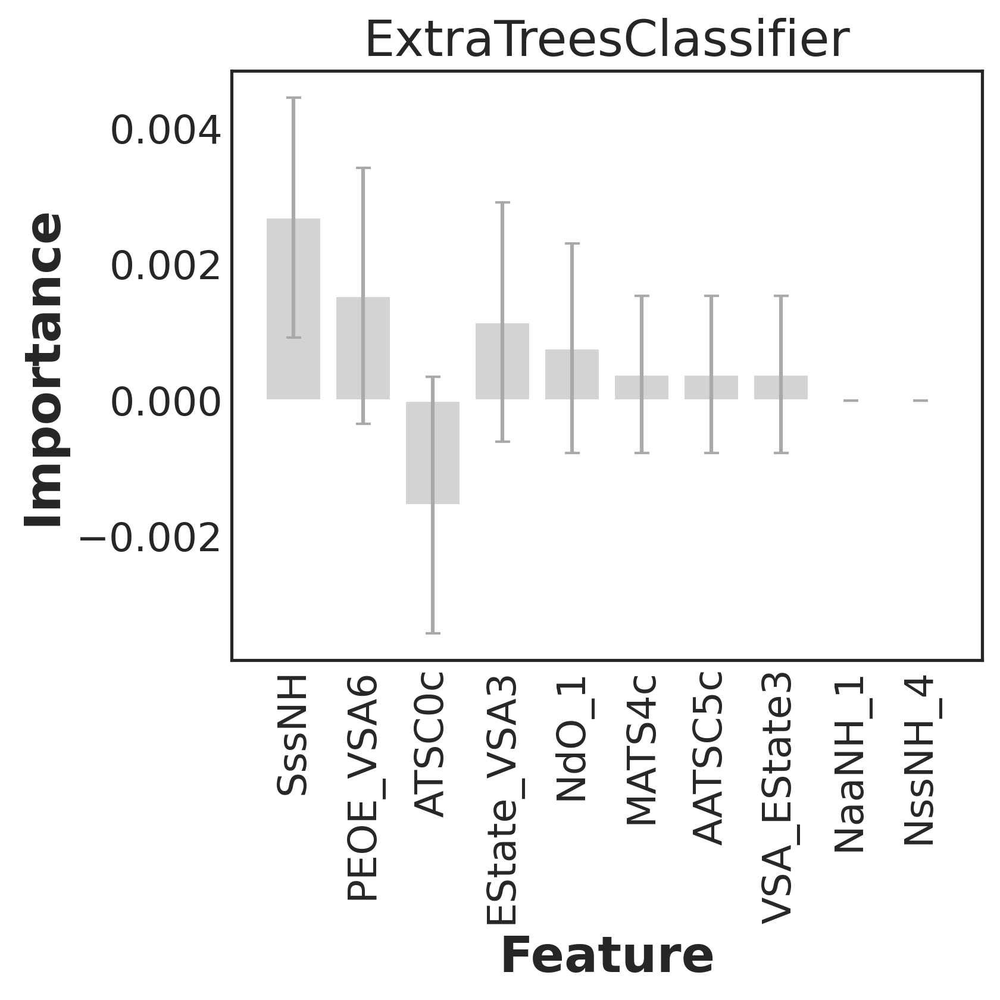

on all set
ExtraTreesClassifier


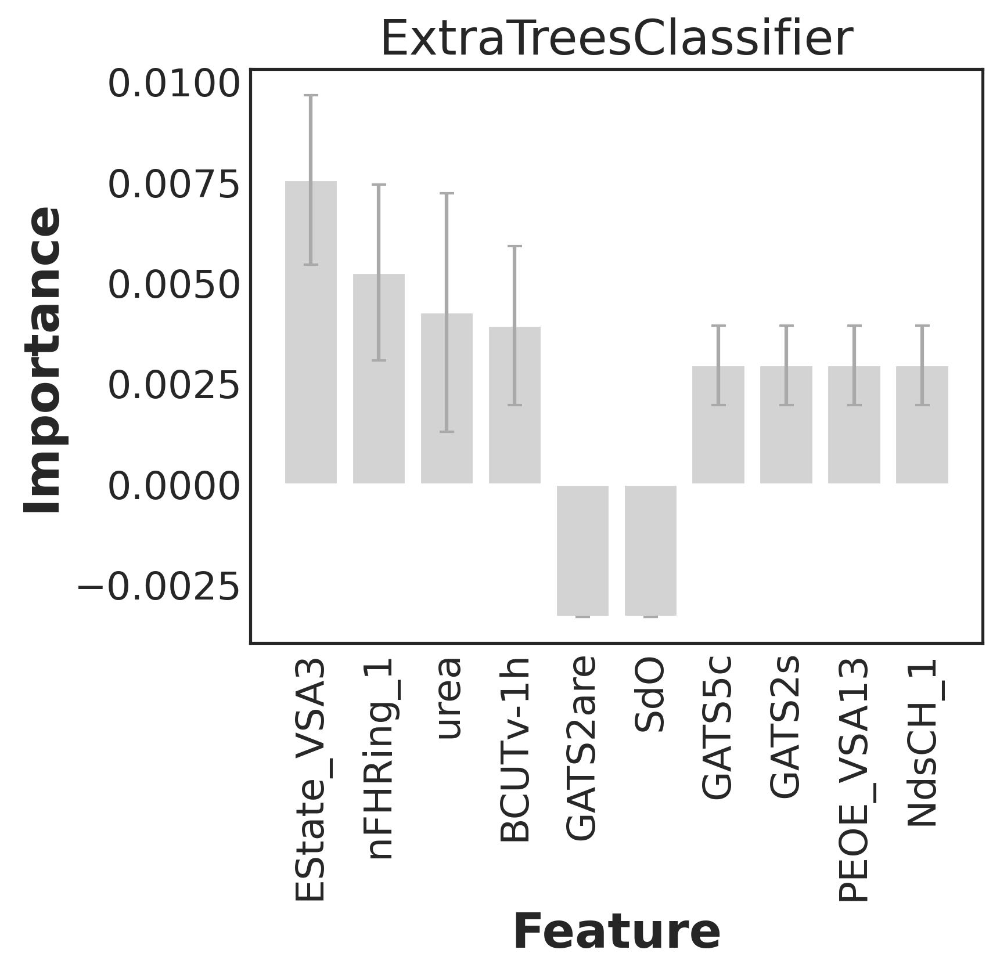

finalized_MLmodel_Decision_Tree.sav
on test set
Decision Tree


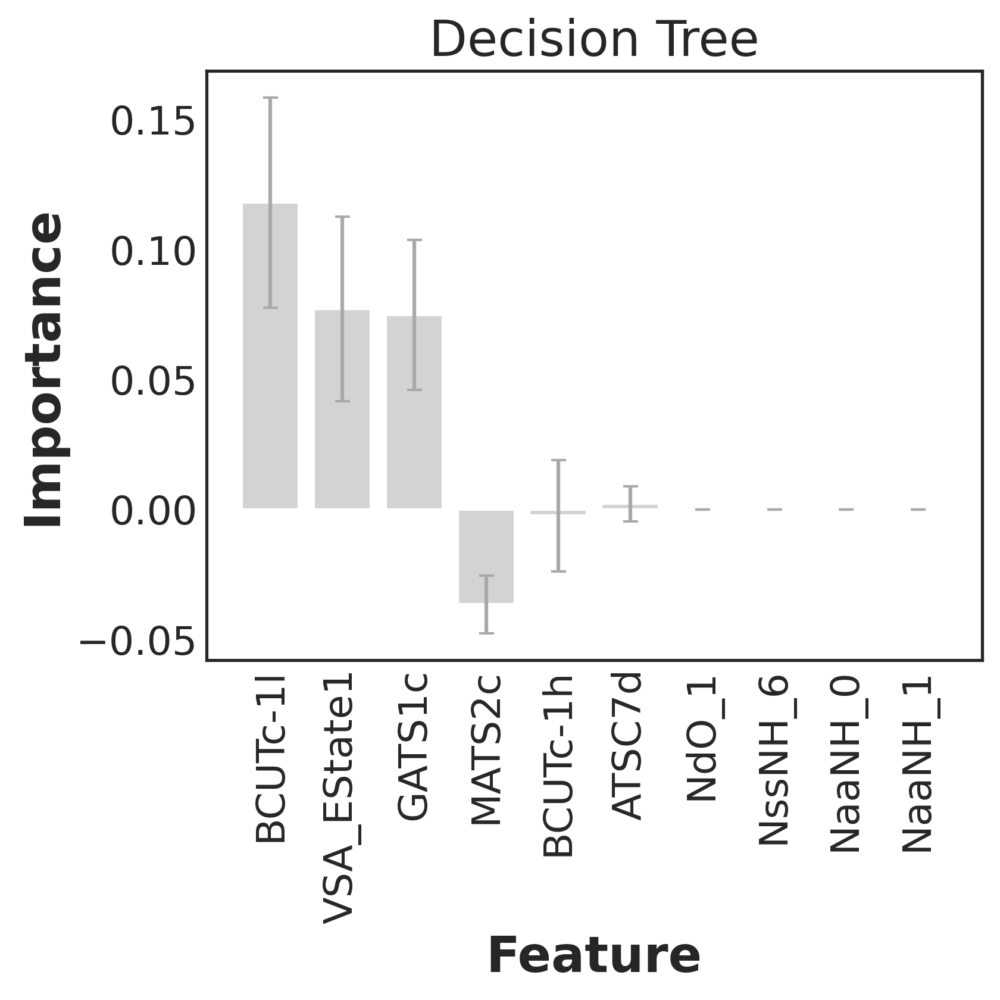

on train set
Decision Tree


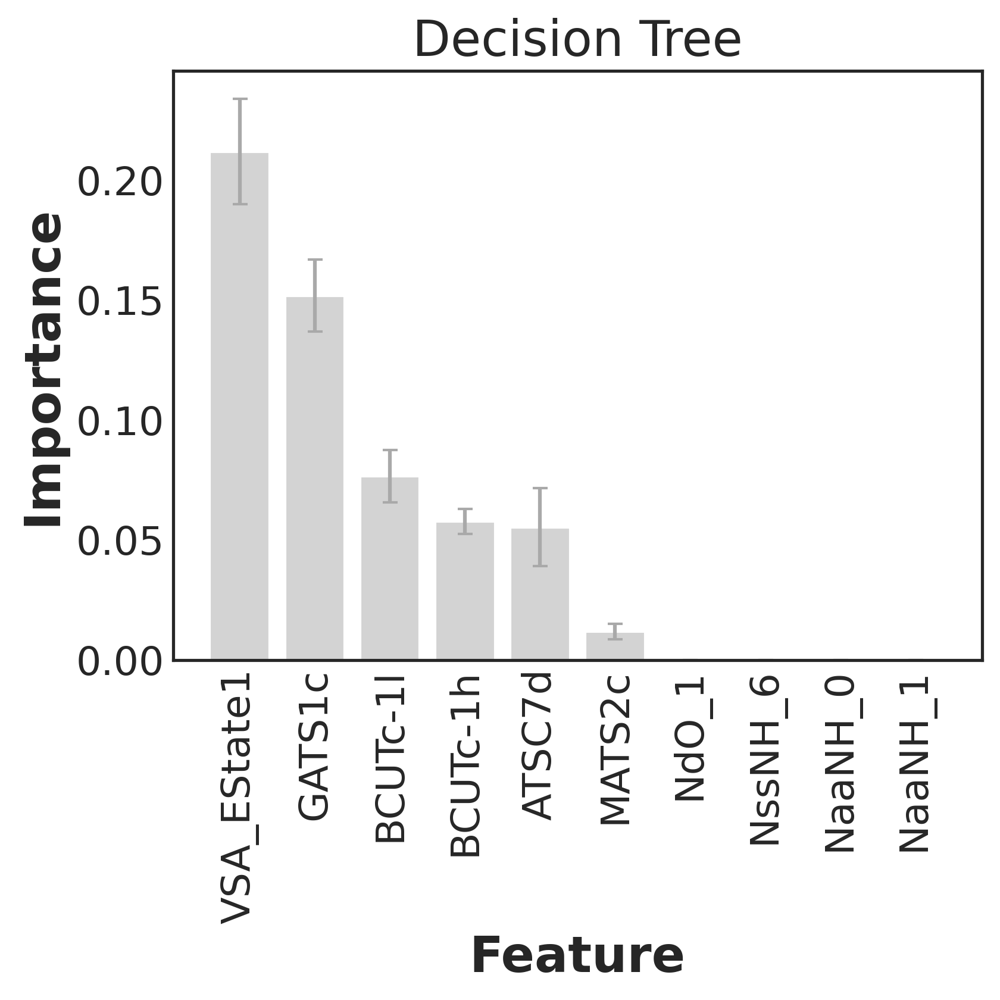

on all set
Decision Tree


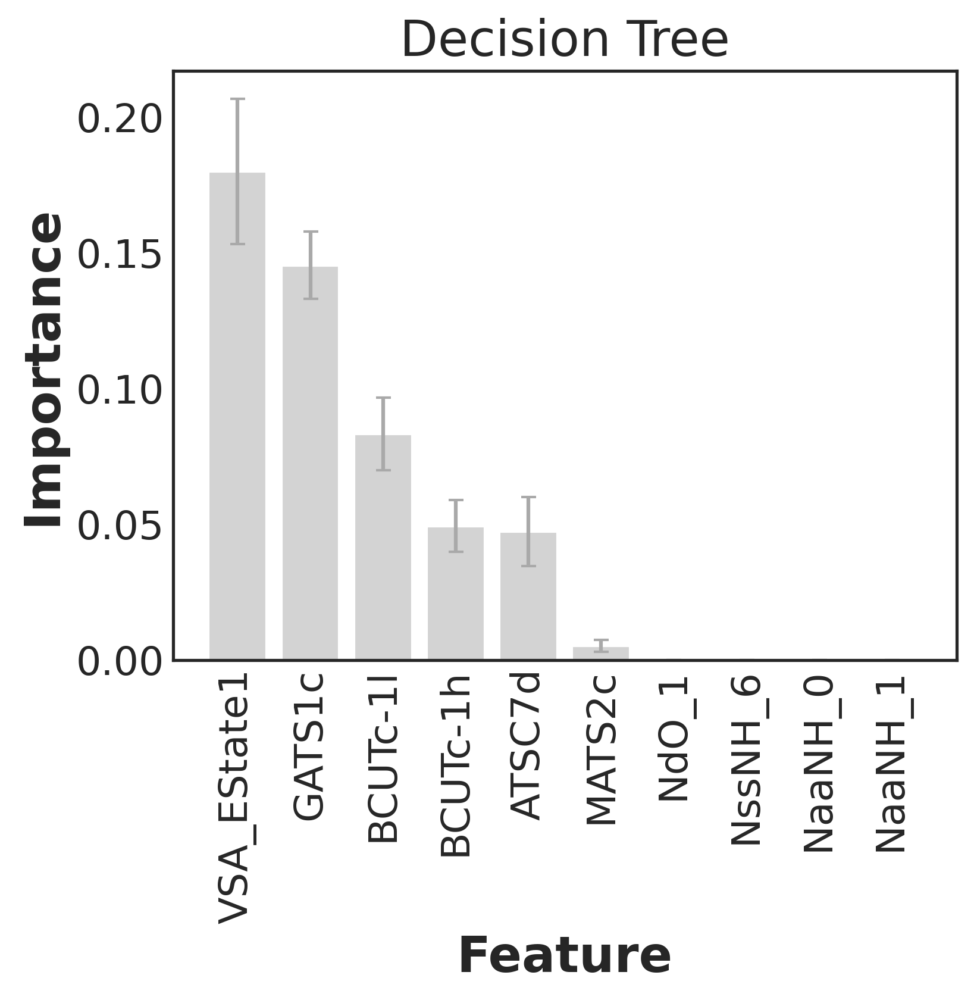

finalized_MLmodel_AdaBoost.sav
on test set
AdaBoost


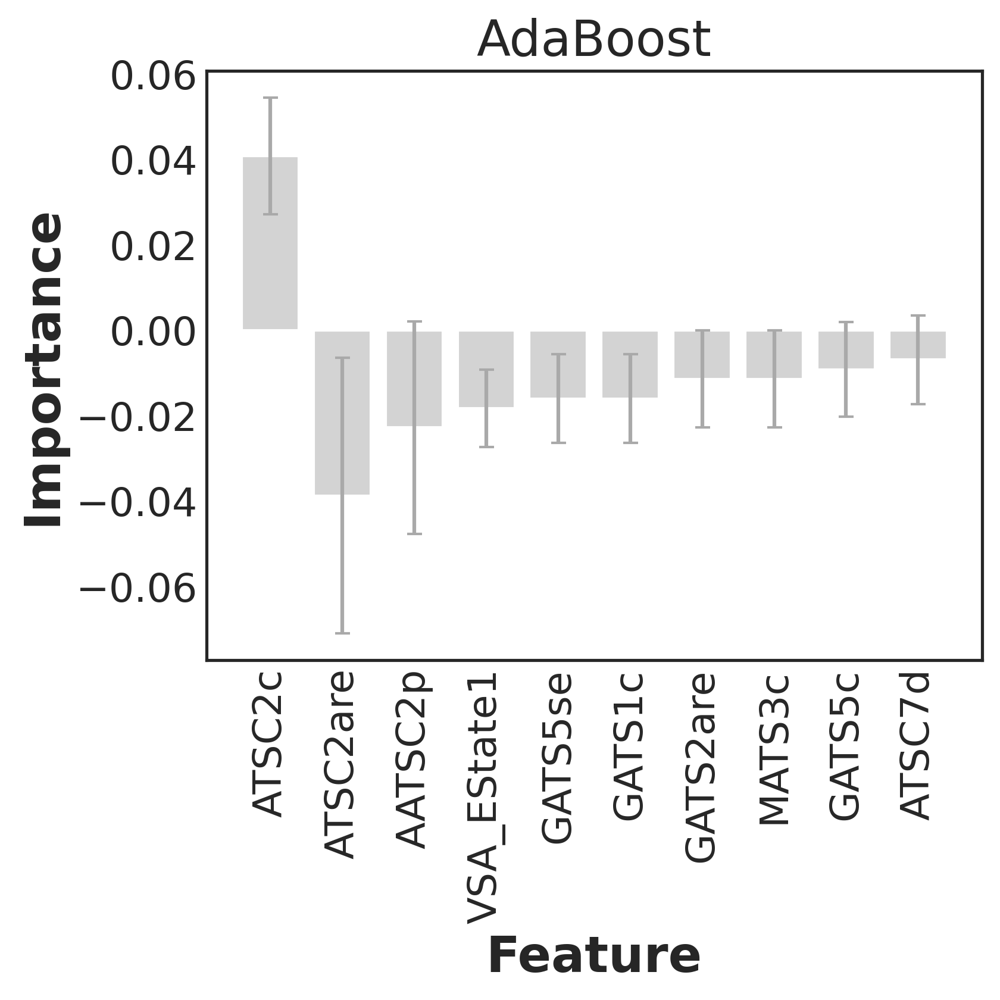

on train set
AdaBoost


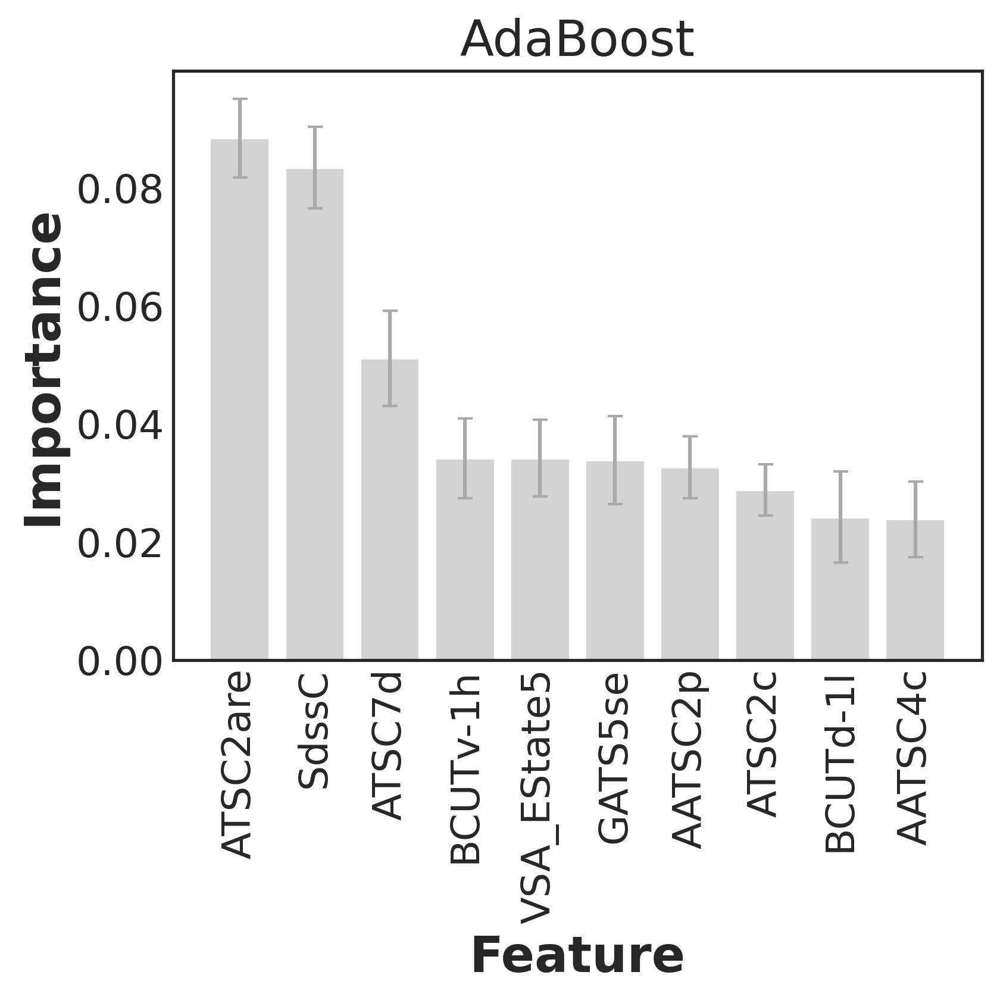

on all set
AdaBoost


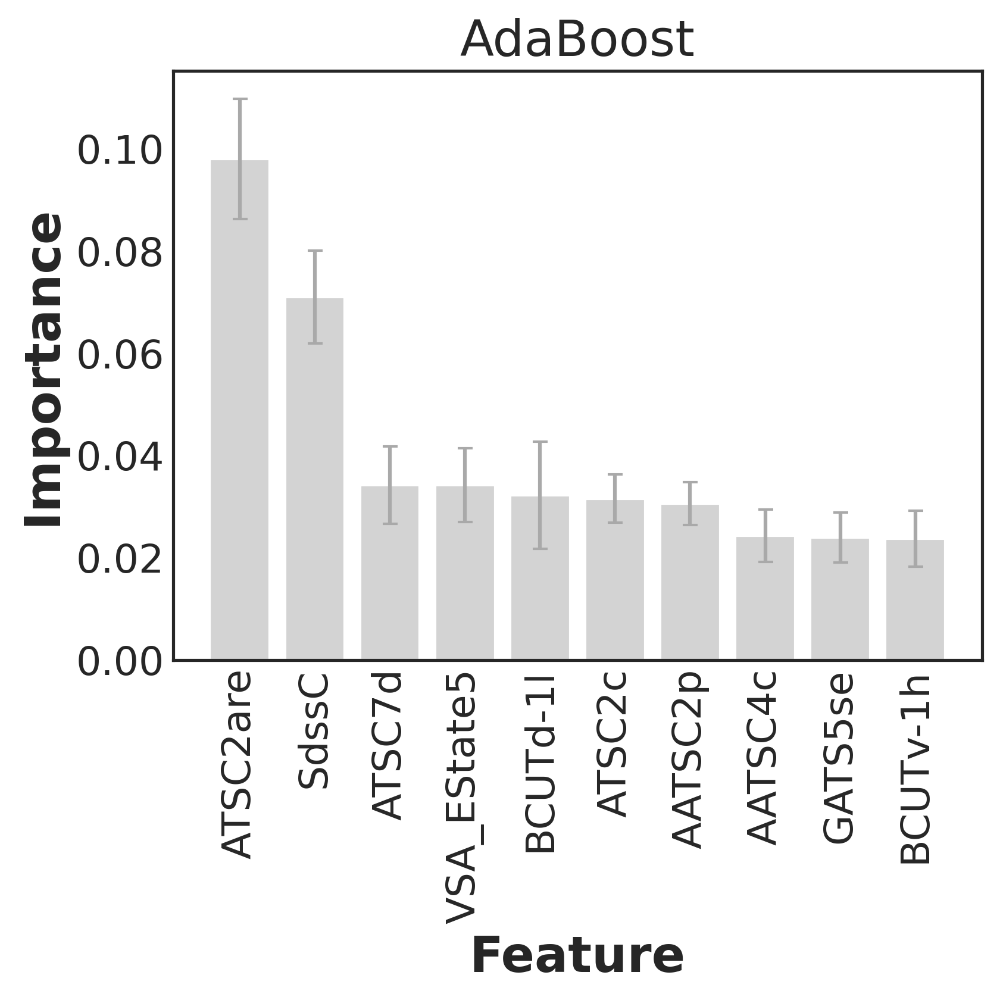

finalized_MLmodel_Nearest_Neighbors.sav
on test set
Nearest Neighbors


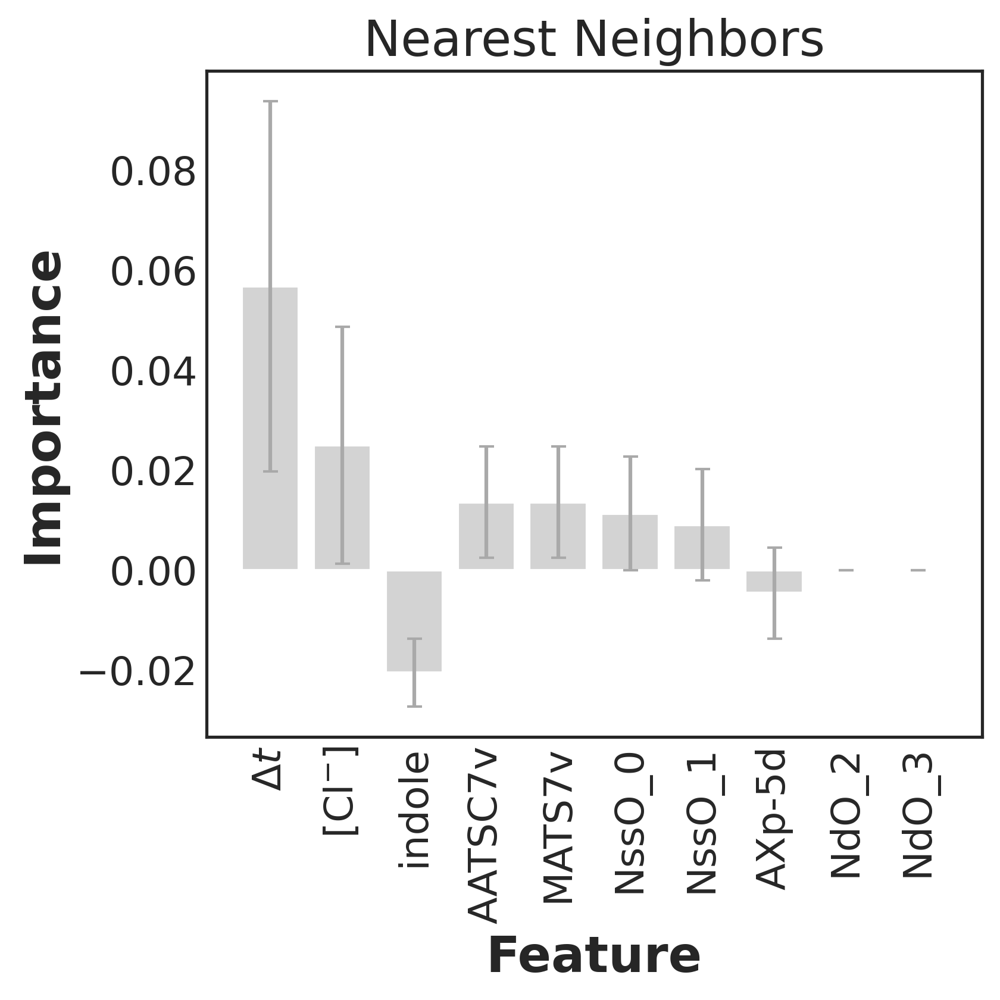

on train set
Nearest Neighbors


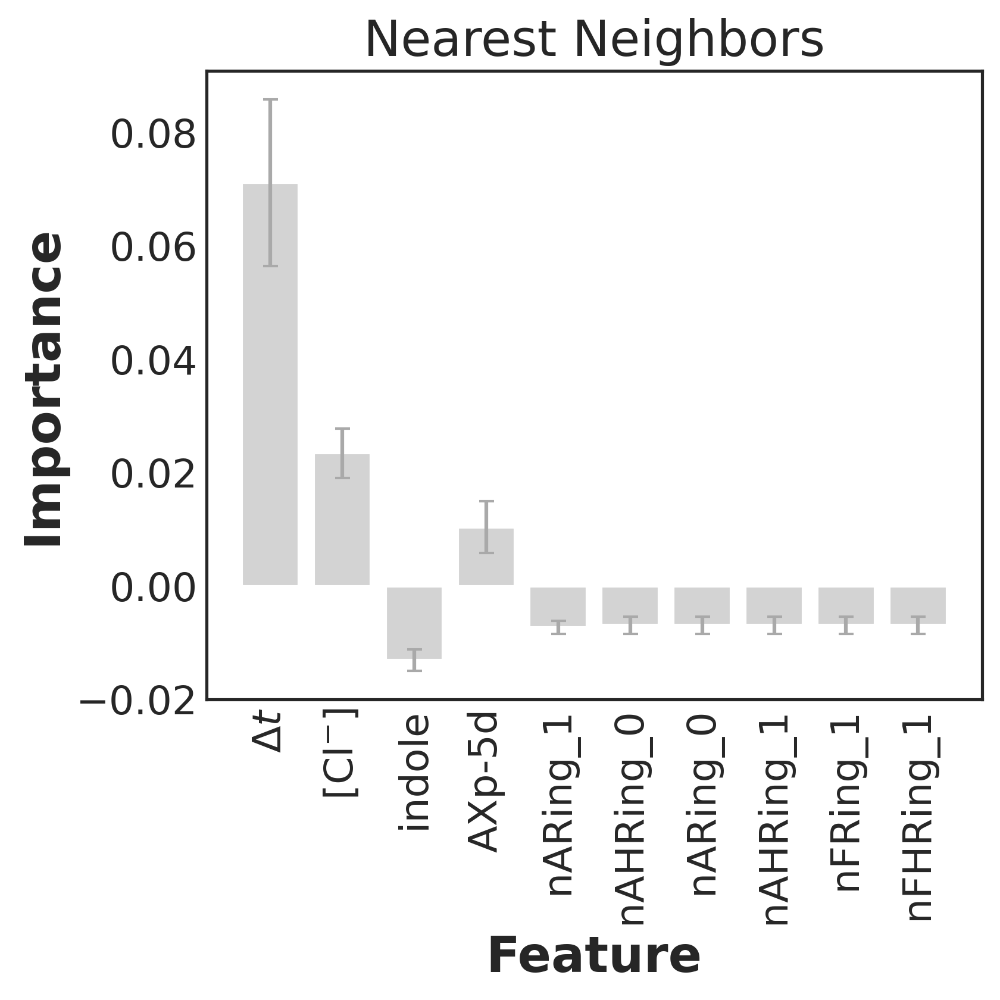

on all set
Nearest Neighbors


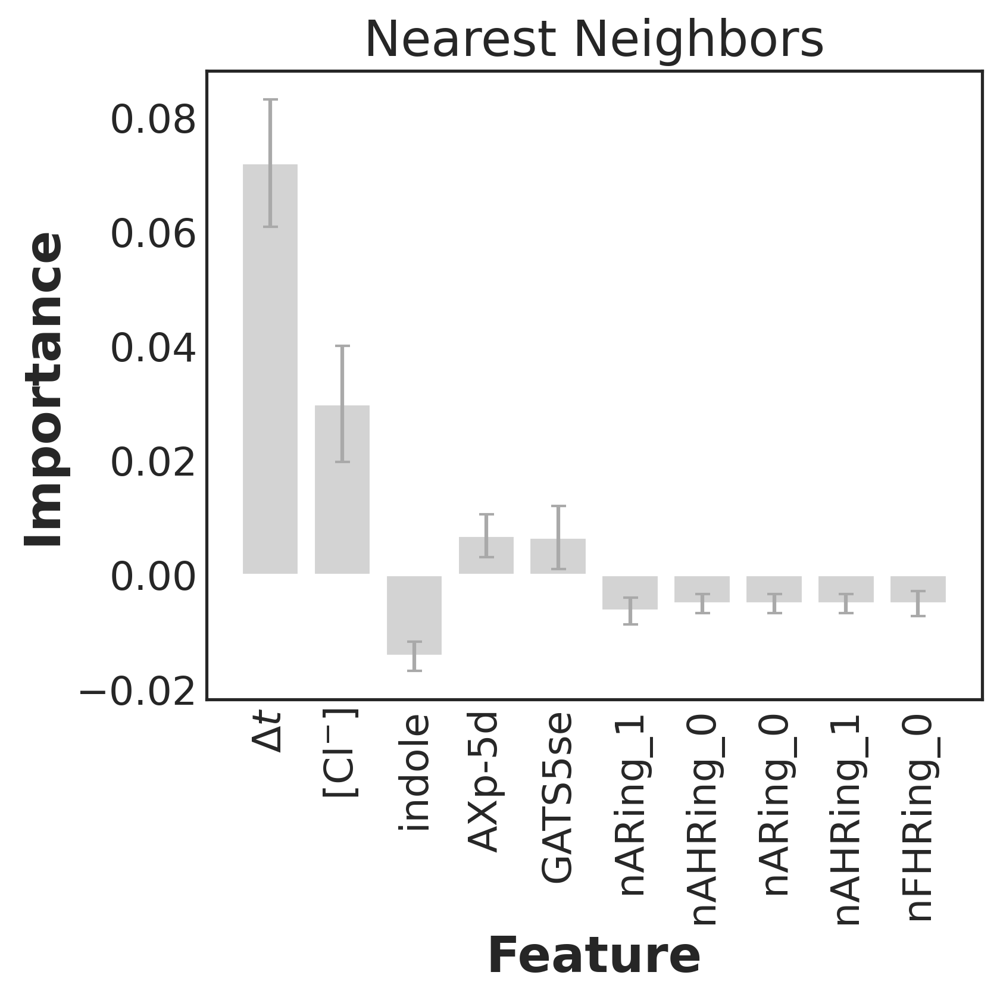

finalized_MLmodel_Logistic_Regression.sav
on test set
Logistic Regression


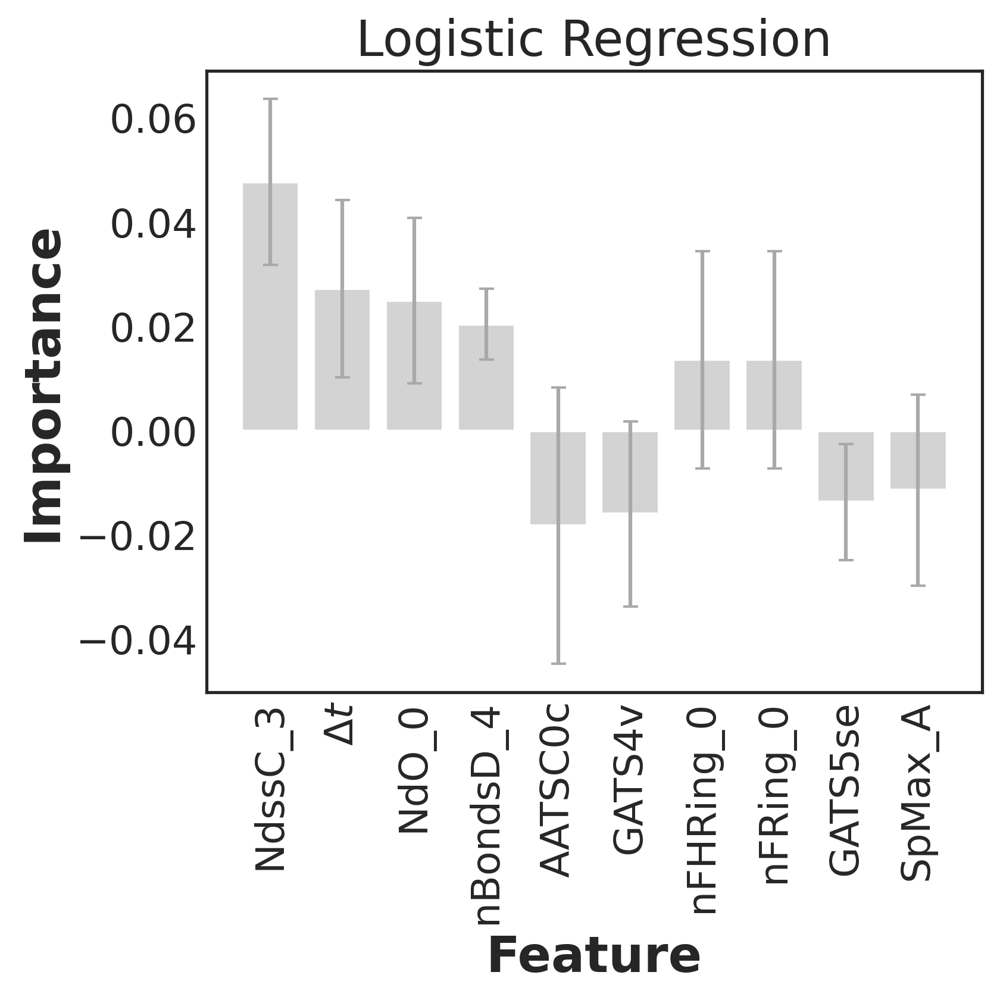

on train set
Logistic Regression


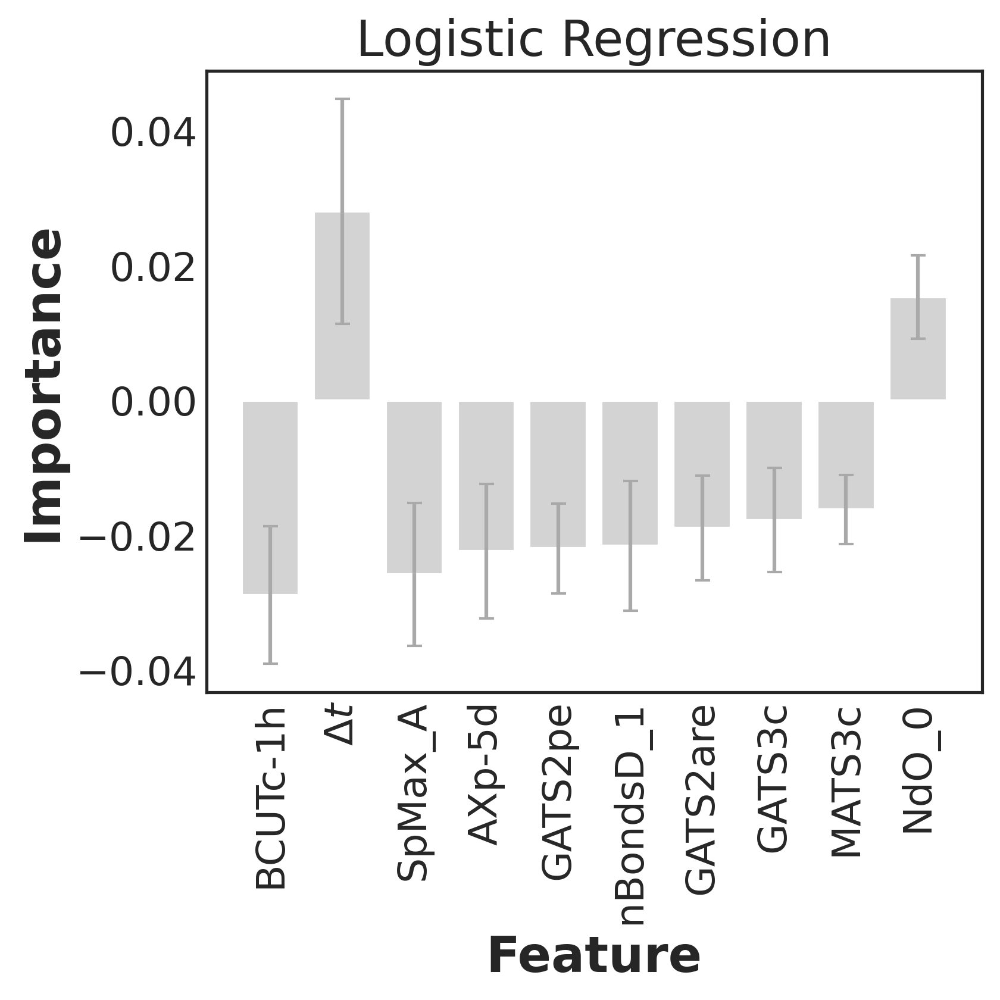

on all set
Logistic Regression


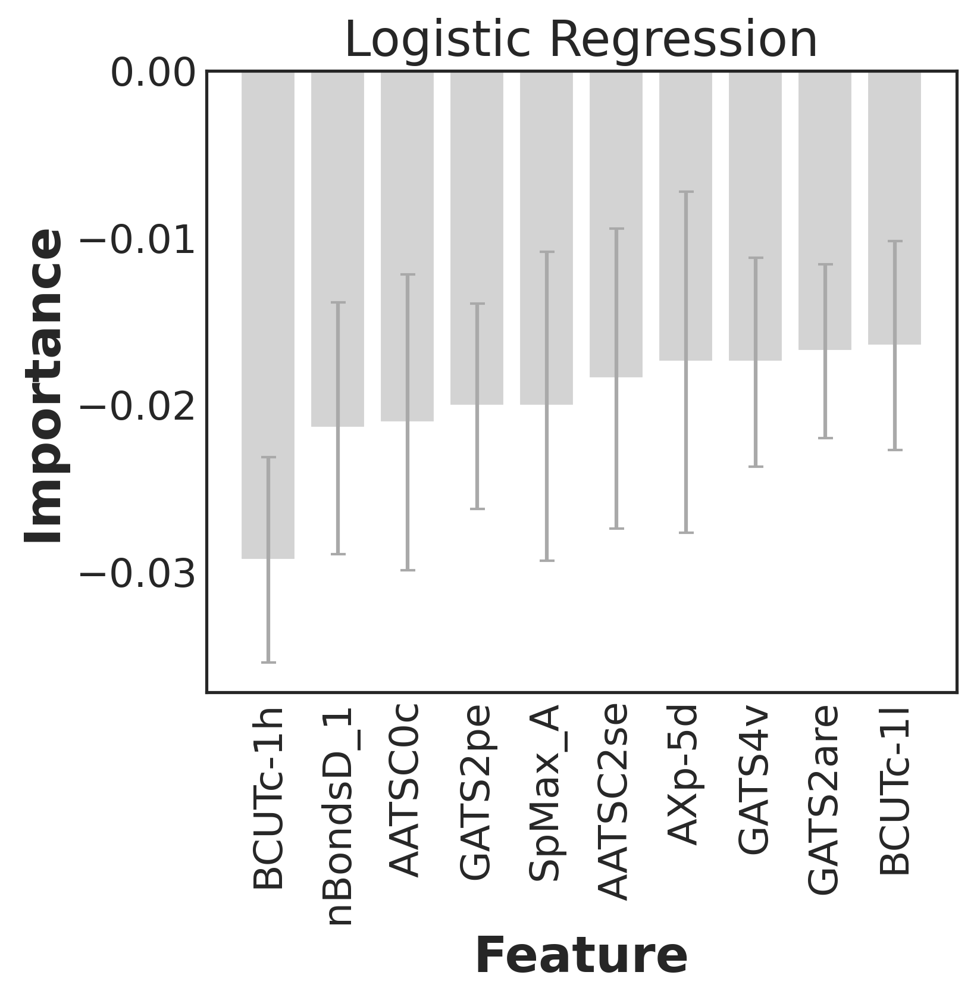

finalized_MLmodel_Gaussian_Process.sav
on test set
Gaussian Process


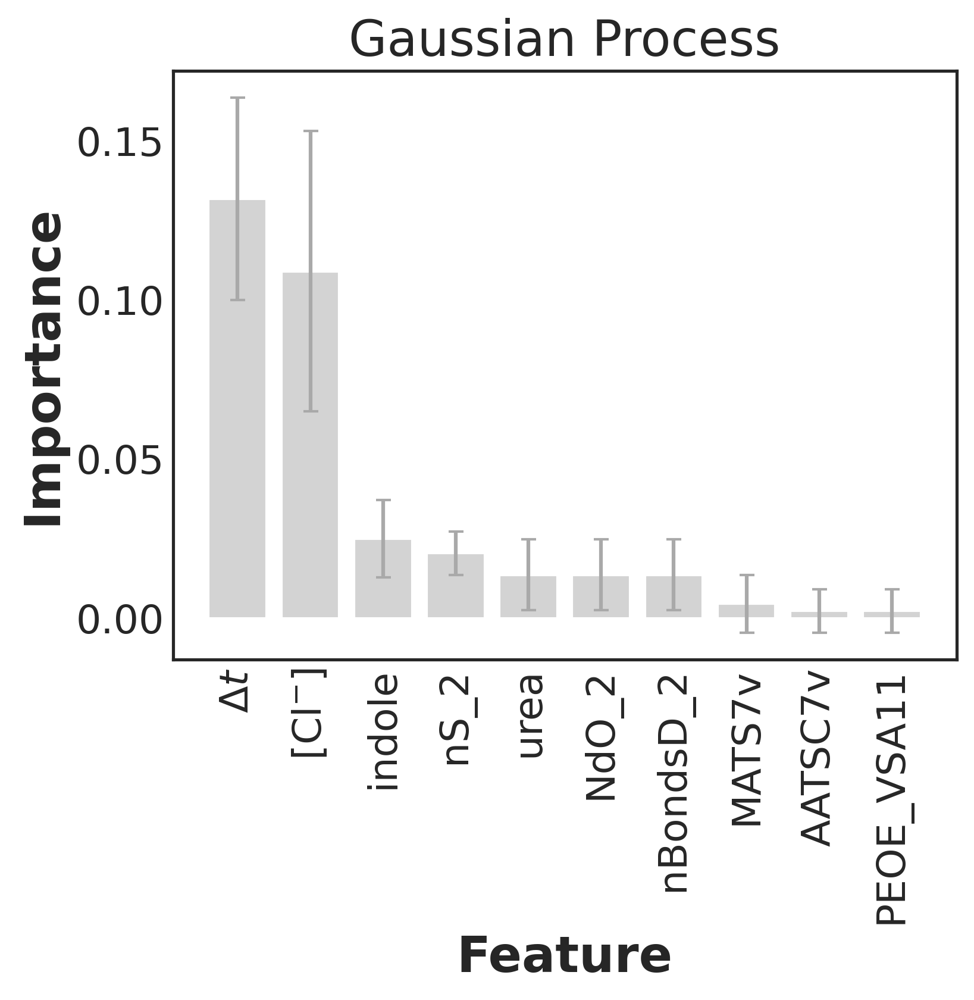

on train set
Gaussian Process


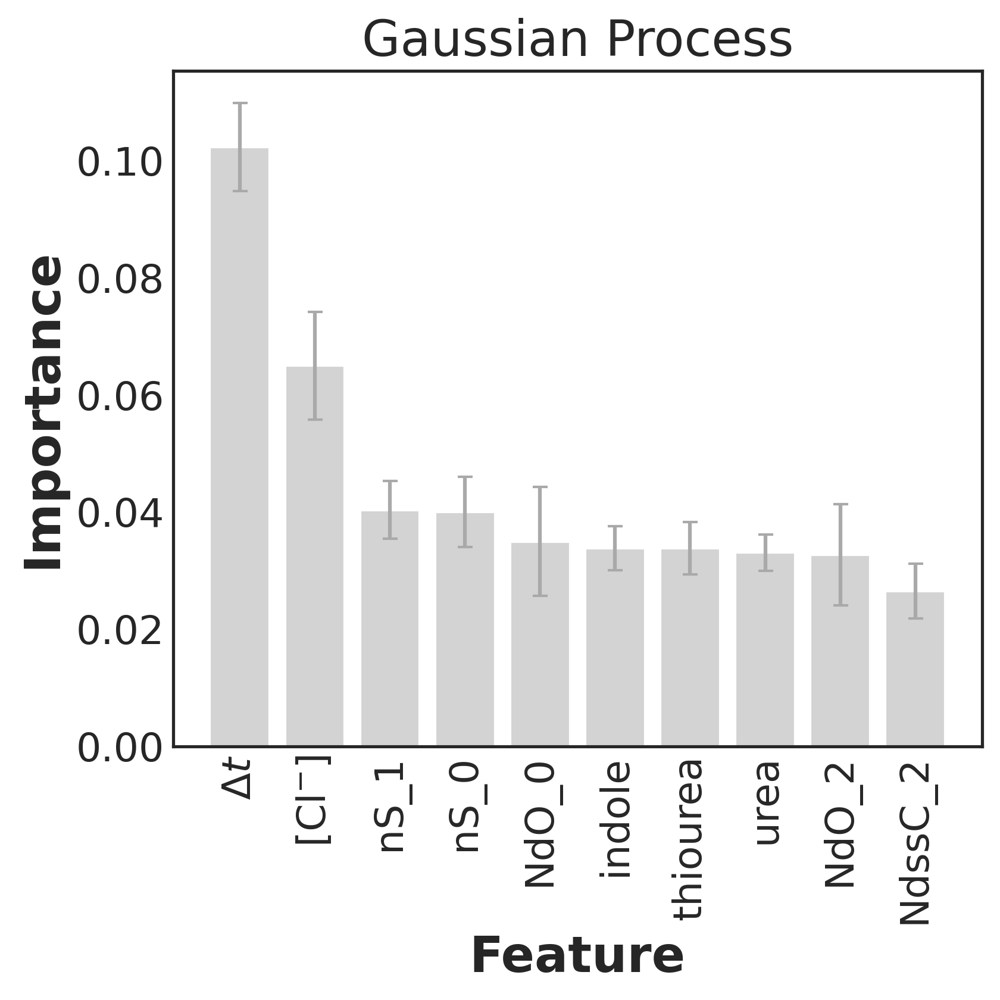

on all set
Gaussian Process


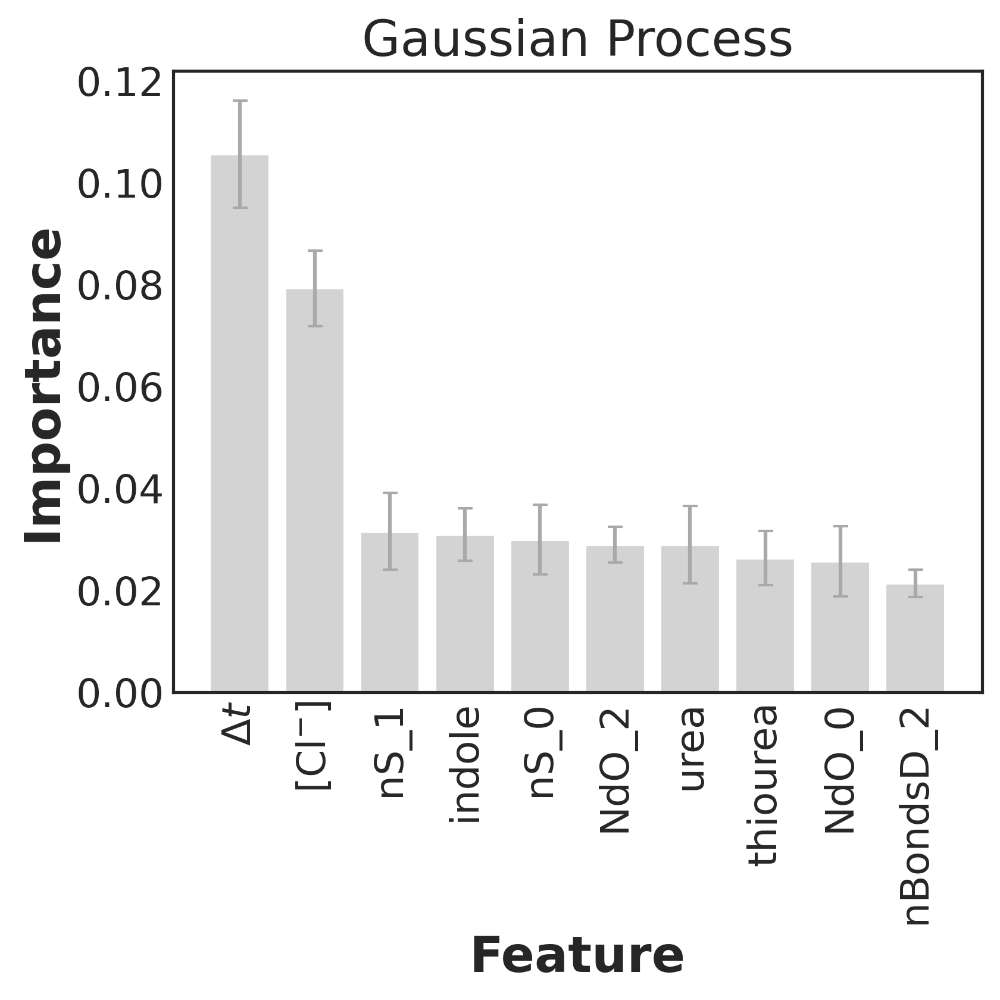

In [490]:
"""
Permutation importance
"""

#model_file = "finalized_MLmodel_ExtraTreesClassifier.sav"

for i in range(len(model_files)):
    model_file = model_files[i]

    print(model_file)

    print("on test set")
    plot_permutation_importance(model_file, x=Xtest, y=Ytest, filename='test')

    print("on train set")
    plot_permutation_importance(model_file, x=Xtrain, y=Ytrain, filename='train')

    print("on all set")
    plot_permutation_importance(model_file, x=X, y=Y, filename='all')

### Important from extra trees classifier

In [491]:
model_file = "finalized_MLmodel_ExtraTreesClassifier.sav"
print(model_file)
model_name = model_file.split(".")[0].replace("finalized_MLmodel_", "")
print(model_name)

clf_shap = joblib.load(model_file)


explainer = shap.TreeExplainer(clf_shap)
importances = clf_shap.feature_importances_

indices = np.argsort(importances)[::-1]
features_names = X.columns
features = []
for a in features_names:
    if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
        a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
    if str(a).startswith("cl_conc_(mm)"):
        a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
    features.append(str(a))

# create a list of feature names and their importance
feature_importance = []
for f in range(X.shape[1]):
    feature_importance.append((features[indices[f]], importances[indices[f]]))
df_feature_importance = pd.DataFrame(feature_importance, columns=["feature", "importance"])

finalized_MLmodel_ExtraTreesClassifier.sav
ExtraTreesClassifier


In [492]:
df_feature_importance = df_feature_importance.sort_values(by='importance', ascending=False)


In [493]:
df_feature_importance

,feature,importance
0,PEOE_VSA6,0.022772
1,n5ARing_0,0.018946
2,AATSC2se,0.018315
3,ATSC7d,0.018281
4,SdssC,0.017504
...,...,...
139,NdO_5,0.000000
140,n5Ring_3,0.000000
141,n5HRing_3,0.000000
142,carbazole,0.000000


## SHAP

In [635]:
# combine Xtrain and Xtest dataframes
X = pd.concat([Xtrain, Xtest])

y = np.concatenate((Ytrain['classes'], Ytest))

In [636]:
y

array([1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,

### Summary plot - Gaussian process

In [494]:
# load model from .sav file

model_file = "finalized_MLmodel_Gaussian_Process.sav"
clf_shap = joblib.load(model_file)


Xk = shap.kmeans(X, 10)

#explaining model
explainer = shap.KernelExplainer(clf_shap.predict_proba, Xk)

shap_values_gp = explainer.shap_values(X)


X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names


  0%|          | 0/304 [00:00<?, ?it/s]

X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
num_full_subsets = 1
remaining_weight_vector = [0.11501445 0.07729969 0.05844997 0.04714642 0.03961609 0.034242
 0.03021566 0.02708792 0.0245893  0.02254829 0.02085057 0.01941701
 0.01819106 0.01713128 0.01620658 0.01539319 0.01467263 0.01403029
 0.01345452 0.01293587 0.0124666  0.01204035 0.01165179 0.01129647
 0.01097061 0.010671   0.01039489 0.01013992 0.00990402 0.00968543
 0.00948257 0.0092941  0.00911879 0.0089556  0.00880358 0.00866188
 0.00852978 0.0084066  0.00829174 0.00818467 0.00808492 0.00799204
 0.00790565 0.0078254  0.00775097 0.00768209 0.00761848 0.00755992
 0.00750621 0.00745715 0.00741257 0.00737234 0.00733631 0.00730438
 0.00727642 0.00725237 0.00723215 0.00721568 0.00720293 0.00719384
 0.0071884  0.00718659]
num_paired_subset_sizes = 62
weight_left = 0.8136619807656926
X does not have valid feature names, but GaussianProcessClassifier was fitted with feature names
np.su

In [495]:
# save shap values
shap_values_gp_df = pd.DataFrame(shap_values_gp[1], columns = X.columns)
shap_values_gp_df.to_csv("shap_values_gp.csv", index=False)


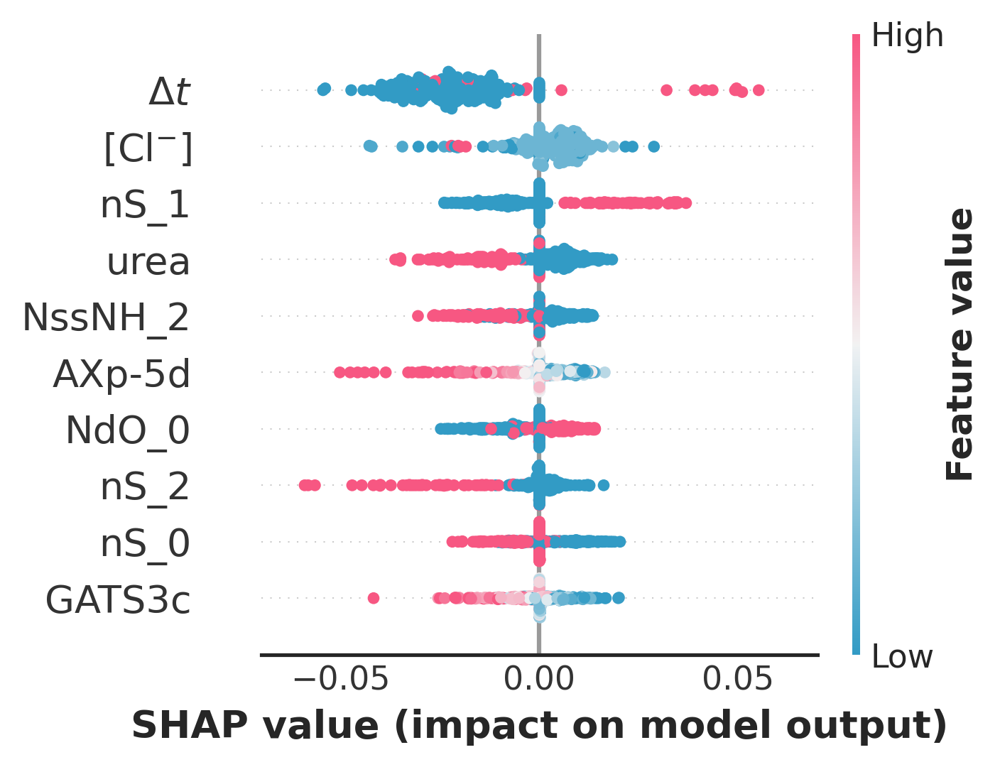

In [596]:
df_shap_values = pd.read_csv("shap_values_gp.csv")
shap_values_gp = df_shap_values.values

model_file = "finalized_MLmodel_Gaussian_Process.sav"
model_name = model_file.split(".")[0].split("finalized_MLmodel_")[-1]


fig = plt.figure(dpi = 300)
# Set the facecolor
fig.set_facecolor('white')

feature_names = []
for a,b in zip(X.columns, np.abs(shap_values_gp).mean(0).round(2)):
    if a == "time_between_transporter_added_and_lysis_(s)":
        a = "$\Delta t$"
    if a == "cl_conc_(mm)":
        a = "[Cl$^{-}]$"
    feature_names.append(str(a))

#shap.summary_plot(shap_values_gp[1], X, max_display=7, cmap='coolwarm', show=False, feature_names=feature_names)
shap.summary_plot(shap_values_gp, X, max_display=10, cmap=sns.diverging_palette(230, 0, 90, 60, as_cmap=True), show=False, feature_names=feature_names)

plt.gcf().set_size_inches(5,4)
plt.xlim([-0.07,0.07])
plt.tight_layout()
plt.savefig("shap_summary_plot_{}_X.png".format(model_name), dpi=300)
plt.show()

### Summary plot - Extra tree

In [601]:

# load model from .sav file
model_file = "finalized_MLmodel_ExtraTreesClassifier.sav"
#model_file = "finalized_MLmodel_Gaussian_Process.sav"
clf_shap = joblib.load(model_file)

#explaining model
#explainer = shap.KernelExplainer(clf_shap.predict_proba, Xtrain)
    
#For tree like models you can use
explainer = shap.TreeExplainer(clf_shap)

#For linear models you can use
#explainer = shap.LinearExplainer(clf_shap, Xtrain)
shap_values = explainer.shap_values(X)

# save shap values
shap_values_et_df = pd.DataFrame(shap_values[1], columns = X.columns)
shap_values_et_df.to_csv("shap_values_et.csv", index=False)


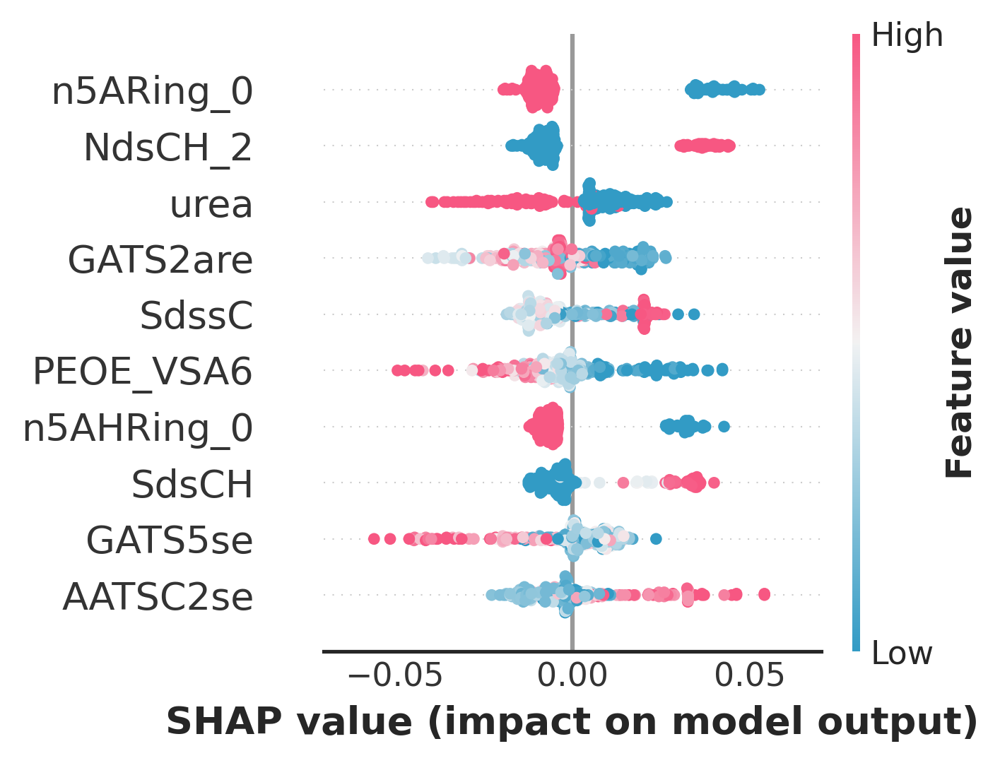

In [613]:
fig = plt.figure(dpi = 300)
# Set the facecolor
fig.set_facecolor('white')

feature_names = []
for a,b in zip(X.columns, np.abs(shap_values[1]).mean(0).round(2)):
    if str(a).startswith("time_between_transporter_added_and_lysis_(s)"):
        a= str(a).replace("time_between_transporter_added_and_lysis_(s)","$\Delta t$")
    if str(a).startswith("cl_conc_(mm)"):
        a= str(a).replace("cl_conc_(mm)", "[Cl$^{-}]$")
    feature_names.append(str(a))

shap.summary_plot(shap_values[1], X, max_display=10, cmap=sns.diverging_palette(230, 0, 90, 60, as_cmap=True), show=False, feature_names=feature_names)

plt.gcf().set_size_inches(5,4)
plt.xlim([-0.07,0.07])
plt.tight_layout()
plt.savefig("shap_summary_plot_{}_X.png".format(model_name), dpi=300)
plt.show()

# Supervised clustering with shap

In [678]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [679]:
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import MaxNLocator
cdict1 = {
    'red': ((0.0, 0.11764705882352941, 0.11764705882352941),
            (1.0, 0.9607843137254902, 0.9607843137254902)),

    'green': ((0.0, 0.5333333333333333, 0.5333333333333333),
              (1.0, 0.15294117647058825, 0.15294117647058825)),

    'blue': ((0.0, 0.8980392156862745, 0.8980392156862745),
             (1.0, 0.3411764705882353, 0.3411764705882353)),

    'alpha': ((0.0, 1, 1),
              (0.5, 1, 1),
              (1.0, 1, 1))
}  # #1E88E5 -> #ff0052
red_blue_solid = LinearSegmentedColormap('RedBlue', cdict1)

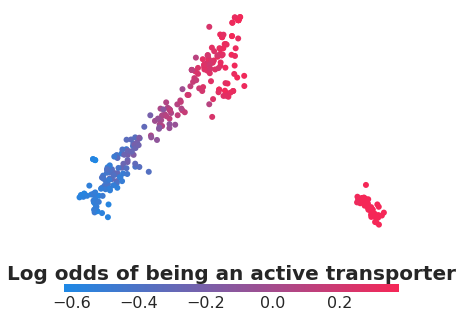

In [763]:
shap_pca50 = PCA(n_components=2).fit_transform(shap_values[1])

f = plt.figure(figsize=(6,6))
plt.scatter(shap_pca50[:,0],
           shap_pca50[:,1],
           c=shap_values[1].sum(1).astype(np.float64),
           linewidth=0, alpha=1., cmap=red_blue_solid)
cb = plt.colorbar(label="Log odds of being an active transporter", aspect=40, orientation="horizontal")
cb.set_alpha(1)
cb.draw_all()
cb.outline.set_linewidth(0)
cb.ax.tick_params('x', length=0)
cb.ax.xaxis.set_label_position('top')
plt.gca().axis("off")
plt.show()

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.


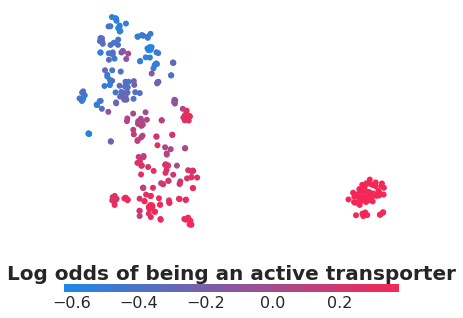

In [764]:
shap_embedded = TSNE(n_components=2).fit_transform(shap_values[1])

f = plt.figure(figsize=(6,6))
plt.scatter(shap_embedded[:,0],
           shap_embedded[:,1],
           c=shap_values[1].sum(1).astype(np.float64),
           linewidth=0, alpha=1., cmap=red_blue_solid)
cb = plt.colorbar(label="Log odds of being an active transporter", aspect=40, orientation="horizontal")
cb.set_alpha(1)
cb.draw_all()
cb.outline.set_linewidth(0)
cb.ax.tick_params('x', length=0)
cb.ax.xaxis.set_label_position('top')
plt.gca().axis("off")
plt.show()

In [689]:
sv_2d = shap_embedded.copy()

In [760]:
# Identify clusters using DBSCAN
# DBSCAN is a density-based clustering algorithm that identifies clusters of any shape in a dataset containing noise and outliers.
# eps is the maximum distance between two samples for one to be considered as in the neighborhood of the other.
# min_samples is the number of samples (or total weight) in a neighborhood for a point to be considered as a core point.
sv_2d_labels = DBSCAN(eps=1.4, min_samples=10).fit(sv_2d).labels_

In [761]:
# for each cluster identified, check count and central coordinates of cluster
cluster_labels = pd.Series(sv_2d_labels).value_counts().sort_index().index
print(cluster_labels)
for cluster, count in pd.Series(sv_2d_labels).value_counts().sort_index().items():
    print(cluster, count, sv_2d[sv_2d_labels == cluster].mean(0))


Int64Index([-1, 0, 1, 2, 3], dtype='int64')
-1 250 [-1.6410903  -0.29082516]
0 14 [-0.44452092  4.8319955 ]
1 10 [-10.487654 -16.015968]
2 10 [ 0.535292 -9.208305]
3 20 [38.508904   1.9220288]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


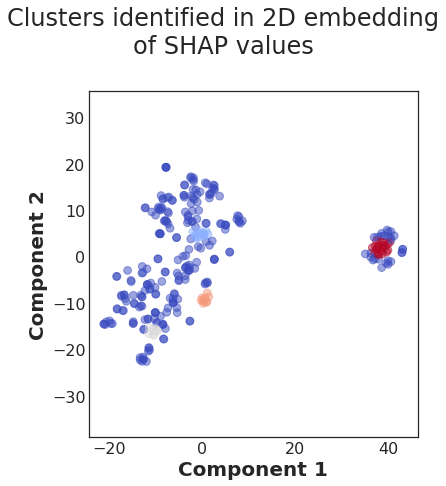

In [762]:
fig, ax = plt.subplots(figsize=(6, 7))
ax.scatter(sv_2d[:, 0], sv_2d[:, 1], c=sv_2d_labels, cmap="coolwarm", alpha=0.5, s=60)
ax.axis("equal")
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")
ax.legend()
fig.suptitle(
    "Clusters identified in 2D embedding\nof SHAP values",
)
fig.tight_layout()

fig.savefig("2D_SHAP_clusters.png", dpi=75)